In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import torch
from torch.utils.data import DataLoader
import torch.optim as optim
import yaml
import pprint
import os
import time
# weights and biases for tracking of metrics
import wandb 
# make the plots inline again
%matplotlib inline
# sometimes have to activate this to plot plots in notebook
# matplotlib.use('Qt5Agg')
from code import *

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

### Load and pprint config

In [3]:
stream = open("config_fit_df.yaml", 'r')
config = yaml.load(stream, Loader = yaml.FullLoader)

# This is for the MLPs of the flow
config['HIDDEN_DIM_SPLINE_MLP'] = HIDDEN_DIM_SPLINE_MLP
config['HIDDEN_DIM_MOEBIUS_MLP'] = HIDDEN_DIM_MOEBIUS_MLP
config['HIDDEN_DIM_ROTATION_MLP'] = HIDDEN_DIM_ROTATION_MLP

### Set globabl variables and load data
BATCH_SIZE = config['BATCH_SIZE']

# NUM_FLOWS_COU = config['NUM_FLOWS_COU']
# NUM_FLOWS_CYL = config['NUM_FLOWS_CYL']
# NUM_CENTERS = config['NUM_CENTERS']
# NUM_BINS = config['NUM_BINS']
# NUM_DIM_DATA = config['NUM_DIM_DATA']

# flow params
NUM_DIM_DATA = 3
NUM_CENTERS = 8
NUM_BINS = 8
NUM_FLOWS_COU = 3
NUM_FLOWS_CYL = 3

CAP_HOUSEHOLDER_REFL = False

nr_mixtures = config['nr_mixtures']
epochs = config['epochs']
eval_iter = config['eval_iter']
print_iter = config['print_iter']
lookahead = config['lookahead']
nr_datapoints = config['nr_datapoints_eval']

lr = config['lr']
weight_decay = config['weight_decay']

# data parameters
# nr_mixtures = config['nr_mixtures']

# dataset type

dataset_type = config['dataset_type']

ITERS_PER_EPOCH = config['iters_per_epoch']

PROJECT_NAME = f'DIM_{NUM_DIM_DATA}'

pp = pprint.PrettyPrinter(indent=1)
pp.pprint(config)

{'BATCH_SIZE': 256,
 'HIDDEN_DIM_MOEBIUS_MLP': 64,
 'HIDDEN_DIM_ROTATION_MLP': 64,
 'HIDDEN_DIM_SPLINE_MLP': 128,
 'dataset_type': 'standard',
 'epochs': 20,
 'eval_iter': 100,
 'iters_per_epoch': 400,
 'lookahead': 10,
 'lr': 0.001,
 'nr_datapoints_eval': 100000,
 'nr_mixtures': 4,
 'print_iter': 10,
 'weight_decay': 0.01}


### get location and scale parameters

In [4]:
# # code for creating dataset on the poles
# from random import random
# eps = random()*0.2
# mu_list = np.array([[eps, eps, 1+eps],
#                          [eps, eps, -1+eps],
#                          [1, eps, eps]], dtype='float32')

# k_list = 1.5*np.array([13, 14,  12],dtype='float32')

# mu_list = mu_list / np.linalg.norm(mu_list,axis=1,keepdims=True)
# np.linalg.norm(mu_list,axis=1,keepdims=True)


if NUM_DIM_DATA == 3 and dataset_type == 'standard':

    mu_list = np.array([[-4.7503373e-01, -8.7996745e-01, -5.0922018e-04],
                        [-1.6167518e-01,  6.5595394e-01, -7.3728257e-01],
                        [ 2.6248896e-01,  6.9851363e-01,  6.6571641e-01],
                        [ 1.0,  0,  0.0]], dtype='float32')

    k_list = 1.5*np.array([13, 14,  12, 15],dtype='float32')

    phi_mu_list = np.array([-2.06579875,  1.81245307,  1.2113401, 0],dtype='float32')
    theta_mu_list =  np.array([-5.09220198e-04, -8.29039128e-01,  7.28453441e-01, 0],dtype='float32')
    
elif NUM_DIM_DATA == 3 and dataset_type == 'poles':
    
    mu_list = np.array([[ 0.14887695,  0.14887695,  0.9775844 ],
                        [ 0.20918883,  0.20918883, -0.9552383 ],
                        [ 0.96920884,  0.17411795,  0.17411795]], dtype='float32')
    
    k_list = 1.5*np.array([13, 14,  12],dtype='float32')
    
    phi_mu_list = np.array([0.7853982, 0.7853982, 0.1777535],dtype='float32')
    theta_mu_list =  np.array([ 1.3586651 , -1.2704642 ,  0.17500998],dtype='float32')
    
elif NUM_DIM_DATA == 3 and dataset_type == 'poles_2':
    
    mu_list = np.array([[ 0,  0,  1 ],
                        [ 0,  0, -1 ]], dtype='float32')
    
    k_list = 1.5*np.array([13, 14],dtype='float32')
    
    phi_mu_list = np.array([0, 0],dtype='float32')
    theta_mu_list =  np.array([ np.pi/2 , -np.pi/2],dtype='float32')    
    
else:    
    torch.manual_seed(42) # mu created with torch
    np.random.seed(42) # k with numpy
    mu_list, k_list, phi_mu_list, theta_mu_list = create_random_parameters(nr_mixtures, num_dim_data = NUM_DIM_DATA)
        



### 3d and N dim Power Spherical Data

14it [00:00, 133.42it/s]

Secs for entropy calc 0.6509733200073242
With entropy 1.781076431274414
Entropy 1.781076431274414


100it [00:00, 158.56it/s]


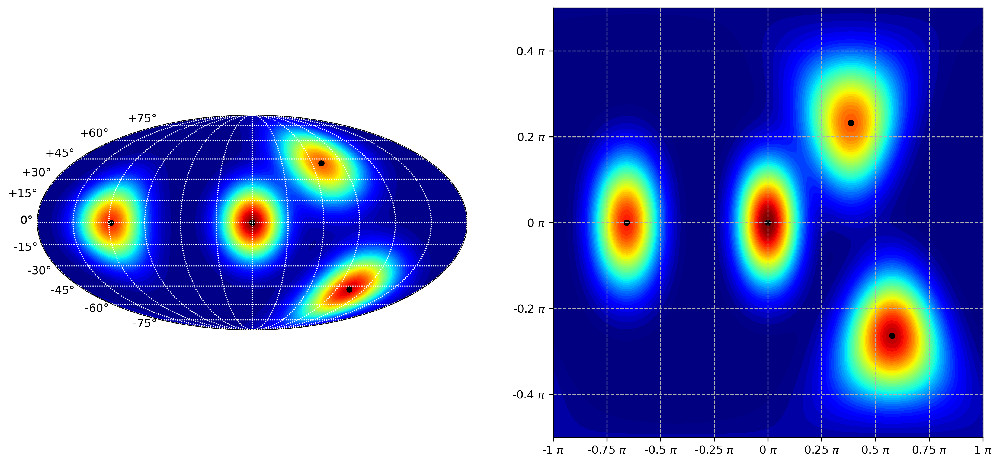

--- 2.5178451538085938 seconds ---
numerical integral of density w tensor(1.0005)


In [5]:
# Power Spherical 

# for consistent entropy calculation
power_spherical_data = PowerSphericalData(mu_list=mu_list, k_list=k_list, nr_samples=BATCH_SIZE*ITERS_PER_EPOCH)

print(f'Entropy {power_spherical_data.entropy.detach().numpy()}')

# add parameters to config
config['nr_mixtures'] = len(mu_list)
config['mu_list'] = mu_list
config['k_list'] = k_list
config['phi_mu_list'] = phi_mu_list
config['theta_mu_list'] = theta_mu_list

if NUM_DIM_DATA == 3:
    
    start_time = time.time()
    probs, probs_with_cos, phi_linspace, theta_linspace = plot_power_spherical_density(mu_list, k_list,phi_mu_list,theta_mu_list)
    print("--- %s seconds ---" % (time.time() - start_time))

    dphi = phi_linspace[1] - phi_linspace[0]
    dtheta = theta_linspace[1] - theta_linspace[0]

    print('numerical integral of density w', torch.sum(probs_with_cos) * dphi * dtheta)

In [6]:
def bmatrix(a):
    """Returns a LaTeX bmatrix

    :a: numpy array
    :returns: LaTeX bmatrix as a string
    """
    if len(a.shape) > 2:
        raise ValueError('bmatrix can at most display two dimensions')
    lines = str(a).replace('[', '').replace(']', '').splitlines()
    rv = [r'\begin{bmatrix}']
    rv += ['  ' + ' & '.join(l.split()) + r'\\' for l in lines]
    rv +=  [r'\end{bmatrix}']
    return '\n'.join(rv)

### train function 

In [5]:
def get_num_params(model):
    
    total_number_params = 0
    
    for name, parameter in model.named_parameters():
        total_number_params += parameter.numel()
    return total_number_params

def train_model(model, 
                optimizer, 
                dataset, 
                config,
                model_name):
    
    
    epochs = config['epochs']
    config['NUM_PARAMS'] = get_num_params(model)

    # init weights and biases tracking
    ts = time.strftime('%m%d_%H%M%S', time.localtime(time.time()))
    
    if model.flow_type == 'moebius':
        model_name = f"{model_name}_NC_{NUM_CENTERS}_NF_{model.num_flows}"
        
    elif model.flow_type == 'spline':
        model_name = f"{model_name}_NB_{NUM_BINS}_NF_{model.num_flows}"
        
    wandb.init(project=PROJECT_NAME,
               config=config,
               name=model_name,
               id=ts)
    
    best_KL = 1e3
    epoch_of_best_run = 0
    
    # According to w and b documentation this is magic. Okay, let's see
    wandb.watch(model)
    
    print('##### Model #####')
    print(model)
    print('#################\n')
    
    print('##### Config #####')
    pp = pprint.PrettyPrinter(indent=1)
    pp.pprint(config)
    print('##################\n')    
    
    train_loader = DataLoader(dataset, batch_size=config['BATCH_SIZE'], shuffle=True)
    
    # get properties of dataset class
    phi_mu_list, theta_mu_list = dataset.spherical_parameters
    entropy = dataset.entropy
    
    print(f'Entropy of data: {entropy}')

    max_steps = config['iters_per_epoch']
    
    num_dim_data = model.num_dim_data
    
    # initialize loss. 
    loss_fn = Loss_on_sphere(n_dim_sphere = num_dim_data - 1)
    
    for epoch in range(epochs):
        
        print(f"Epoch: {epoch} / {epochs-1}")
        
        if num_dim_data == 3:
        
            # actually the calculation here is partly redundant because we anyway later evalaute the model on a test set            
            eval_and_plot_model(model, 
                                nr_gridpoints = 100, 
                                epoch = epoch, 
                                batch_idx = 0, 
                                phi_mu_list=phi_mu_list, 
                                theta_mu_list=theta_mu_list, 
                                x_conditioner = None)

        start_time = time.time()
        for batch_idx, x_train in enumerate(train_loader): 

            x_train = x_train.float().to(device)

            optimizer.zero_grad()

            z, ldj, _ = model(x_train)

            loss = loss_fn.calc_loss(ldj)
                          
            # calculate gradient with repsect to ldj and not whole nll, 
            # because our prior is uniform and therefore this way is less expensive
            (-torch.mean(ldj)).backward()
#             loss.backward()

            optimizer.step()

            nll = float(loss.detach().cpu().numpy()) 
            KL = nll - entropy
                            
            if batch_idx % config['print_iter'] == 0: 
                print(f'Epoch: {epoch}/{epochs-1}, i/N: {batch_idx}/{max_steps} with KL {KL:.2f} and nll loss {nll:.2f}')                
                  
            def eval_model():
                
                nr_datapoints = config['nr_datapoints_eval']

                # KL evaluation based on nr_datapoints samples from data distribution
                test_data = dataset.get_test_set(nr_samples = nr_datapoints).to(device)

                with torch.no_grad():

                    model.eval()
                    z, ldj, _ = model(test_data)

                    nll_test = loss_fn.calc_loss(ldj)
                    KL_test = nll_test - entropy

                    # MC evaluation based on nr_datapoints uniform samples on the sphere
                    x_eval = torch.randn(nr_datapoints, num_dim_data).to(device)
                    x_eval = x_eval / torch.norm(x_eval, dim=1, keepdim=True)

                    z, ldj0, _ = model(x_eval)
                    model.train()                

                print()
                print(f'#### EVALUATION ####')
                print(f'Evaluation based on {nr_datapoints} data points from data distribution samples')
                print(f'Epoch: {epoch}/{epochs-1}, i/N: {batch_idx}/{max_steps} KL_test {KL_test} and nll_test {nll_test}')

                print('\nFrom current batch')
                print(f'Epoch: {epoch}, i/N: {batch_idx}/{max_steps} avg ldj from current batch {torch.mean(ldj):.2f}')

                print(f'\nFrom {nr_datapoints} uniform samples')
                print(f'Epoch: {epoch}/{epochs-1}, i/N: {batch_idx}/{max_steps} MC density sum {torch.mean(torch.exp(ldj0)):.2f}')
                print(f'Epoch: {epoch}/{epochs-1}, i/N: {batch_idx}/{max_steps} avg ldj {torch.mean(ldj0):.2f}')
                print('#####################')
                print()
                
                wandb.log({"KL_train": KL,
                           "neg_log_likel_train": nll,
                           "KL_test": KL_test,
                           "neg_log_likel_test": nll_test,            
                           "MC_integral": torch.mean(torch.exp(ldj0))})  
                
                return KL_test, nll_test
                
                
            if batch_idx % config['eval_iter'] == 0:
                KL_test, nll_test = eval_model()
                
#                 # This part is for additional evaluation of 
#                 model.eval()
#                 print()
#                 print('#####################')

#                 # first, second and both coupling w/o rotation
#                 sldj_test = torch.zeros(nr_datapoints).to(device)       
                
#                 x_out, ldj_first, _ = model.scale[1](x_eval, sldj_test) 
#                 _, ldj_second, _  = model.scale[3](x_eval, sldj_test) 
                
#                 _, ldj_first_second, _  = model.scale[3](x_out, ldj_first)                  

#                 print(f'Epoch: {epoch}/{epochs-1}, i/N: {batch_idx}/{max_steps} MC density sum first flow only moeb {torch.mean(torch.exp(ldj_first)):.2f}')
#                 print(f'Epoch: {epoch}/{epochs-1}, i/N: {batch_idx}/{max_steps} MC density sum second flow only moeb {torch.mean(torch.exp(ldj_second)):.2f}') 
#                 print(f'Epoch: {epoch}/{epochs-1}, i/N: {batch_idx}/{max_steps} MC density sum first and second flow only moeb {torch.mean(torch.exp(ldj_first_second)):.2f}')
#                 print()
                
#                 sldj_test = torch.zeros(nr_datapoints).to(device)
#                 x_out, ldj, _ = model.scale[0](x_eval, sldj_test)
#                 x_out, ldj1, _ = model.scale[1](x_out, ldj)
                
#                 print(f'Epoch: {epoch}/{epochs-1}, i/N: {batch_idx}/{max_steps} MC density first flow incl rot {torch.mean(torch.exp(ldj1)):.2f}') 
                
#                 sldj_test = torch.zeros(nr_datapoints).to(device)
#                 x_out, ldj, _ = model.scale[2](x_eval, sldj_test)
#                 x_out, ldj2, _ = model.scale[3](x_out, ldj)
                
#                 print(f'Epoch: {epoch}/{epochs-1}, i/N: {batch_idx}/{max_steps} MC density second flow incl rot {torch.mean(torch.exp(ldj2)):.2f}')   
                
#                 sldj_test = torch.zeros(nr_datapoints).to(device)
#                 x_out, ldj, _ = model.scale[0](x_eval, sldj_test)
#                 x_out, ldj, _ = model.scale[1](x_out, ldj)                
#                 x_out, ldj, _ = model.scale[2](x_out, ldj)
#                 x_out, ldj12, _ = model.scale[3](x_out, ldj)

#                 print(f'Epoch: {epoch}/{epochs-1}, i/N: {batch_idx}/{max_steps} MC density first&second flow incl rot {torch.mean(torch.exp(ldj12)):.2f}')                   
                
#                 print('#####################')
#                 print()
#                 model.train()                
                
                # store the metrics in the log. Call logger after eval and plot model because we also log plots inside
                   
            def store_model(best_vs_last):
                if not os.path.exists(f'models_fit_df/dim_{num_dim_data}'):
                    os.makedirs(f'models_fit_df/dim_{num_dim_data}')
                # also store model in the end
                state = {
                    'epoch': epoch,
                    'batch_index': batch_idx,
                    'state_dict': model.state_dict(),
                    'optimizer': optimizer.state_dict(),
                    'config': config
                }                        

                torch.save(state, f"models_fit_df/dim_{num_dim_data}/{best_vs_last}_{model_name}_model.t7")
                wandb.save(f"models_fit_df/dim_{num_dim_data}/{best_vs_last}_{model_name}_model.t7")  
                

            # save the best model but do not save any model during the first 50 iterations
            if not (epoch == 0 and batch_idx < 50):

                if KL_test < best_KL:

                    store_model(best_vs_last='best')

                    best_KL = KL_test
                    epoch_of_best_run = epoch
                    
                    wandb.run.summary["KL_best"] = KL_test
                    wandb.run.summary["nll_best"] = nll_test
                    
                    wandb.run.summary["epoch_of_best_KL"] = epoch_of_best_run
                    wandb.run.summary["batch_id_of_best_KL"] = batch_idx                    
                    
                    wandb.run.summary["KL_current_batch"] = KL
                    wandb.run.summary["nll_current_batch"] = nll
           
        
        wandb.log({"time_per_epoch": time.time()-start_time},commit=False)
        
        # if there was no improvement after a certain amount of epochs terminate training    
        if (epoch - epoch_of_best_run) >= config['lookahead']:
            print()
            print('#### EARLY STOPPING ####')
            print(f'at epoch {epoch} and batch_id {batch_idx}')
            print('########################')
            print()
            break
                
                                        
    # also store model in the end        
    store_model(best_vs_last='last')
    
    wandb.run.summary["last_epoch"] = epoch
    
    _,_ = eval_model()
    
    if num_dim_data == 3:
        eval_and_plot_model(model, 
                            nr_gridpoints = 100, 
                            epoch = epoch, 
                            batch_idx = 0, 
                            phi_mu_list=phi_mu_list, 
                            theta_mu_list=theta_mu_list, 
                            x_conditioner = None)

### Coupling Moebius Flow

##### Coupling Moebius Flow #####


wandb: Wandb version 0.10.12 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


##### Model #####
Coupling_Flow(
  (scale): ModuleList(
    (0): Rotation()
    (1): Coupling(
      (cond_rotation): Rotation(
        (householder_params): MLP(
          (nn): Sequential(
            (0): Linear(in_features=1, out_features=128, bias=True)
            (1): ReLU()
            (2): Linear(in_features=128, out_features=4, bias=True)
          )
        )
      )
      (circle_transf): Moebius_Flow(
        (param_predictor): MLP(
          (nn): Sequential(
            (0): Linear(in_features=1, out_features=128, bias=True)
            (1): ReLU()
            (2): Linear(in_features=128, out_features=16, bias=True)
          )
        )
      )
    )
    (2): Rotation()
    (3): Coupling(
      (cond_rotation): Rotation(
        (householder_params): MLP(
          (nn): Sequential(
            (0): Linear(in_features=1, out_features=128, bias=True)
            (1): ReLU()
            (2): Linear(in_features=128, out_features=4, bias=True)
          )
        )
      )


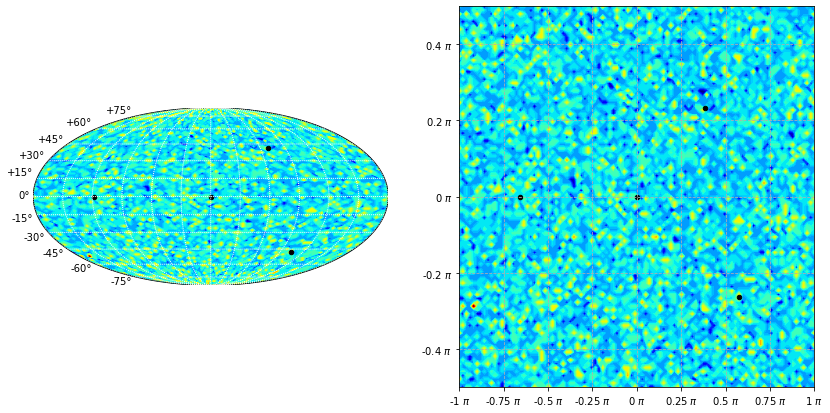

Epoch:0 batch id: 0
Epoch: 0/19, i/N: 0/400 with KL 0.75 and nll loss 2.53

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 0/19, i/N: 0/400 KL_test 0.7499136924743652 and nll_test 2.5309901237487793

From current batch
Epoch: 0, i/N: 0/400 avg ldj from current batch 0.00

From 100000 uniform samples
Epoch: 0/19, i/N: 0/400 MC density sum 1.00
Epoch: 0/19, i/N: 0/400 avg ldj 0.00
#####################

Epoch: 0/19, i/N: 10/400 with KL 0.74 and nll loss 2.53
Epoch: 0/19, i/N: 20/400 with KL 0.72 and nll loss 2.50
Epoch: 0/19, i/N: 30/400 with KL 0.68 and nll loss 2.46
Epoch: 0/19, i/N: 40/400 with KL 0.62 and nll loss 2.40
Epoch: 0/19, i/N: 50/400 with KL 0.53 and nll loss 2.31
Epoch: 0/19, i/N: 60/400 with KL 0.51 and nll loss 2.29
Epoch: 0/19, i/N: 70/400 with KL 0.45 and nll loss 2.23
Epoch: 0/19, i/N: 80/400 with KL 0.47 and nll loss 2.25
Epoch: 0/19, i/N: 90/400 with KL 0.42 and nll loss 2.20
Epoch: 0/19, i/N: 100/400 with KL 0.41 a

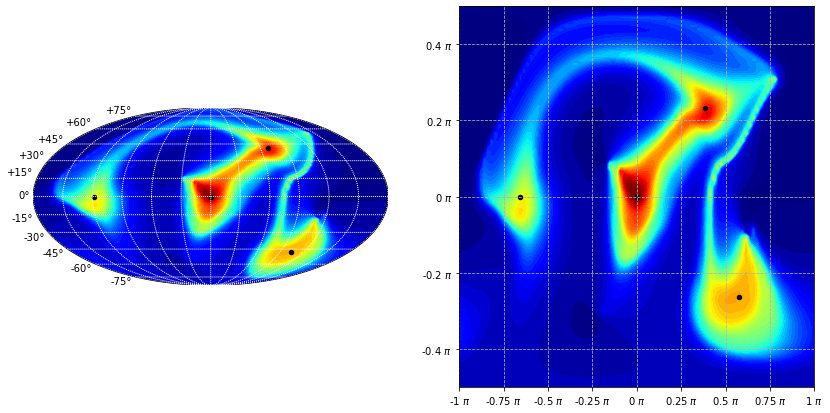

Epoch:1 batch id: 0
Epoch: 1/19, i/N: 0/400 with KL 0.13 and nll loss 1.91

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 1/19, i/N: 0/400 KL_test 0.1645803451538086 and nll_test 1.9456567764282227

From current batch
Epoch: 1, i/N: 0/400 avg ldj from current batch 0.59

From 100000 uniform samples
Epoch: 1/19, i/N: 0/400 MC density sum 1.01
Epoch: 1/19, i/N: 0/400 avg ldj -0.63
#####################

Epoch: 1/19, i/N: 10/400 with KL 0.28 and nll loss 2.06
Epoch: 1/19, i/N: 20/400 with KL 0.21 and nll loss 1.99
Epoch: 1/19, i/N: 30/400 with KL 0.19 and nll loss 1.97
Epoch: 1/19, i/N: 40/400 with KL 0.17 and nll loss 1.95
Epoch: 1/19, i/N: 50/400 with KL 0.17 and nll loss 1.95
Epoch: 1/19, i/N: 60/400 with KL 0.13 and nll loss 1.91
Epoch: 1/19, i/N: 70/400 with KL 0.17 and nll loss 1.95
Epoch: 1/19, i/N: 80/400 with KL 0.15 and nll loss 1.93
Epoch: 1/19, i/N: 90/400 with KL 0.07 and nll loss 1.85
Epoch: 1/19, i/N: 100/400 with KL 0.13 

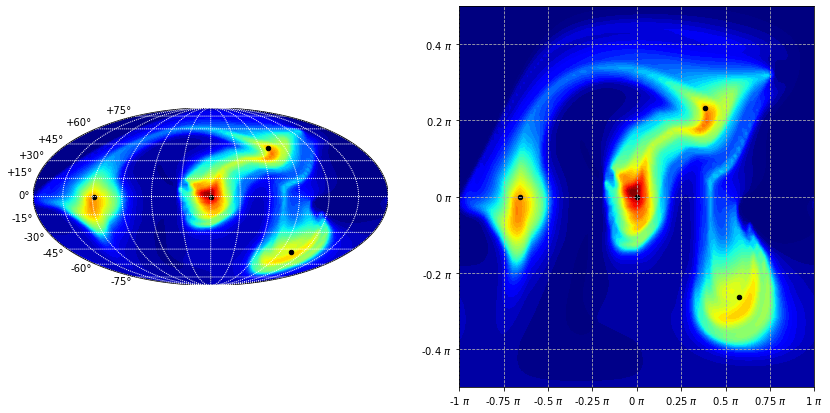

Epoch:2 batch id: 0
Epoch: 2/19, i/N: 0/400 with KL 0.09 and nll loss 1.87

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 2/19, i/N: 0/400 KL_test 0.11478161811828613 and nll_test 1.8958580493927002

From current batch
Epoch: 2, i/N: 0/400 avg ldj from current batch 0.64

From 100000 uniform samples
Epoch: 2/19, i/N: 0/400 MC density sum 1.00
Epoch: 2/19, i/N: 0/400 avg ldj -0.74
#####################

Epoch: 2/19, i/N: 10/400 with KL 0.01 and nll loss 1.79
Epoch: 2/19, i/N: 20/400 with KL 0.22 and nll loss 2.00
Epoch: 2/19, i/N: 30/400 with KL 0.14 and nll loss 1.92
Epoch: 2/19, i/N: 40/400 with KL 0.14 and nll loss 1.92
Epoch: 2/19, i/N: 50/400 with KL 0.16 and nll loss 1.94
Epoch: 2/19, i/N: 60/400 with KL 0.15 and nll loss 1.93
Epoch: 2/19, i/N: 70/400 with KL 0.07 and nll loss 1.85
Epoch: 2/19, i/N: 80/400 with KL 0.10 and nll loss 1.88
Epoch: 2/19, i/N: 90/400 with KL 0.07 and nll loss 1.85
Epoch: 2/19, i/N: 100/400 with KL 0.13

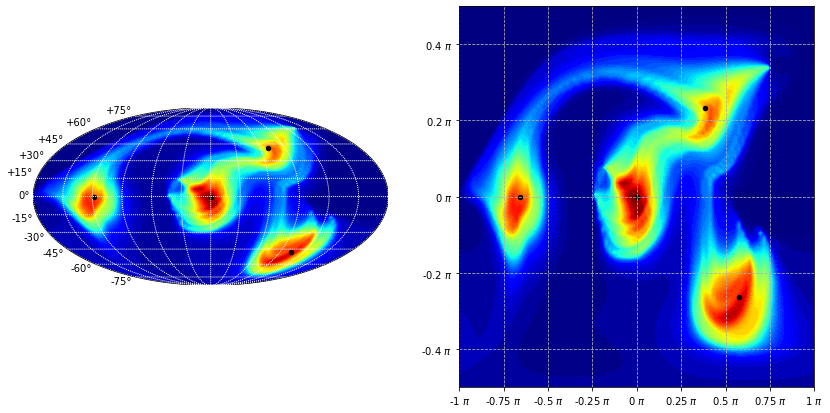

Epoch:3 batch id: 0
Epoch: 3/19, i/N: 0/400 with KL 0.09 and nll loss 1.87

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 3/19, i/N: 0/400 KL_test 0.10104584693908691 and nll_test 1.882122278213501

From current batch
Epoch: 3, i/N: 0/400 avg ldj from current batch 0.65

From 100000 uniform samples
Epoch: 3/19, i/N: 0/400 MC density sum 1.00
Epoch: 3/19, i/N: 0/400 avg ldj -0.83
#####################

Epoch: 3/19, i/N: 10/400 with KL 0.12 and nll loss 1.90
Epoch: 3/19, i/N: 20/400 with KL 0.17 and nll loss 1.95
Epoch: 3/19, i/N: 30/400 with KL 0.11 and nll loss 1.89
Epoch: 3/19, i/N: 40/400 with KL -0.01 and nll loss 1.77
Epoch: 3/19, i/N: 50/400 with KL 0.18 and nll loss 1.96
Epoch: 3/19, i/N: 60/400 with KL 0.11 and nll loss 1.89
Epoch: 3/19, i/N: 70/400 with KL 0.13 and nll loss 1.91
Epoch: 3/19, i/N: 80/400 with KL 0.11 and nll loss 1.89
Epoch: 3/19, i/N: 90/400 with KL 0.18 and nll loss 1.96
Epoch: 3/19, i/N: 100/400 with KL 0.14

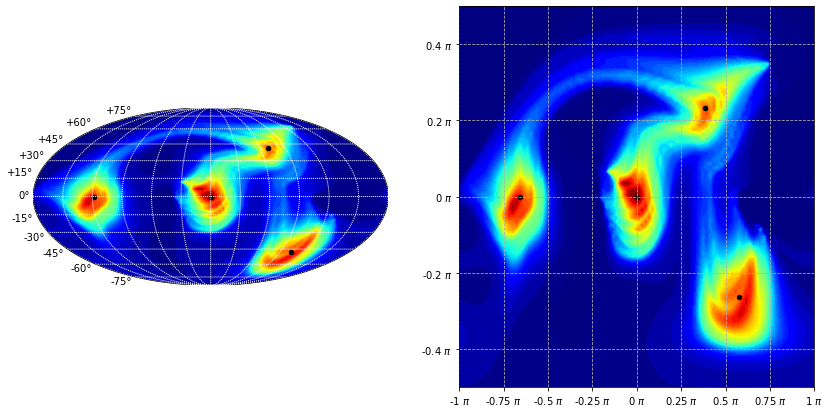

Epoch:4 batch id: 0
Epoch: 4/19, i/N: 0/400 with KL 0.07 and nll loss 1.85

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 4/19, i/N: 0/400 KL_test 0.09370458126068115 and nll_test 1.8747810125350952

From current batch
Epoch: 4, i/N: 0/400 avg ldj from current batch 0.66

From 100000 uniform samples
Epoch: 4/19, i/N: 0/400 MC density sum 1.00
Epoch: 4/19, i/N: 0/400 avg ldj -0.78
#####################

Epoch: 4/19, i/N: 10/400 with KL 0.03 and nll loss 1.81
Epoch: 4/19, i/N: 20/400 with KL 0.18 and nll loss 1.96
Epoch: 4/19, i/N: 30/400 with KL 0.01 and nll loss 1.79
Epoch: 4/19, i/N: 40/400 with KL 0.12 and nll loss 1.90
Epoch: 4/19, i/N: 50/400 with KL 0.17 and nll loss 1.95
Epoch: 4/19, i/N: 60/400 with KL 0.08 and nll loss 1.86
Epoch: 4/19, i/N: 70/400 with KL 0.09 and nll loss 1.87
Epoch: 4/19, i/N: 80/400 with KL -0.00 and nll loss 1.78
Epoch: 4/19, i/N: 90/400 with KL 0.12 and nll loss 1.91
Epoch: 4/19, i/N: 100/400 with KL 0.1

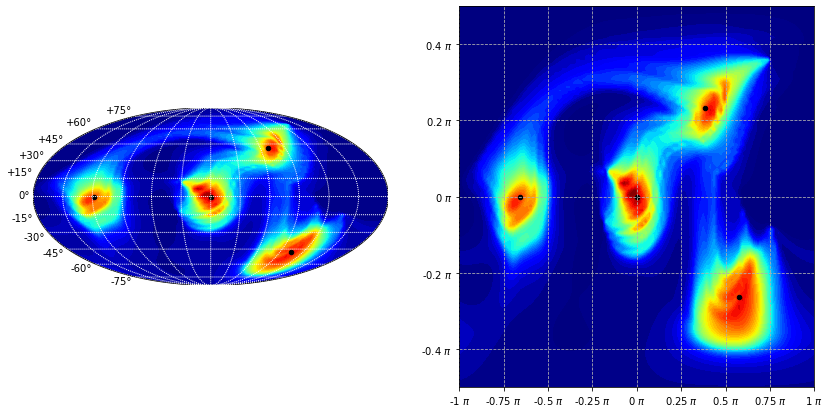

Epoch:5 batch id: 0
Epoch: 5/19, i/N: 0/400 with KL 0.03 and nll loss 1.81

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 5/19, i/N: 0/400 KL_test 0.0728309154510498 and nll_test 1.8539073467254639

From current batch
Epoch: 5, i/N: 0/400 avg ldj from current batch 0.68

From 100000 uniform samples
Epoch: 5/19, i/N: 0/400 MC density sum 1.00
Epoch: 5/19, i/N: 0/400 avg ldj -0.86
#####################

Epoch: 5/19, i/N: 10/400 with KL 0.06 and nll loss 1.84
Epoch: 5/19, i/N: 20/400 with KL -0.06 and nll loss 1.72
Epoch: 5/19, i/N: 30/400 with KL -0.02 and nll loss 1.76
Epoch: 5/19, i/N: 40/400 with KL 0.08 and nll loss 1.86
Epoch: 5/19, i/N: 50/400 with KL 0.07 and nll loss 1.85
Epoch: 5/19, i/N: 60/400 with KL 0.14 and nll loss 1.92
Epoch: 5/19, i/N: 70/400 with KL 0.13 and nll loss 1.91
Epoch: 5/19, i/N: 80/400 with KL 0.06 and nll loss 1.84
Epoch: 5/19, i/N: 90/400 with KL 0.16 and nll loss 1.95
Epoch: 5/19, i/N: 100/400 with KL 0.0

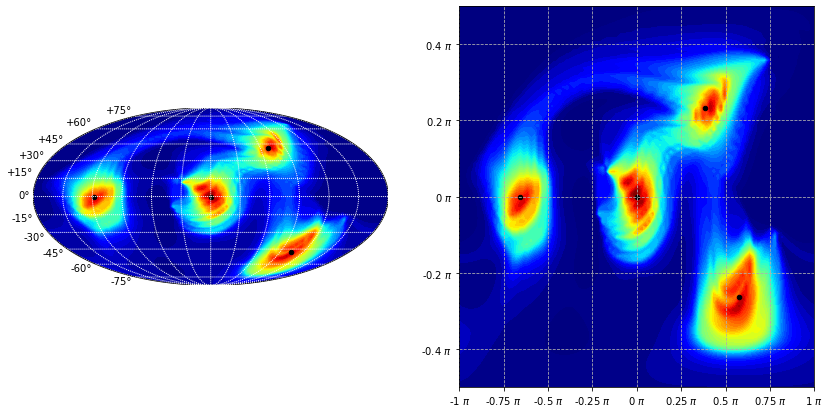

Epoch:6 batch id: 0
Epoch: 6/19, i/N: 0/400 with KL 0.15 and nll loss 1.93

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 6/19, i/N: 0/400 KL_test 0.06855487823486328 and nll_test 1.8496313095092773

From current batch
Epoch: 6, i/N: 0/400 avg ldj from current batch 0.68

From 100000 uniform samples
Epoch: 6/19, i/N: 0/400 MC density sum 1.00
Epoch: 6/19, i/N: 0/400 avg ldj -0.86
#####################

Epoch: 6/19, i/N: 10/400 with KL 0.06 and nll loss 1.84
Epoch: 6/19, i/N: 20/400 with KL -0.05 and nll loss 1.73
Epoch: 6/19, i/N: 30/400 with KL 0.05 and nll loss 1.83
Epoch: 6/19, i/N: 40/400 with KL 0.01 and nll loss 1.79
Epoch: 6/19, i/N: 50/400 with KL 0.04 and nll loss 1.83
Epoch: 6/19, i/N: 60/400 with KL 0.09 and nll loss 1.87
Epoch: 6/19, i/N: 70/400 with KL 0.09 and nll loss 1.87
Epoch: 6/19, i/N: 80/400 with KL 0.02 and nll loss 1.80
Epoch: 6/19, i/N: 90/400 with KL 0.08 and nll loss 1.86
Epoch: 6/19, i/N: 100/400 with KL 0.1

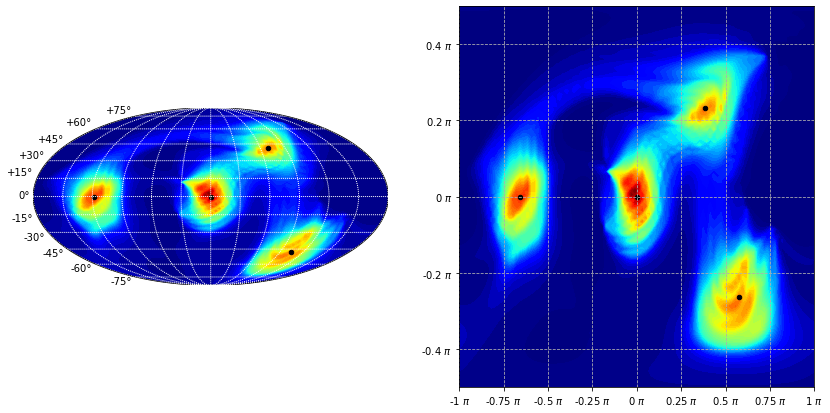

Epoch:7 batch id: 0
Epoch: 7/19, i/N: 0/400 with KL 0.04 and nll loss 1.82

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 7/19, i/N: 0/400 KL_test 0.05666542053222656 and nll_test 1.8377418518066406

From current batch
Epoch: 7, i/N: 0/400 avg ldj from current batch 0.69

From 100000 uniform samples
Epoch: 7/19, i/N: 0/400 MC density sum 0.99
Epoch: 7/19, i/N: 0/400 avg ldj -0.91
#####################

Epoch: 7/19, i/N: 10/400 with KL 0.18 and nll loss 1.96
Epoch: 7/19, i/N: 20/400 with KL 0.08 and nll loss 1.86
Epoch: 7/19, i/N: 30/400 with KL 0.08 and nll loss 1.86
Epoch: 7/19, i/N: 40/400 with KL -0.01 and nll loss 1.77
Epoch: 7/19, i/N: 50/400 with KL 0.11 and nll loss 1.89
Epoch: 7/19, i/N: 60/400 with KL 0.05 and nll loss 1.83
Epoch: 7/19, i/N: 70/400 with KL 0.13 and nll loss 1.91
Epoch: 7/19, i/N: 80/400 with KL 0.10 and nll loss 1.88
Epoch: 7/19, i/N: 90/400 with KL 0.00 and nll loss 1.78
Epoch: 7/19, i/N: 100/400 with KL 0.0

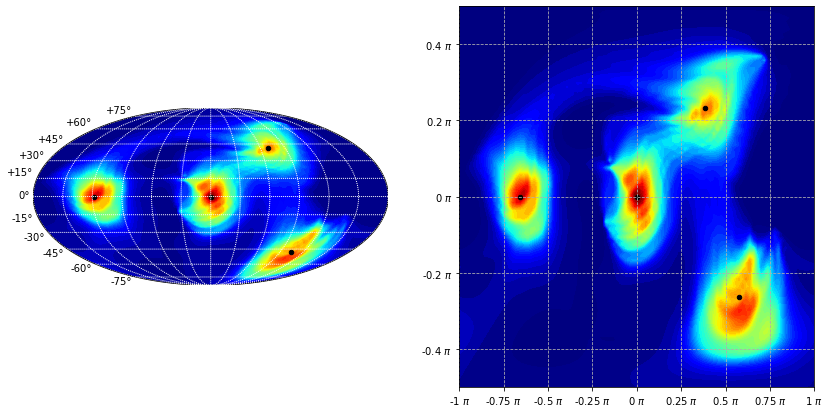

Epoch:8 batch id: 0
Epoch: 8/19, i/N: 0/400 with KL -0.00 and nll loss 1.78

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 8/19, i/N: 0/400 KL_test 0.08138430118560791 and nll_test 1.862460732460022

From current batch
Epoch: 8, i/N: 0/400 avg ldj from current batch 0.67

From 100000 uniform samples
Epoch: 8/19, i/N: 0/400 MC density sum 1.00
Epoch: 8/19, i/N: 0/400 avg ldj -0.90
#####################

Epoch: 8/19, i/N: 10/400 with KL 0.16 and nll loss 1.94
Epoch: 8/19, i/N: 20/400 with KL 0.16 and nll loss 1.94
Epoch: 8/19, i/N: 30/400 with KL 0.02 and nll loss 1.81
Epoch: 8/19, i/N: 40/400 with KL 0.11 and nll loss 1.89
Epoch: 8/19, i/N: 50/400 with KL 0.16 and nll loss 1.94
Epoch: 8/19, i/N: 60/400 with KL 0.13 and nll loss 1.91
Epoch: 8/19, i/N: 70/400 with KL 0.10 and nll loss 1.88
Epoch: 8/19, i/N: 80/400 with KL 0.10 and nll loss 1.88
Epoch: 8/19, i/N: 90/400 with KL 0.14 and nll loss 1.92
Epoch: 8/19, i/N: 100/400 with KL 0.04

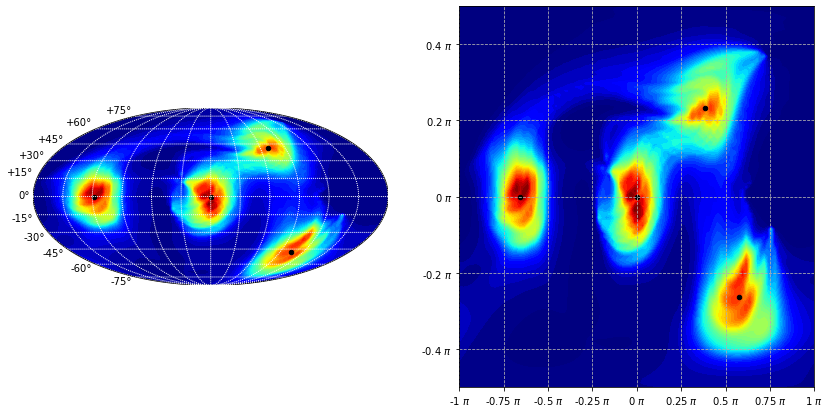

Epoch:9 batch id: 0
Epoch: 9/19, i/N: 0/400 with KL 0.09 and nll loss 1.87

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 9/19, i/N: 0/400 KL_test 0.057550907135009766 and nll_test 1.8386273384094238

From current batch
Epoch: 9, i/N: 0/400 avg ldj from current batch 0.69

From 100000 uniform samples
Epoch: 9/19, i/N: 0/400 MC density sum 1.00
Epoch: 9/19, i/N: 0/400 avg ldj -0.82
#####################

Epoch: 9/19, i/N: 10/400 with KL 0.09 and nll loss 1.87
Epoch: 9/19, i/N: 20/400 with KL -0.01 and nll loss 1.77
Epoch: 9/19, i/N: 30/400 with KL 0.08 and nll loss 1.86
Epoch: 9/19, i/N: 40/400 with KL 0.02 and nll loss 1.80
Epoch: 9/19, i/N: 50/400 with KL 0.10 and nll loss 1.88
Epoch: 9/19, i/N: 60/400 with KL 0.11 and nll loss 1.89
Epoch: 9/19, i/N: 70/400 with KL 0.19 and nll loss 1.98
Epoch: 9/19, i/N: 80/400 with KL 0.13 and nll loss 1.91
Epoch: 9/19, i/N: 90/400 with KL 0.12 and nll loss 1.90
Epoch: 9/19, i/N: 100/400 with KL 0.

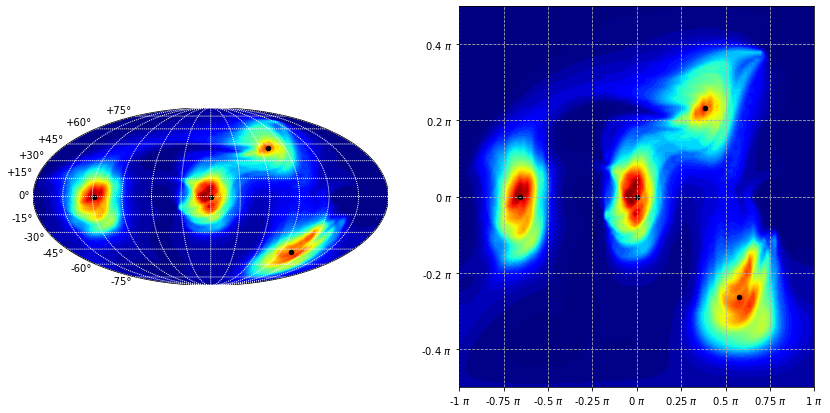

Epoch:10 batch id: 0
Epoch: 10/19, i/N: 0/400 with KL 0.08 and nll loss 1.86

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 10/19, i/N: 0/400 KL_test 0.06044209003448486 and nll_test 1.841518521308899

From current batch
Epoch: 10, i/N: 0/400 avg ldj from current batch 0.69

From 100000 uniform samples
Epoch: 10/19, i/N: 0/400 MC density sum 1.00
Epoch: 10/19, i/N: 0/400 avg ldj -0.78
#####################

Epoch: 10/19, i/N: 10/400 with KL 0.05 and nll loss 1.83
Epoch: 10/19, i/N: 20/400 with KL 0.08 and nll loss 1.86
Epoch: 10/19, i/N: 30/400 with KL 0.07 and nll loss 1.86
Epoch: 10/19, i/N: 40/400 with KL 0.04 and nll loss 1.82
Epoch: 10/19, i/N: 50/400 with KL 0.03 and nll loss 1.81
Epoch: 10/19, i/N: 60/400 with KL 0.04 and nll loss 1.82
Epoch: 10/19, i/N: 70/400 with KL 0.11 and nll loss 1.89
Epoch: 10/19, i/N: 80/400 with KL 0.03 and nll loss 1.81
Epoch: 10/19, i/N: 90/400 with KL 0.02 and nll loss 1.80
Epoch: 10/19, i/N: 100/4

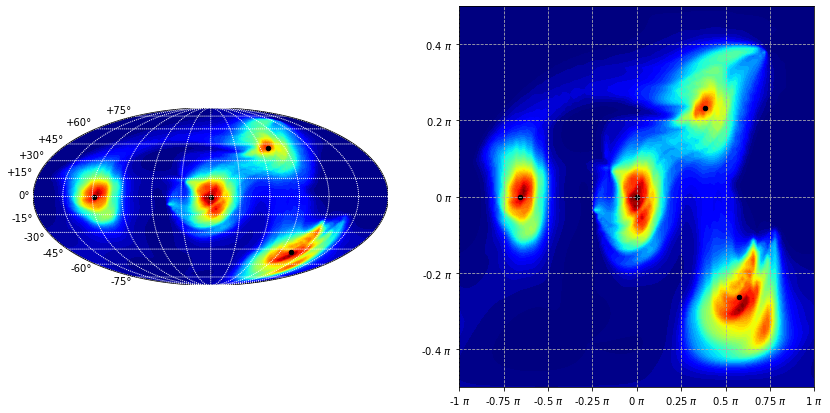

Epoch:11 batch id: 0
Epoch: 11/19, i/N: 0/400 with KL 0.05 and nll loss 1.83

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 11/19, i/N: 0/400 KL_test 0.0643148422241211 and nll_test 1.8453912734985352

From current batch
Epoch: 11, i/N: 0/400 avg ldj from current batch 0.69

From 100000 uniform samples
Epoch: 11/19, i/N: 0/400 MC density sum 1.00
Epoch: 11/19, i/N: 0/400 avg ldj -0.96
#####################

Epoch: 11/19, i/N: 10/400 with KL 0.12 and nll loss 1.90
Epoch: 11/19, i/N: 20/400 with KL 0.13 and nll loss 1.91
Epoch: 11/19, i/N: 30/400 with KL 0.08 and nll loss 1.86
Epoch: 11/19, i/N: 40/400 with KL 0.07 and nll loss 1.85
Epoch: 11/19, i/N: 50/400 with KL -0.00 and nll loss 1.78
Epoch: 11/19, i/N: 60/400 with KL 0.04 and nll loss 1.83
Epoch: 11/19, i/N: 70/400 with KL 0.10 and nll loss 1.88
Epoch: 11/19, i/N: 80/400 with KL 0.16 and nll loss 1.94
Epoch: 11/19, i/N: 90/400 with KL 0.13 and nll loss 1.91
Epoch: 11/19, i/N: 100/

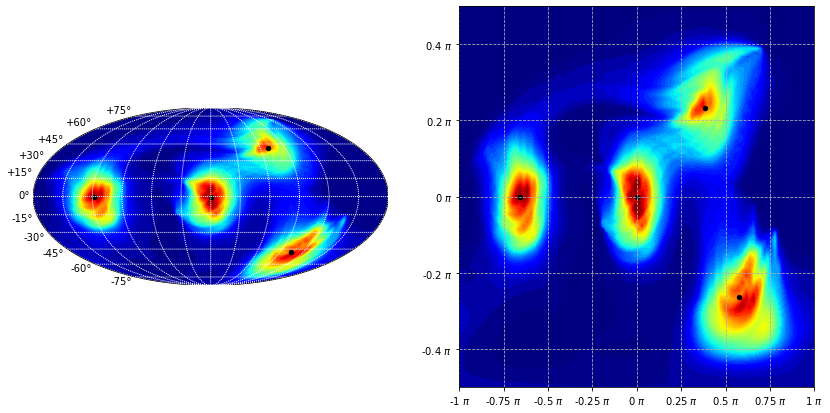

Epoch:12 batch id: 0
Epoch: 12/19, i/N: 0/400 with KL -0.00 and nll loss 1.78

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 12/19, i/N: 0/400 KL_test 0.06049609184265137 and nll_test 1.8415725231170654

From current batch
Epoch: 12, i/N: 0/400 avg ldj from current batch 0.69

From 100000 uniform samples
Epoch: 12/19, i/N: 0/400 MC density sum 1.00
Epoch: 12/19, i/N: 0/400 avg ldj -0.90
#####################

Epoch: 12/19, i/N: 10/400 with KL 0.10 and nll loss 1.88
Epoch: 12/19, i/N: 20/400 with KL 0.03 and nll loss 1.81
Epoch: 12/19, i/N: 30/400 with KL 0.05 and nll loss 1.83
Epoch: 12/19, i/N: 40/400 with KL 0.11 and nll loss 1.89
Epoch: 12/19, i/N: 50/400 with KL 0.03 and nll loss 1.81
Epoch: 12/19, i/N: 60/400 with KL 0.07 and nll loss 1.85
Epoch: 12/19, i/N: 70/400 with KL 0.14 and nll loss 1.93
Epoch: 12/19, i/N: 80/400 with KL 0.01 and nll loss 1.79
Epoch: 12/19, i/N: 90/400 with KL 0.11 and nll loss 1.89
Epoch: 12/19, i/N: 100

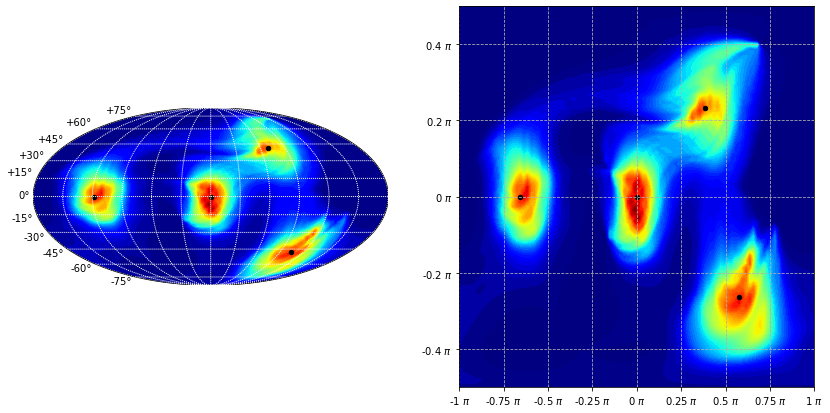

Epoch:13 batch id: 0
Epoch: 13/19, i/N: 0/400 with KL 0.05 and nll loss 1.83

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 13/19, i/N: 0/400 KL_test 0.04933297634124756 and nll_test 1.8304094076156616

From current batch
Epoch: 13, i/N: 0/400 avg ldj from current batch 0.70

From 100000 uniform samples
Epoch: 13/19, i/N: 0/400 MC density sum 1.01
Epoch: 13/19, i/N: 0/400 avg ldj -0.94
#####################

Epoch: 13/19, i/N: 10/400 with KL 0.07 and nll loss 1.85
Epoch: 13/19, i/N: 20/400 with KL 0.06 and nll loss 1.85
Epoch: 13/19, i/N: 30/400 with KL 0.20 and nll loss 1.98
Epoch: 13/19, i/N: 40/400 with KL 0.02 and nll loss 1.80
Epoch: 13/19, i/N: 50/400 with KL 0.00 and nll loss 1.78
Epoch: 13/19, i/N: 60/400 with KL 0.02 and nll loss 1.80
Epoch: 13/19, i/N: 70/400 with KL -0.04 and nll loss 1.75
Epoch: 13/19, i/N: 80/400 with KL 0.02 and nll loss 1.80
Epoch: 13/19, i/N: 90/400 with KL 0.04 and nll loss 1.82
Epoch: 13/19, i/N: 100

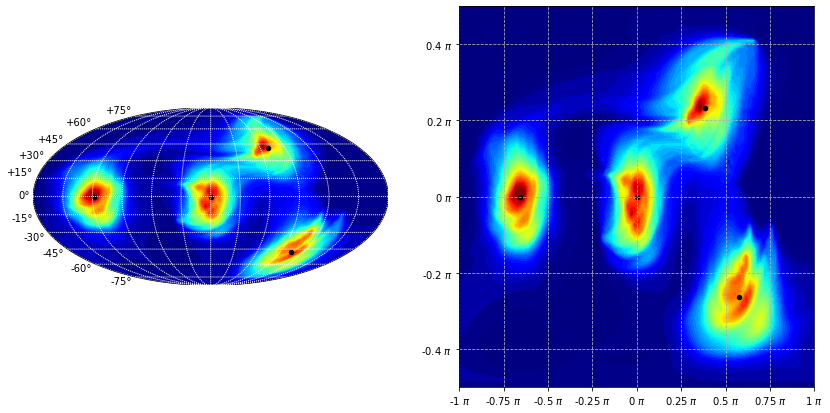

Epoch:14 batch id: 0
Epoch: 14/19, i/N: 0/400 with KL 0.08 and nll loss 1.86

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 14/19, i/N: 0/400 KL_test 0.04128694534301758 and nll_test 1.8223633766174316

From current batch
Epoch: 14, i/N: 0/400 avg ldj from current batch 0.71

From 100000 uniform samples
Epoch: 14/19, i/N: 0/400 MC density sum 1.00
Epoch: 14/19, i/N: 0/400 avg ldj -0.88
#####################

Epoch: 14/19, i/N: 10/400 with KL 0.06 and nll loss 1.85
Epoch: 14/19, i/N: 20/400 with KL 0.10 and nll loss 1.88
Epoch: 14/19, i/N: 30/400 with KL 0.01 and nll loss 1.79
Epoch: 14/19, i/N: 40/400 with KL 0.03 and nll loss 1.81
Epoch: 14/19, i/N: 50/400 with KL -0.04 and nll loss 1.75
Epoch: 14/19, i/N: 60/400 with KL 0.07 and nll loss 1.85
Epoch: 14/19, i/N: 70/400 with KL 0.13 and nll loss 1.91
Epoch: 14/19, i/N: 80/400 with KL 0.06 and nll loss 1.85
Epoch: 14/19, i/N: 90/400 with KL 0.03 and nll loss 1.81
Epoch: 14/19, i/N: 100

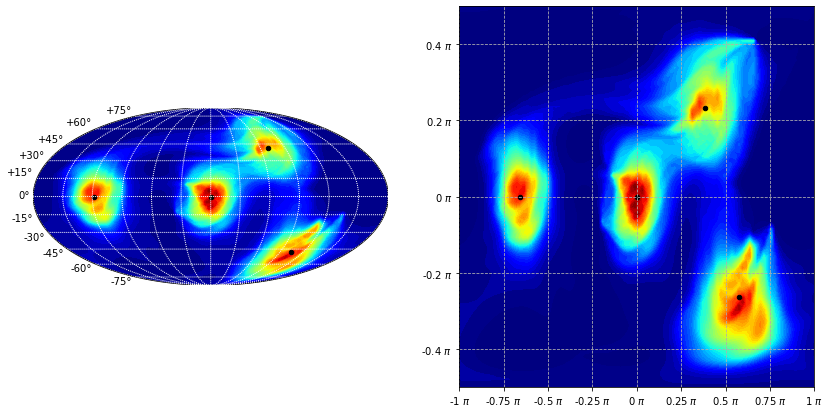

Epoch:15 batch id: 0
Epoch: 15/19, i/N: 0/400 with KL 0.09 and nll loss 1.87

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 15/19, i/N: 0/400 KL_test 0.04663646221160889 and nll_test 1.827712893486023

From current batch
Epoch: 15, i/N: 0/400 avg ldj from current batch 0.70

From 100000 uniform samples
Epoch: 15/19, i/N: 0/400 MC density sum 1.00
Epoch: 15/19, i/N: 0/400 avg ldj -0.99
#####################

Epoch: 15/19, i/N: 10/400 with KL 0.01 and nll loss 1.79
Epoch: 15/19, i/N: 20/400 with KL 0.02 and nll loss 1.80
Epoch: 15/19, i/N: 30/400 with KL -0.06 and nll loss 1.72
Epoch: 15/19, i/N: 40/400 with KL 0.15 and nll loss 1.93
Epoch: 15/19, i/N: 50/400 with KL 0.07 and nll loss 1.85
Epoch: 15/19, i/N: 60/400 with KL 0.00 and nll loss 1.78
Epoch: 15/19, i/N: 70/400 with KL 0.07 and nll loss 1.85
Epoch: 15/19, i/N: 80/400 with KL 0.10 and nll loss 1.88
Epoch: 15/19, i/N: 90/400 with KL 0.07 and nll loss 1.85
Epoch: 15/19, i/N: 100/

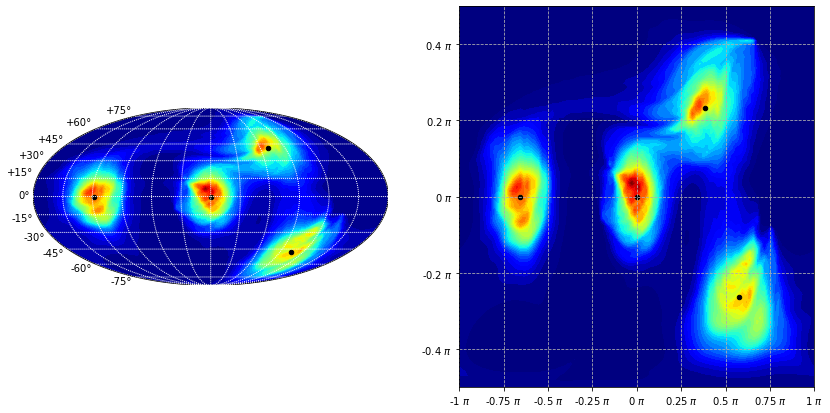

Epoch:16 batch id: 0
Epoch: 16/19, i/N: 0/400 with KL 0.13 and nll loss 1.91

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 16/19, i/N: 0/400 KL_test 0.041553378105163574 and nll_test 1.8226298093795776

From current batch
Epoch: 16, i/N: 0/400 avg ldj from current batch 0.71

From 100000 uniform samples
Epoch: 16/19, i/N: 0/400 MC density sum 1.00
Epoch: 16/19, i/N: 0/400 avg ldj -0.90
#####################

Epoch: 16/19, i/N: 10/400 with KL -0.01 and nll loss 1.77
Epoch: 16/19, i/N: 20/400 with KL -0.02 and nll loss 1.76
Epoch: 16/19, i/N: 30/400 with KL -0.01 and nll loss 1.77
Epoch: 16/19, i/N: 40/400 with KL 0.04 and nll loss 1.82
Epoch: 16/19, i/N: 50/400 with KL -0.04 and nll loss 1.74
Epoch: 16/19, i/N: 60/400 with KL 0.05 and nll loss 1.83
Epoch: 16/19, i/N: 70/400 with KL 0.03 and nll loss 1.81
Epoch: 16/19, i/N: 80/400 with KL 0.06 and nll loss 1.85
Epoch: 16/19, i/N: 90/400 with KL 0.01 and nll loss 1.79
Epoch: 16/19, i/N:

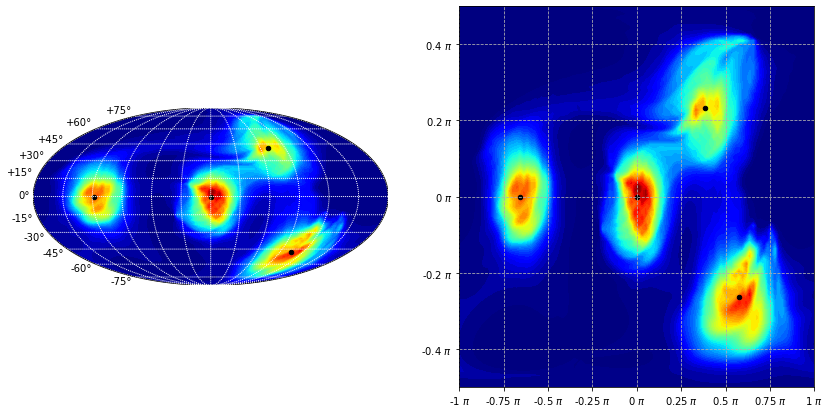

Epoch:17 batch id: 0
Epoch: 17/19, i/N: 0/400 with KL 0.10 and nll loss 1.88

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 17/19, i/N: 0/400 KL_test 0.03944897651672363 and nll_test 1.8205254077911377

From current batch
Epoch: 17, i/N: 0/400 avg ldj from current batch 0.71

From 100000 uniform samples
Epoch: 17/19, i/N: 0/400 MC density sum 1.01
Epoch: 17/19, i/N: 0/400 avg ldj -0.93
#####################

Epoch: 17/19, i/N: 10/400 with KL -0.01 and nll loss 1.77
Epoch: 17/19, i/N: 20/400 with KL -0.03 and nll loss 1.75
Epoch: 17/19, i/N: 30/400 with KL 0.10 and nll loss 1.88
Epoch: 17/19, i/N: 40/400 with KL 0.04 and nll loss 1.83
Epoch: 17/19, i/N: 50/400 with KL -0.01 and nll loss 1.77
Epoch: 17/19, i/N: 60/400 with KL 0.09 and nll loss 1.88
Epoch: 17/19, i/N: 70/400 with KL 0.04 and nll loss 1.82
Epoch: 17/19, i/N: 80/400 with KL 0.03 and nll loss 1.81
Epoch: 17/19, i/N: 90/400 with KL 0.07 and nll loss 1.85
Epoch: 17/19, i/N: 1

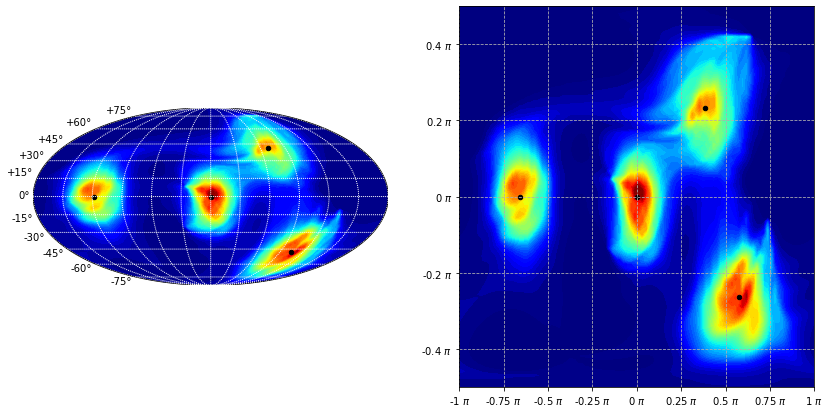

Epoch:18 batch id: 0
Epoch: 18/19, i/N: 0/400 with KL 0.16 and nll loss 1.94

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 18/19, i/N: 0/400 KL_test 0.03722429275512695 and nll_test 1.818300724029541

From current batch
Epoch: 18, i/N: 0/400 avg ldj from current batch 0.71

From 100000 uniform samples
Epoch: 18/19, i/N: 0/400 MC density sum 0.99
Epoch: 18/19, i/N: 0/400 avg ldj -0.99
#####################

Epoch: 18/19, i/N: 10/400 with KL 0.03 and nll loss 1.81
Epoch: 18/19, i/N: 20/400 with KL 0.04 and nll loss 1.82
Epoch: 18/19, i/N: 30/400 with KL 0.02 and nll loss 1.80
Epoch: 18/19, i/N: 40/400 with KL 0.00 and nll loss 1.79
Epoch: 18/19, i/N: 50/400 with KL 0.04 and nll loss 1.82
Epoch: 18/19, i/N: 60/400 with KL 0.08 and nll loss 1.86
Epoch: 18/19, i/N: 70/400 with KL 0.11 and nll loss 1.89
Epoch: 18/19, i/N: 80/400 with KL 0.02 and nll loss 1.80
Epoch: 18/19, i/N: 90/400 with KL -0.04 and nll loss 1.74
Epoch: 18/19, i/N: 100/

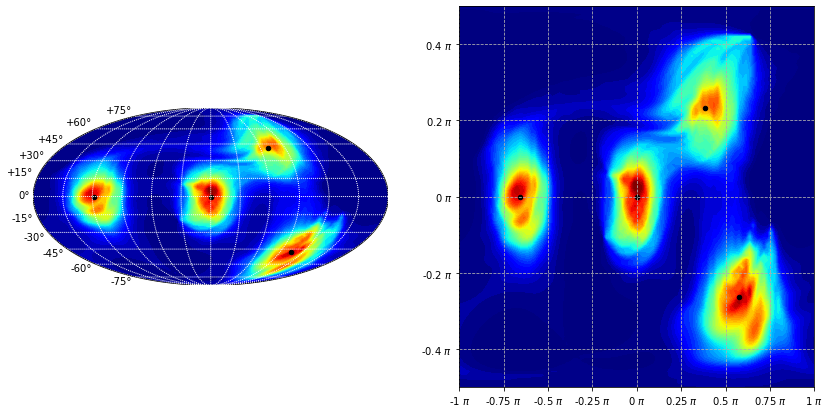

Epoch:19 batch id: 0
Epoch: 19/19, i/N: 0/400 with KL 0.07 and nll loss 1.85

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 19/19, i/N: 0/400 KL_test 0.03587460517883301 and nll_test 1.816951036453247

From current batch
Epoch: 19, i/N: 0/400 avg ldj from current batch 0.71

From 100000 uniform samples
Epoch: 19/19, i/N: 0/400 MC density sum 1.00
Epoch: 19/19, i/N: 0/400 avg ldj -0.95
#####################

Epoch: 19/19, i/N: 10/400 with KL 0.06 and nll loss 1.85
Epoch: 19/19, i/N: 20/400 with KL 0.00 and nll loss 1.78
Epoch: 19/19, i/N: 30/400 with KL 0.10 and nll loss 1.88
Epoch: 19/19, i/N: 40/400 with KL 0.05 and nll loss 1.83
Epoch: 19/19, i/N: 50/400 with KL 0.02 and nll loss 1.80
Epoch: 19/19, i/N: 60/400 with KL 0.20 and nll loss 1.98
Epoch: 19/19, i/N: 70/400 with KL 0.09 and nll loss 1.87
Epoch: 19/19, i/N: 80/400 with KL 0.07 and nll loss 1.85
Epoch: 19/19, i/N: 90/400 with KL 0.08 and nll loss 1.86
Epoch: 19/19, i/N: 100/4

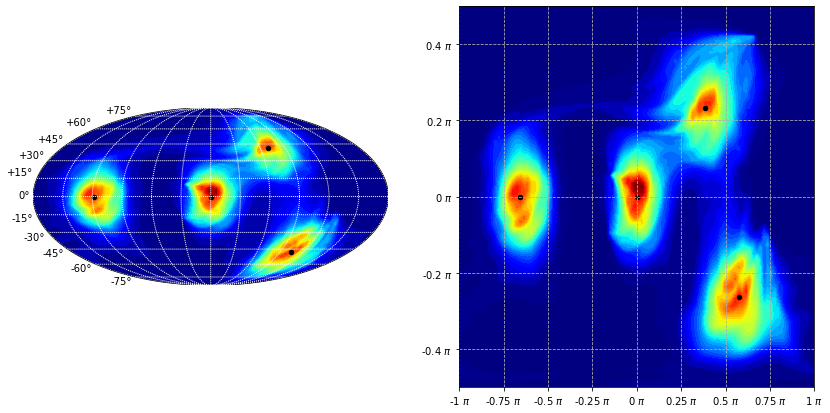

Epoch:19 batch id: 0


In [6]:
cou_moeb = Coupling_Flow(num_flows = NUM_FLOWS_COU, 
                              num_dim_data= NUM_DIM_DATA,
                              flow_type = 'moebius', 
                              rezero_flag = True,
                              num_centers = NUM_CENTERS,
                              cap_householder_refl=CAP_HOUSEHOLDER_REFL)

cou_moeb.to(device)

optimizer = optim.AdamW(cou_moeb.parameters(), lr=lr, weight_decay=weight_decay)

print('##### Coupling Moebius Flow #####')


train_model(model = cou_moeb, 
            optimizer = optimizer,
            dataset = power_spherical_data,
            config = config,
            model_name='cou_m')



### Coupling Spline Flow

##### Coupling Spline Flow #####


wandb: Wandb version 0.10.12 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


##### Model #####
Coupling_Flow(
  (scale): ModuleList(
    (0): Rotation()
    (1): Coupling(
      (cond_rotation): Rotation(
        (householder_params): MLP(
          (nn): Sequential(
            (0): Linear(in_features=1, out_features=128, bias=True)
            (1): ReLU()
            (2): Linear(in_features=128, out_features=4, bias=True)
          )
        )
      )
      (circle_transf): Circular_Spline_Flow(
        (params_predictor): MLP(
          (nn): Sequential(
            (0): Linear(in_features=1, out_features=128, bias=True)
            (1): ReLU()
            (2): Linear(in_features=128, out_features=24, bias=True)
          )
        )
      )
    )
    (2): Rotation()
    (3): Coupling(
      (cond_rotation): Rotation(
        (householder_params): MLP(
          (nn): Sequential(
            (0): Linear(in_features=1, out_features=128, bias=True)
            (1): ReLU()
            (2): Linear(in_features=128, out_features=4, bias=True)
          )
        )

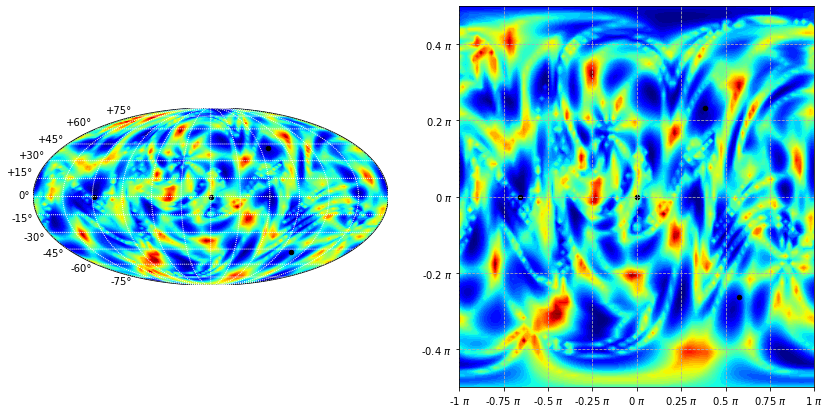

Epoch:0 batch id: 0
Epoch: 0/19, i/N: 0/400 with KL 0.75 and nll loss 2.53

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 0/19, i/N: 0/400 KL_test 0.7499678134918213 and nll_test 2.5310442447662354

From current batch
Epoch: 0, i/N: 0/400 avg ldj from current batch -0.00

From 100000 uniform samples
Epoch: 0/19, i/N: 0/400 MC density sum 1.00
Epoch: 0/19, i/N: 0/400 avg ldj 0.00
#####################

Epoch: 0/19, i/N: 10/400 with KL 0.74 and nll loss 2.52
Epoch: 0/19, i/N: 20/400 with KL 0.72 and nll loss 2.50
Epoch: 0/19, i/N: 30/400 with KL 0.67 and nll loss 2.45
Epoch: 0/19, i/N: 40/400 with KL 0.57 and nll loss 2.35
Epoch: 0/19, i/N: 50/400 with KL 0.56 and nll loss 2.34
Epoch: 0/19, i/N: 60/400 with KL 0.35 and nll loss 2.13
Epoch: 0/19, i/N: 70/400 with KL 0.33 and nll loss 2.11
Epoch: 0/19, i/N: 80/400 with KL 0.16 and nll loss 1.94
Epoch: 0/19, i/N: 90/400 with KL 0.30 and nll loss 2.08
Epoch: 0/19, i/N: 100/400 with KL 0.22 

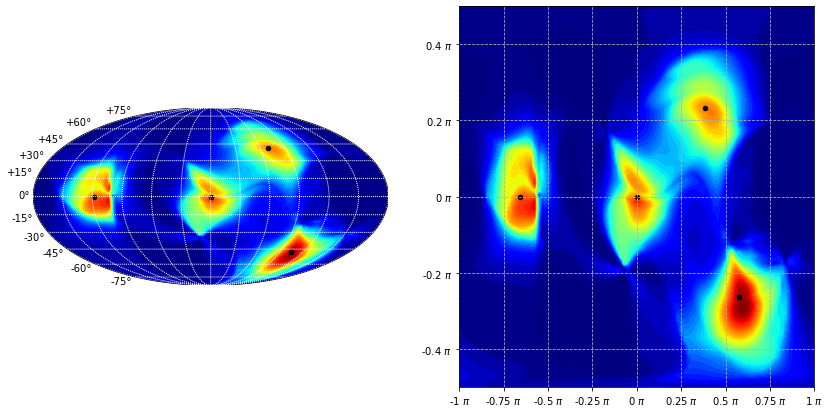

Epoch:1 batch id: 0
Epoch: 1/19, i/N: 0/400 with KL 0.11 and nll loss 1.89

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 1/19, i/N: 0/400 KL_test 0.08627438545227051 and nll_test 1.8673508167266846

From current batch
Epoch: 1, i/N: 0/400 avg ldj from current batch 0.66

From 100000 uniform samples
Epoch: 1/19, i/N: 0/400 MC density sum 1.00
Epoch: 1/19, i/N: 0/400 avg ldj -0.93
#####################

Epoch: 1/19, i/N: 10/400 with KL 0.04 and nll loss 1.82
Epoch: 1/19, i/N: 20/400 with KL 0.17 and nll loss 1.95
Epoch: 1/19, i/N: 30/400 with KL 0.02 and nll loss 1.80
Epoch: 1/19, i/N: 40/400 with KL 0.06 and nll loss 1.84
Epoch: 1/19, i/N: 50/400 with KL 0.11 and nll loss 1.89
Epoch: 1/19, i/N: 60/400 with KL 0.05 and nll loss 1.83
Epoch: 1/19, i/N: 70/400 with KL 0.09 and nll loss 1.87
Epoch: 1/19, i/N: 80/400 with KL 0.04 and nll loss 1.82
Epoch: 1/19, i/N: 90/400 with KL -0.01 and nll loss 1.77
Epoch: 1/19, i/N: 100/400 with KL 0.0

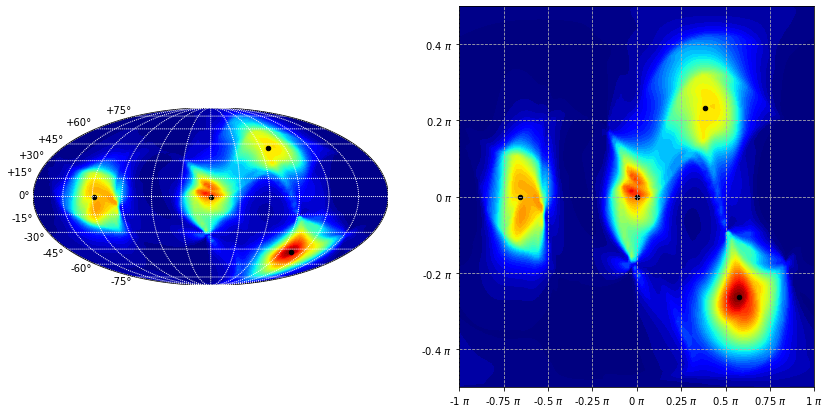

Epoch:2 batch id: 0
Epoch: 2/19, i/N: 0/400 with KL 0.03 and nll loss 1.81

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 2/19, i/N: 0/400 KL_test 0.03950858116149902 and nll_test 1.820585012435913

From current batch
Epoch: 2, i/N: 0/400 avg ldj from current batch 0.71

From 100000 uniform samples
Epoch: 2/19, i/N: 0/400 MC density sum 1.00
Epoch: 2/19, i/N: 0/400 avg ldj -1.01
#####################

Epoch: 2/19, i/N: 10/400 with KL 0.13 and nll loss 1.91
Epoch: 2/19, i/N: 20/400 with KL 0.03 and nll loss 1.81
Epoch: 2/19, i/N: 30/400 with KL 0.01 and nll loss 1.79
Epoch: 2/19, i/N: 40/400 with KL 0.01 and nll loss 1.79
Epoch: 2/19, i/N: 50/400 with KL -0.08 and nll loss 1.70
Epoch: 2/19, i/N: 60/400 with KL -0.09 and nll loss 1.70
Epoch: 2/19, i/N: 70/400 with KL 0.07 and nll loss 1.85
Epoch: 2/19, i/N: 80/400 with KL -0.03 and nll loss 1.75
Epoch: 2/19, i/N: 90/400 with KL -0.03 and nll loss 1.75
Epoch: 2/19, i/N: 100/400 with KL 0

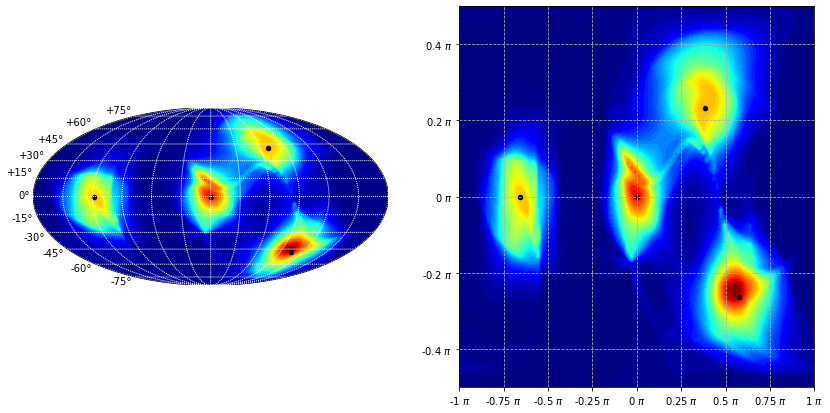

Epoch:3 batch id: 0
Epoch: 3/19, i/N: 0/400 with KL 0.06 and nll loss 1.84

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 3/19, i/N: 0/400 KL_test 0.051720619201660156 and nll_test 1.8327970504760742

From current batch
Epoch: 3, i/N: 0/400 avg ldj from current batch 0.70

From 100000 uniform samples
Epoch: 3/19, i/N: 0/400 MC density sum 1.00
Epoch: 3/19, i/N: 0/400 avg ldj -1.06
#####################

Epoch: 3/19, i/N: 10/400 with KL 0.04 and nll loss 1.82
Epoch: 3/19, i/N: 20/400 with KL -0.07 and nll loss 1.71
Epoch: 3/19, i/N: 30/400 with KL -0.05 and nll loss 1.73
Epoch: 3/19, i/N: 40/400 with KL 0.01 and nll loss 1.79
Epoch: 3/19, i/N: 50/400 with KL 0.00 and nll loss 1.78
Epoch: 3/19, i/N: 60/400 with KL 0.07 and nll loss 1.85
Epoch: 3/19, i/N: 70/400 with KL 0.13 and nll loss 1.91
Epoch: 3/19, i/N: 80/400 with KL 0.10 and nll loss 1.88
Epoch: 3/19, i/N: 90/400 with KL -0.08 and nll loss 1.71
Epoch: 3/19, i/N: 100/400 with KL 

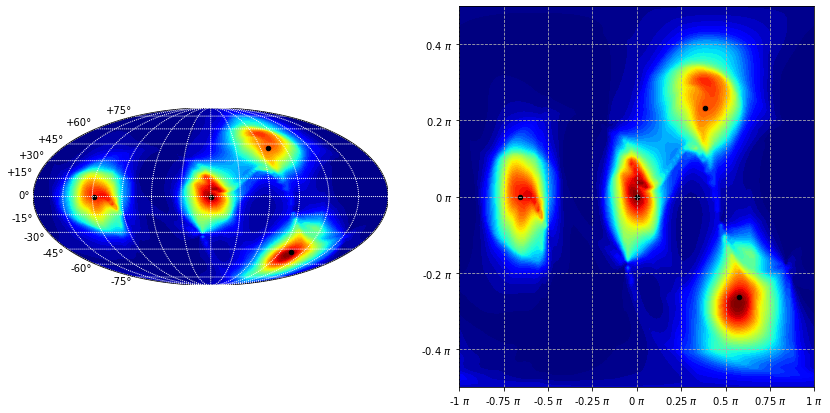

Epoch:4 batch id: 0
Epoch: 4/19, i/N: 0/400 with KL 0.05 and nll loss 1.83

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 4/19, i/N: 0/400 KL_test 0.023723363876342773 and nll_test 1.8047997951507568

From current batch
Epoch: 4, i/N: 0/400 avg ldj from current batch 0.73

From 100000 uniform samples
Epoch: 4/19, i/N: 0/400 MC density sum 1.00
Epoch: 4/19, i/N: 0/400 avg ldj -1.08
#####################

Epoch: 4/19, i/N: 10/400 with KL 0.00 and nll loss 1.78
Epoch: 4/19, i/N: 20/400 with KL -0.02 and nll loss 1.76
Epoch: 4/19, i/N: 30/400 with KL -0.04 and nll loss 1.74
Epoch: 4/19, i/N: 40/400 with KL 0.06 and nll loss 1.84
Epoch: 4/19, i/N: 50/400 with KL 0.03 and nll loss 1.82
Epoch: 4/19, i/N: 60/400 with KL -0.06 and nll loss 1.72
Epoch: 4/19, i/N: 70/400 with KL 0.04 and nll loss 1.82
Epoch: 4/19, i/N: 80/400 with KL -0.02 and nll loss 1.76
Epoch: 4/19, i/N: 90/400 with KL -0.05 and nll loss 1.73
Epoch: 4/19, i/N: 100/400 with K

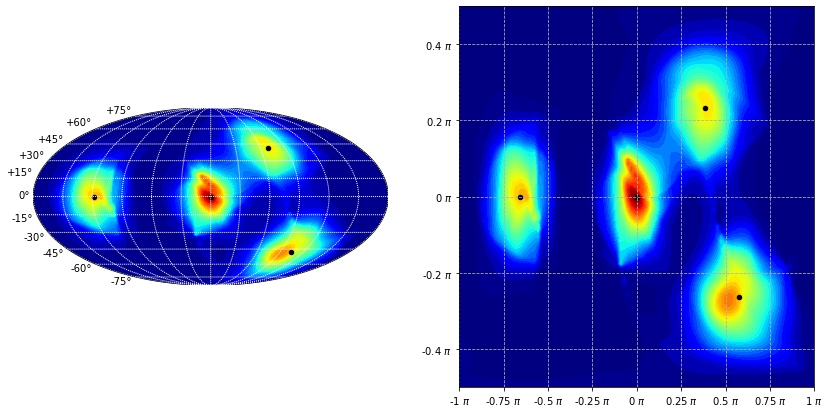

Epoch:5 batch id: 0
Epoch: 5/19, i/N: 0/400 with KL -0.03 and nll loss 1.76

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 5/19, i/N: 0/400 KL_test 0.0216141939163208 and nll_test 1.8026906251907349

From current batch
Epoch: 5, i/N: 0/400 avg ldj from current batch 0.73

From 100000 uniform samples
Epoch: 5/19, i/N: 0/400 MC density sum 1.00
Epoch: 5/19, i/N: 0/400 avg ldj -1.10
#####################

Epoch: 5/19, i/N: 10/400 with KL -0.05 and nll loss 1.73
Epoch: 5/19, i/N: 20/400 with KL -0.06 and nll loss 1.72
Epoch: 5/19, i/N: 30/400 with KL 0.08 and nll loss 1.86
Epoch: 5/19, i/N: 40/400 with KL -0.05 and nll loss 1.73
Epoch: 5/19, i/N: 50/400 with KL 0.12 and nll loss 1.90
Epoch: 5/19, i/N: 60/400 with KL 0.00 and nll loss 1.78
Epoch: 5/19, i/N: 70/400 with KL 0.02 and nll loss 1.80
Epoch: 5/19, i/N: 80/400 with KL 0.05 and nll loss 1.83
Epoch: 5/19, i/N: 90/400 with KL -0.03 and nll loss 1.75
Epoch: 5/19, i/N: 100/400 with KL 

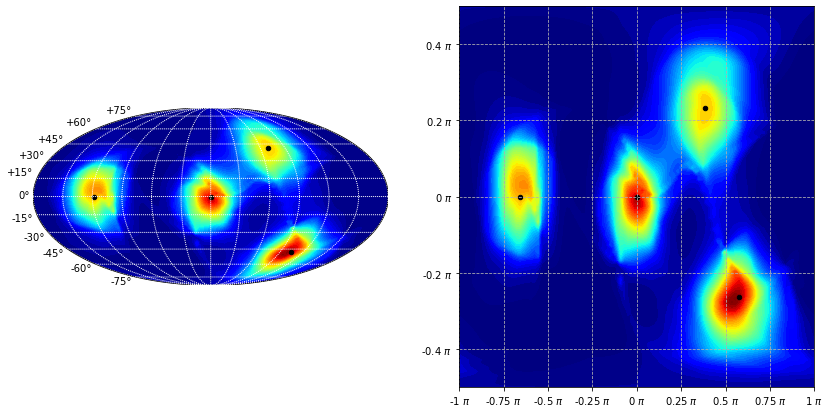

Epoch:6 batch id: 0
Epoch: 6/19, i/N: 0/400 with KL 0.03 and nll loss 1.81

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 6/19, i/N: 0/400 KL_test 0.02559185028076172 and nll_test 1.8066682815551758

From current batch
Epoch: 6, i/N: 0/400 avg ldj from current batch 0.72

From 100000 uniform samples
Epoch: 6/19, i/N: 0/400 MC density sum 1.01
Epoch: 6/19, i/N: 0/400 avg ldj -1.13
#####################

Epoch: 6/19, i/N: 10/400 with KL -0.06 and nll loss 1.72
Epoch: 6/19, i/N: 20/400 with KL -0.00 and nll loss 1.78
Epoch: 6/19, i/N: 30/400 with KL -0.01 and nll loss 1.77
Epoch: 6/19, i/N: 40/400 with KL 0.12 and nll loss 1.91
Epoch: 6/19, i/N: 50/400 with KL 0.01 and nll loss 1.79
Epoch: 6/19, i/N: 60/400 with KL 0.05 and nll loss 1.83
Epoch: 6/19, i/N: 70/400 with KL 0.02 and nll loss 1.80
Epoch: 6/19, i/N: 80/400 with KL 0.03 and nll loss 1.81
Epoch: 6/19, i/N: 90/400 with KL -0.03 and nll loss 1.75
Epoch: 6/19, i/N: 100/400 with KL 

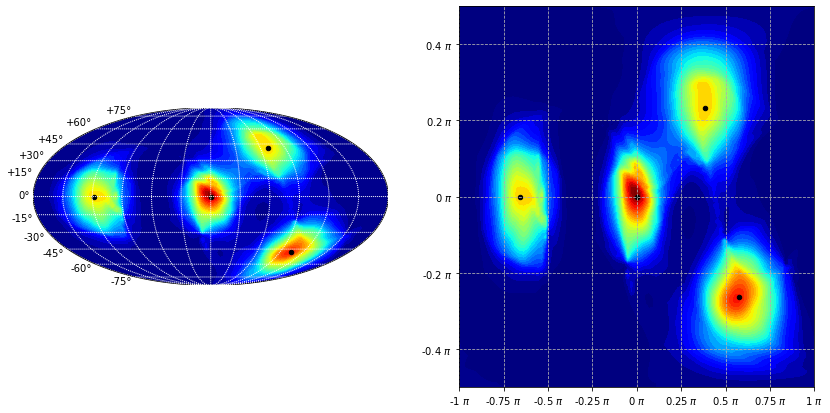

Epoch:7 batch id: 0
Epoch: 7/19, i/N: 0/400 with KL 0.04 and nll loss 1.82

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 7/19, i/N: 0/400 KL_test 0.018326520919799805 and nll_test 1.7994029521942139

From current batch
Epoch: 7, i/N: 0/400 avg ldj from current batch 0.73

From 100000 uniform samples
Epoch: 7/19, i/N: 0/400 MC density sum 1.01
Epoch: 7/19, i/N: 0/400 avg ldj -1.18
#####################

Epoch: 7/19, i/N: 10/400 with KL -0.03 and nll loss 1.75
Epoch: 7/19, i/N: 20/400 with KL 0.08 and nll loss 1.86
Epoch: 7/19, i/N: 30/400 with KL -0.03 and nll loss 1.75
Epoch: 7/19, i/N: 40/400 with KL 0.05 and nll loss 1.83
Epoch: 7/19, i/N: 50/400 with KL -0.02 and nll loss 1.76
Epoch: 7/19, i/N: 60/400 with KL 0.15 and nll loss 1.93
Epoch: 7/19, i/N: 70/400 with KL 0.11 and nll loss 1.89
Epoch: 7/19, i/N: 80/400 with KL 0.10 and nll loss 1.88
Epoch: 7/19, i/N: 90/400 with KL -0.08 and nll loss 1.70
Epoch: 7/19, i/N: 100/400 with KL

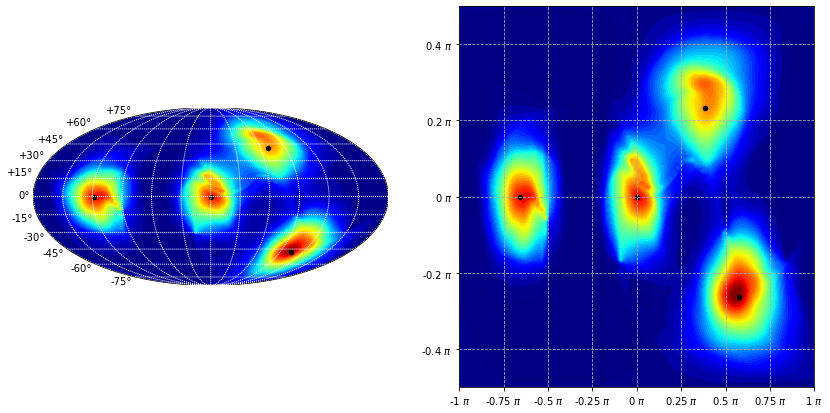

Epoch:8 batch id: 0
Epoch: 8/19, i/N: 0/400 with KL -0.06 and nll loss 1.72

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 8/19, i/N: 0/400 KL_test 0.02409958839416504 and nll_test 1.805176019668579

From current batch
Epoch: 8, i/N: 0/400 avg ldj from current batch 0.73

From 100000 uniform samples
Epoch: 8/19, i/N: 0/400 MC density sum 1.01
Epoch: 8/19, i/N: 0/400 avg ldj -1.09
#####################

Epoch: 8/19, i/N: 10/400 with KL -0.02 and nll loss 1.76
Epoch: 8/19, i/N: 20/400 with KL 0.07 and nll loss 1.85
Epoch: 8/19, i/N: 30/400 with KL 0.12 and nll loss 1.90
Epoch: 8/19, i/N: 40/400 with KL -0.00 and nll loss 1.78
Epoch: 8/19, i/N: 50/400 with KL 0.07 and nll loss 1.85
Epoch: 8/19, i/N: 60/400 with KL 0.02 and nll loss 1.81
Epoch: 8/19, i/N: 70/400 with KL -0.00 and nll loss 1.78
Epoch: 8/19, i/N: 80/400 with KL -0.01 and nll loss 1.77
Epoch: 8/19, i/N: 90/400 with KL 0.03 and nll loss 1.81
Epoch: 8/19, i/N: 100/400 with KL 

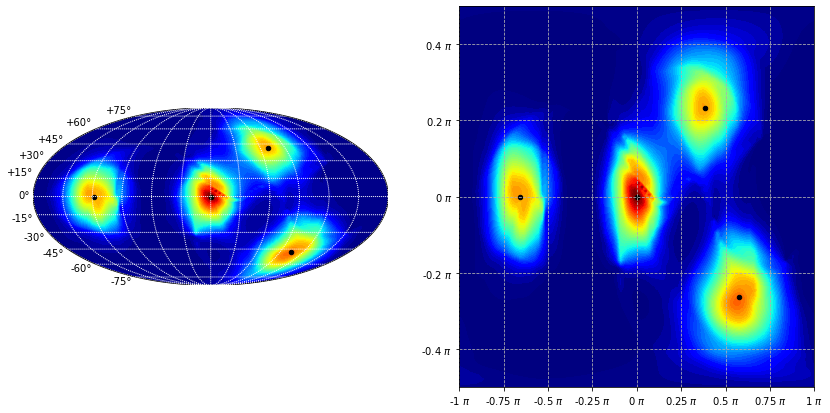

Epoch:9 batch id: 0
Epoch: 9/19, i/N: 0/400 with KL 0.07 and nll loss 1.85

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 9/19, i/N: 0/400 KL_test 0.013690829277038574 and nll_test 1.7947672605514526

From current batch
Epoch: 9, i/N: 0/400 avg ldj from current batch 0.74

From 100000 uniform samples
Epoch: 9/19, i/N: 0/400 MC density sum 1.00
Epoch: 9/19, i/N: 0/400 avg ldj -1.24
#####################

Epoch: 9/19, i/N: 10/400 with KL 0.03 and nll loss 1.81
Epoch: 9/19, i/N: 20/400 with KL -0.11 and nll loss 1.67
Epoch: 9/19, i/N: 30/400 with KL 0.04 and nll loss 1.82
Epoch: 9/19, i/N: 40/400 with KL -0.01 and nll loss 1.77
Epoch: 9/19, i/N: 50/400 with KL 0.08 and nll loss 1.87
Epoch: 9/19, i/N: 60/400 with KL -0.04 and nll loss 1.74
Epoch: 9/19, i/N: 70/400 with KL 0.13 and nll loss 1.91
Epoch: 9/19, i/N: 80/400 with KL 0.02 and nll loss 1.80
Epoch: 9/19, i/N: 90/400 with KL -0.07 and nll loss 1.71
Epoch: 9/19, i/N: 100/400 with KL

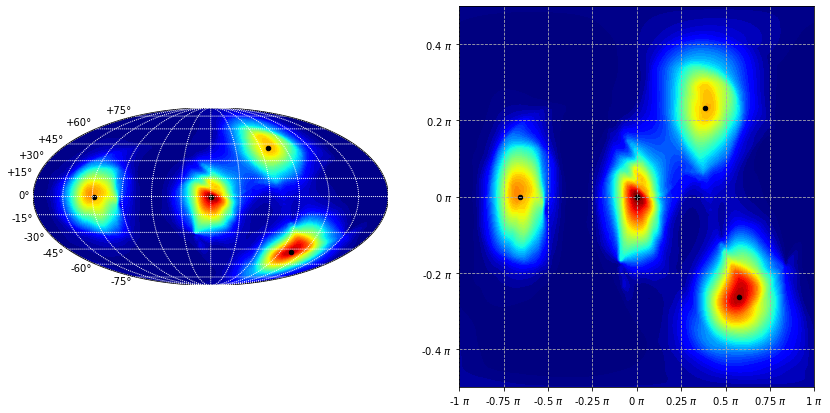

Epoch:10 batch id: 0
Epoch: 10/19, i/N: 0/400 with KL 0.10 and nll loss 1.88

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 10/19, i/N: 0/400 KL_test 0.016194581985473633 and nll_test 1.7972710132598877

From current batch
Epoch: 10, i/N: 0/400 avg ldj from current batch 0.73

From 100000 uniform samples
Epoch: 10/19, i/N: 0/400 MC density sum 1.00
Epoch: 10/19, i/N: 0/400 avg ldj -1.19
#####################

Epoch: 10/19, i/N: 10/400 with KL 0.07 and nll loss 1.85
Epoch: 10/19, i/N: 20/400 with KL 0.07 and nll loss 1.85
Epoch: 10/19, i/N: 30/400 with KL 0.05 and nll loss 1.83
Epoch: 10/19, i/N: 40/400 with KL 0.01 and nll loss 1.79
Epoch: 10/19, i/N: 50/400 with KL -0.03 and nll loss 1.76
Epoch: 10/19, i/N: 60/400 with KL 0.06 and nll loss 1.84
Epoch: 10/19, i/N: 70/400 with KL 0.06 and nll loss 1.84
Epoch: 10/19, i/N: 80/400 with KL 0.04 and nll loss 1.82
Epoch: 10/19, i/N: 90/400 with KL -0.05 and nll loss 1.73
Epoch: 10/19, i/N: 1

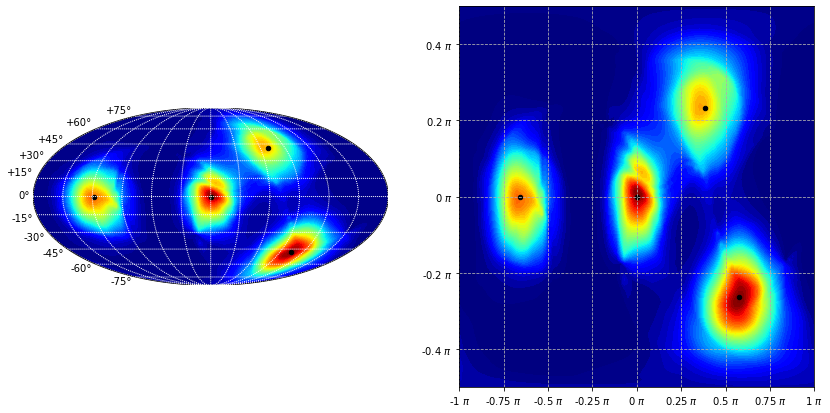

Epoch:11 batch id: 0
Epoch: 11/19, i/N: 0/400 with KL -0.01 and nll loss 1.77

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 11/19, i/N: 0/400 KL_test 0.014809370040893555 and nll_test 1.7958858013153076

From current batch
Epoch: 11, i/N: 0/400 avg ldj from current batch 0.74

From 100000 uniform samples
Epoch: 11/19, i/N: 0/400 MC density sum 1.00
Epoch: 11/19, i/N: 0/400 avg ldj -1.22
#####################

Epoch: 11/19, i/N: 10/400 with KL -0.03 and nll loss 1.75
Epoch: 11/19, i/N: 20/400 with KL 0.07 and nll loss 1.85
Epoch: 11/19, i/N: 30/400 with KL 0.05 and nll loss 1.83
Epoch: 11/19, i/N: 40/400 with KL 0.00 and nll loss 1.78
Epoch: 11/19, i/N: 50/400 with KL -0.02 and nll loss 1.76
Epoch: 11/19, i/N: 60/400 with KL 0.04 and nll loss 1.82
Epoch: 11/19, i/N: 70/400 with KL 0.01 and nll loss 1.79
Epoch: 11/19, i/N: 80/400 with KL 0.04 and nll loss 1.82
Epoch: 11/19, i/N: 90/400 with KL -0.02 and nll loss 1.76
Epoch: 11/19, i/N:

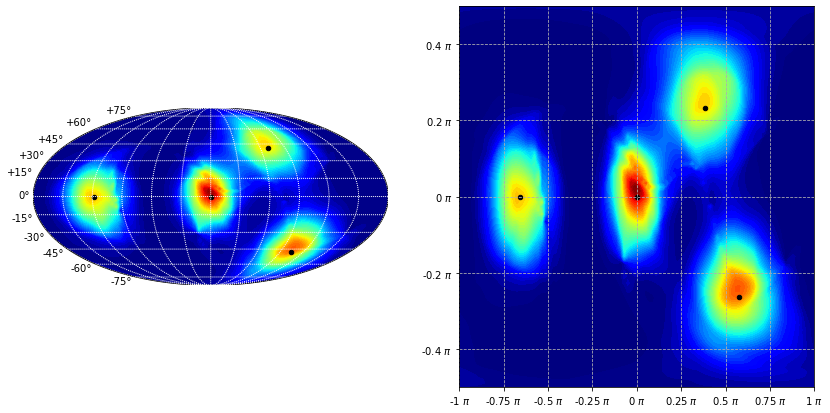

Epoch:12 batch id: 0
Epoch: 12/19, i/N: 0/400 with KL -0.00 and nll loss 1.78

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 12/19, i/N: 0/400 KL_test 0.019437670707702637 and nll_test 1.8005141019821167

From current batch
Epoch: 12, i/N: 0/400 avg ldj from current batch 0.73

From 100000 uniform samples
Epoch: 12/19, i/N: 0/400 MC density sum 1.00
Epoch: 12/19, i/N: 0/400 avg ldj -1.13
#####################

Epoch: 12/19, i/N: 10/400 with KL 0.06 and nll loss 1.84
Epoch: 12/19, i/N: 20/400 with KL 0.00 and nll loss 1.79
Epoch: 12/19, i/N: 30/400 with KL 0.03 and nll loss 1.81
Epoch: 12/19, i/N: 40/400 with KL 0.03 and nll loss 1.81
Epoch: 12/19, i/N: 50/400 with KL 0.05 and nll loss 1.83
Epoch: 12/19, i/N: 60/400 with KL 0.03 and nll loss 1.81
Epoch: 12/19, i/N: 70/400 with KL 0.02 and nll loss 1.80
Epoch: 12/19, i/N: 80/400 with KL 0.05 and nll loss 1.83
Epoch: 12/19, i/N: 90/400 with KL 0.04 and nll loss 1.82
Epoch: 12/19, i/N: 10

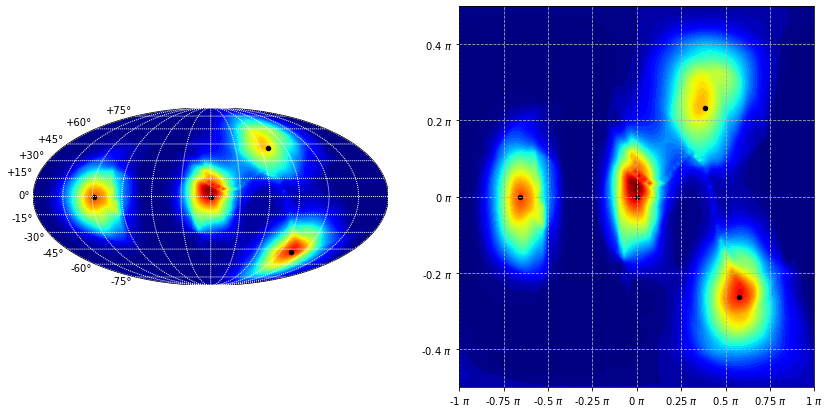

Epoch:13 batch id: 0
Epoch: 13/19, i/N: 0/400 with KL 0.02 and nll loss 1.80

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 13/19, i/N: 0/400 KL_test 0.015927791595458984 and nll_test 1.797004222869873

From current batch
Epoch: 13, i/N: 0/400 avg ldj from current batch 0.73

From 100000 uniform samples
Epoch: 13/19, i/N: 0/400 MC density sum 1.00
Epoch: 13/19, i/N: 0/400 avg ldj -1.14
#####################

Epoch: 13/19, i/N: 10/400 with KL 0.05 and nll loss 1.83
Epoch: 13/19, i/N: 20/400 with KL -0.02 and nll loss 1.76
Epoch: 13/19, i/N: 30/400 with KL 0.05 and nll loss 1.83
Epoch: 13/19, i/N: 40/400 with KL 0.12 and nll loss 1.90
Epoch: 13/19, i/N: 50/400 with KL 0.12 and nll loss 1.90
Epoch: 13/19, i/N: 60/400 with KL 0.05 and nll loss 1.83
Epoch: 13/19, i/N: 70/400 with KL 0.01 and nll loss 1.79
Epoch: 13/19, i/N: 80/400 with KL -0.02 and nll loss 1.76
Epoch: 13/19, i/N: 90/400 with KL 0.10 and nll loss 1.89
Epoch: 13/19, i/N: 10

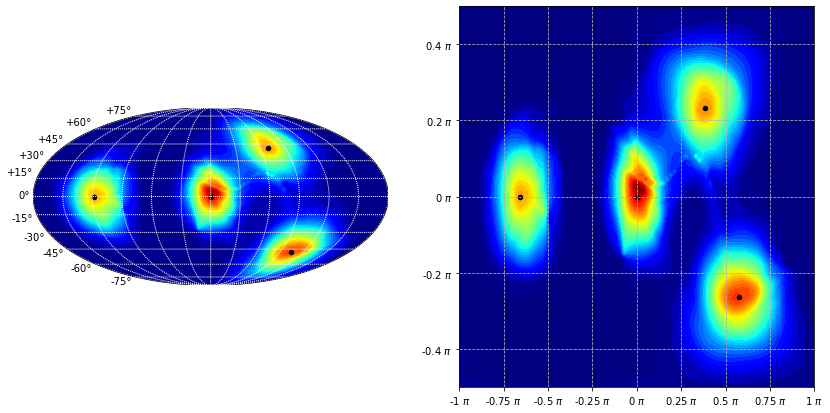

Epoch:14 batch id: 0
Epoch: 14/19, i/N: 0/400 with KL 0.04 and nll loss 1.82

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 14/19, i/N: 0/400 KL_test 0.01735377311706543 and nll_test 1.7984302043914795

From current batch
Epoch: 14, i/N: 0/400 avg ldj from current batch 0.73

From 100000 uniform samples
Epoch: 14/19, i/N: 0/400 MC density sum 1.00
Epoch: 14/19, i/N: 0/400 avg ldj -1.18
#####################

Epoch: 14/19, i/N: 10/400 with KL 0.02 and nll loss 1.80
Epoch: 14/19, i/N: 20/400 with KL -0.01 and nll loss 1.77
Epoch: 14/19, i/N: 30/400 with KL 0.08 and nll loss 1.86
Epoch: 14/19, i/N: 40/400 with KL -0.03 and nll loss 1.76
Epoch: 14/19, i/N: 50/400 with KL 0.01 and nll loss 1.79
Epoch: 14/19, i/N: 60/400 with KL -0.01 and nll loss 1.77
Epoch: 14/19, i/N: 70/400 with KL -0.02 and nll loss 1.76
Epoch: 14/19, i/N: 80/400 with KL 0.05 and nll loss 1.83
Epoch: 14/19, i/N: 90/400 with KL 0.02 and nll loss 1.80
Epoch: 14/19, i/N: 

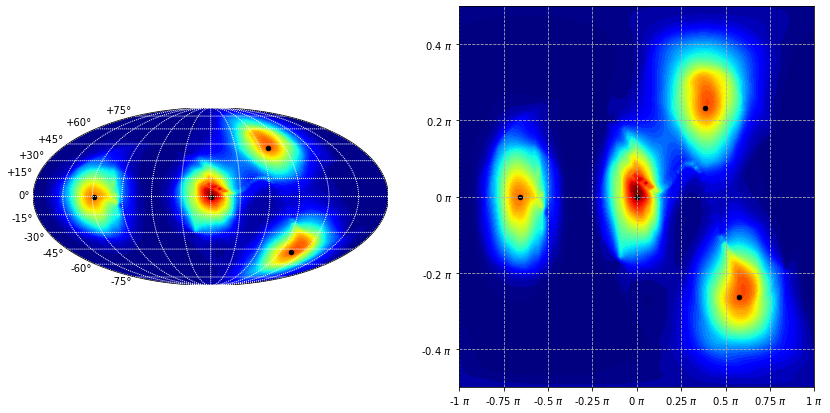

Epoch:15 batch id: 0
Epoch: 15/19, i/N: 0/400 with KL -0.04 and nll loss 1.74

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 15/19, i/N: 0/400 KL_test 0.014316797256469727 and nll_test 1.7953932285308838

From current batch
Epoch: 15, i/N: 0/400 avg ldj from current batch 0.74

From 100000 uniform samples
Epoch: 15/19, i/N: 0/400 MC density sum 1.00
Epoch: 15/19, i/N: 0/400 avg ldj -1.16
#####################

Epoch: 15/19, i/N: 10/400 with KL 0.03 and nll loss 1.81
Epoch: 15/19, i/N: 20/400 with KL 0.04 and nll loss 1.82
Epoch: 15/19, i/N: 30/400 with KL -0.03 and nll loss 1.75
Epoch: 15/19, i/N: 40/400 with KL 0.00 and nll loss 1.78
Epoch: 15/19, i/N: 50/400 with KL 0.17 and nll loss 1.95
Epoch: 15/19, i/N: 60/400 with KL 0.09 and nll loss 1.87
Epoch: 15/19, i/N: 70/400 with KL 0.08 and nll loss 1.86
Epoch: 15/19, i/N: 80/400 with KL -0.02 and nll loss 1.76
Epoch: 15/19, i/N: 90/400 with KL 0.12 and nll loss 1.90
Epoch: 15/19, i/N: 

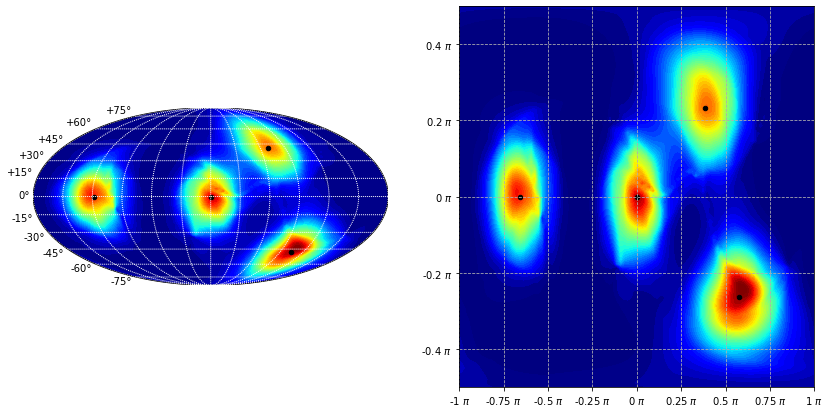

Epoch:16 batch id: 0
Epoch: 16/19, i/N: 0/400 with KL 0.04 and nll loss 1.82

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 16/19, i/N: 0/400 KL_test 0.007904529571533203 and nll_test 1.7889809608459473

From current batch
Epoch: 16, i/N: 0/400 avg ldj from current batch 0.74

From 100000 uniform samples
Epoch: 16/19, i/N: 0/400 MC density sum 1.00
Epoch: 16/19, i/N: 0/400 avg ldj -1.15
#####################

Epoch: 16/19, i/N: 10/400 with KL -0.05 and nll loss 1.73
Epoch: 16/19, i/N: 20/400 with KL 0.02 and nll loss 1.80
Epoch: 16/19, i/N: 30/400 with KL 0.04 and nll loss 1.82
Epoch: 16/19, i/N: 40/400 with KL 0.00 and nll loss 1.78
Epoch: 16/19, i/N: 50/400 with KL -0.08 and nll loss 1.71
Epoch: 16/19, i/N: 60/400 with KL 0.02 and nll loss 1.81
Epoch: 16/19, i/N: 70/400 with KL 0.04 and nll loss 1.82
Epoch: 16/19, i/N: 80/400 with KL 0.02 and nll loss 1.80
Epoch: 16/19, i/N: 90/400 with KL -0.01 and nll loss 1.77
Epoch: 16/19, i/N: 

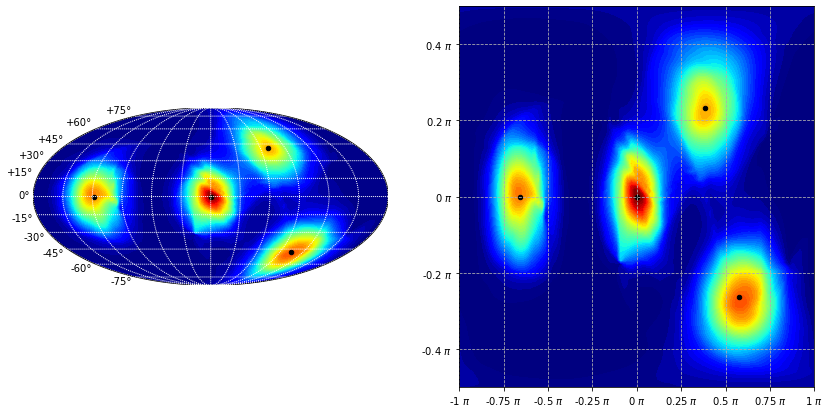

Epoch:17 batch id: 0
Epoch: 17/19, i/N: 0/400 with KL 0.07 and nll loss 1.85

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 17/19, i/N: 0/400 KL_test 0.009458065032958984 and nll_test 1.790534496307373

From current batch
Epoch: 17, i/N: 0/400 avg ldj from current batch 0.74

From 100000 uniform samples
Epoch: 17/19, i/N: 0/400 MC density sum 1.00
Epoch: 17/19, i/N: 0/400 avg ldj -1.13
#####################

Epoch: 17/19, i/N: 10/400 with KL 0.06 and nll loss 1.85
Epoch: 17/19, i/N: 20/400 with KL 0.06 and nll loss 1.84
Epoch: 17/19, i/N: 30/400 with KL 0.04 and nll loss 1.82
Epoch: 17/19, i/N: 40/400 with KL 0.07 and nll loss 1.85
Epoch: 17/19, i/N: 50/400 with KL -0.02 and nll loss 1.76
Epoch: 17/19, i/N: 60/400 with KL 0.05 and nll loss 1.83
Epoch: 17/19, i/N: 70/400 with KL 0.09 and nll loss 1.87
Epoch: 17/19, i/N: 80/400 with KL -0.08 and nll loss 1.70
Epoch: 17/19, i/N: 90/400 with KL -0.01 and nll loss 1.77
Epoch: 17/19, i/N: 1

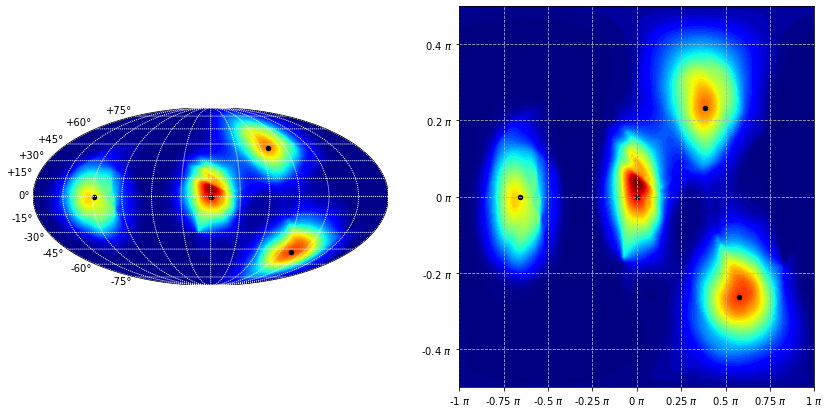

Epoch:18 batch id: 0
Epoch: 18/19, i/N: 0/400 with KL 0.00 and nll loss 1.79

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 18/19, i/N: 0/400 KL_test 0.01993274688720703 and nll_test 1.801009178161621

From current batch
Epoch: 18, i/N: 0/400 avg ldj from current batch 0.73

From 100000 uniform samples
Epoch: 18/19, i/N: 0/400 MC density sum 1.00
Epoch: 18/19, i/N: 0/400 avg ldj -1.21
#####################

Epoch: 18/19, i/N: 10/400 with KL 0.05 and nll loss 1.83
Epoch: 18/19, i/N: 20/400 with KL 0.08 and nll loss 1.86
Epoch: 18/19, i/N: 30/400 with KL 0.14 and nll loss 1.92
Epoch: 18/19, i/N: 40/400 with KL 0.15 and nll loss 1.93
Epoch: 18/19, i/N: 50/400 with KL -0.00 and nll loss 1.78
Epoch: 18/19, i/N: 60/400 with KL 0.05 and nll loss 1.83
Epoch: 18/19, i/N: 70/400 with KL 0.02 and nll loss 1.80
Epoch: 18/19, i/N: 80/400 with KL 0.01 and nll loss 1.79
Epoch: 18/19, i/N: 90/400 with KL -0.06 and nll loss 1.72
Epoch: 18/19, i/N: 100

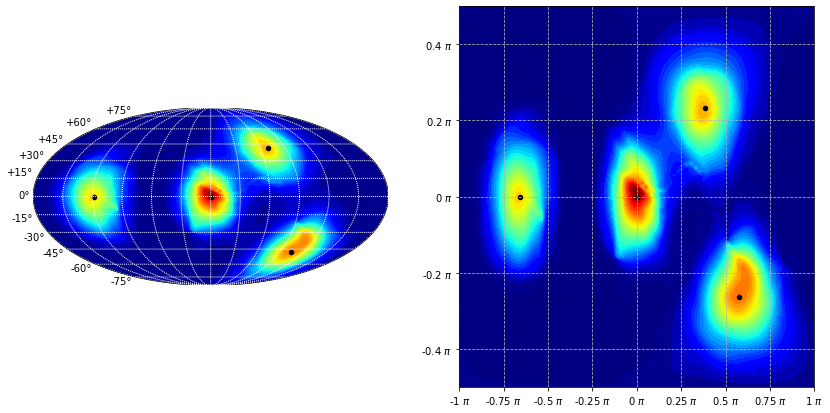

Epoch:19 batch id: 0
Epoch: 19/19, i/N: 0/400 with KL -0.02 and nll loss 1.76

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 19/19, i/N: 0/400 KL_test 0.013766765594482422 and nll_test 1.7948431968688965

From current batch
Epoch: 19, i/N: 0/400 avg ldj from current batch 0.74

From 100000 uniform samples
Epoch: 19/19, i/N: 0/400 MC density sum 0.99
Epoch: 19/19, i/N: 0/400 avg ldj -1.18
#####################

Epoch: 19/19, i/N: 10/400 with KL -0.02 and nll loss 1.76
Epoch: 19/19, i/N: 20/400 with KL -0.09 and nll loss 1.69
Epoch: 19/19, i/N: 30/400 with KL 0.01 and nll loss 1.79
Epoch: 19/19, i/N: 40/400 with KL -0.02 and nll loss 1.76
Epoch: 19/19, i/N: 50/400 with KL -0.00 and nll loss 1.78
Epoch: 19/19, i/N: 60/400 with KL -0.01 and nll loss 1.77
Epoch: 19/19, i/N: 70/400 with KL 0.10 and nll loss 1.88
Epoch: 19/19, i/N: 80/400 with KL 0.02 and nll loss 1.80
Epoch: 19/19, i/N: 90/400 with KL 0.04 and nll loss 1.82
Epoch: 19/19, i/

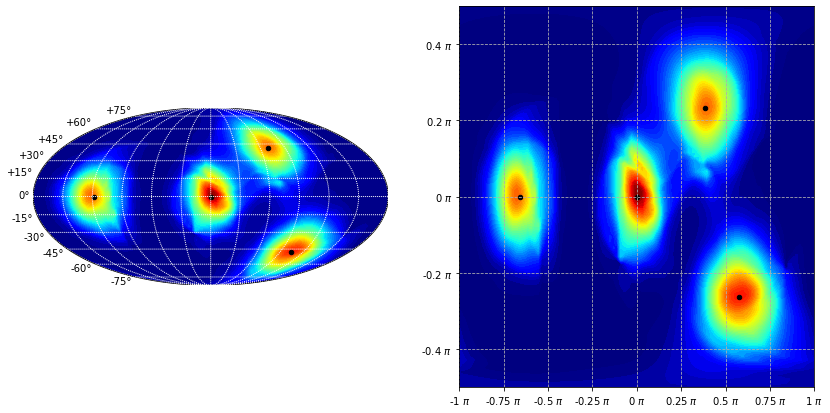

Epoch:19 batch id: 0


In [7]:
cou_spline = Coupling_Flow(num_flows = NUM_FLOWS_COU, 
                           num_dim_data= NUM_DIM_DATA,
                           flow_type = 'spline', 
                           num_centers = NUM_CENTERS,
                           num_bins = NUM_BINS,
                           cap_householder_refl=CAP_HOUSEHOLDER_REFL) 

cou_spline.to(device)

optimizer = optim.AdamW(cou_spline.parameters(), lr=lr, weight_decay=weight_decay)

print('##### Coupling Spline Flow #####')

train_model(model = cou_spline, 
            optimizer = optimizer,
            dataset = power_spherical_data,
            config = config,
            model_name = 'cou_s')



### Cylindrical Moebius flow

##### Cylindrical Moebius Flow #####


wandb: Wandb version 0.10.12 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


##### Model #####
Cylindrical_Flow(
  (scale): ModuleList(
    (0): _Cylindrical_Flow(
      (interval_spline): Interval_Spline_Flow(
        (params_predictor): MLP_masked(
          (input): MaskedLinear(
            (linear): Linear(in_features=1, out_features=128, bias=True)
          )
          (relu): ReLU()
          (out_widths): MaskedLinear(
            (linear): Linear(in_features=128, out_features=8, bias=True)
          )
          (out_heights): MaskedLinear(
            (linear): Linear(in_features=128, out_features=8, bias=True)
          )
          (out_derivatives): MaskedLinear(
            (linear): Linear(in_features=128, out_features=9, bias=True)
          )
        )
      )
      (circle_transf): Moebius_Flow(
        (param_predictor): MLP(
          (nn): Sequential(
            (0): Linear(in_features=1, out_features=128, bias=True)
            (1): ReLU()
            (2): Linear(in_features=128, out_features=16, bias=True)
          )
        )
      )
  

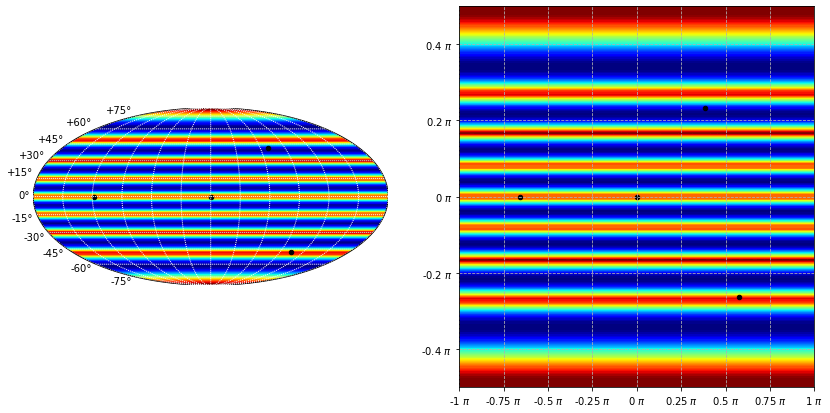

Epoch:0 batch id: 0
Epoch: 0/19, i/N: 0/400 with KL 0.75 and nll loss 2.53

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 0/19, i/N: 0/400 KL_test 0.749830961227417 and nll_test 2.530907392501831

From current batch
Epoch: 0, i/N: 0/400 avg ldj from current batch 0.00

From 100000 uniform samples
Epoch: 0/19, i/N: 0/400 MC density sum 1.00
Epoch: 0/19, i/N: 0/400 avg ldj -0.00
#####################

Epoch: 0/19, i/N: 10/400 with KL 0.74 and nll loss 2.52
Epoch: 0/19, i/N: 20/400 with KL 0.70 and nll loss 2.48
Epoch: 0/19, i/N: 30/400 with KL 0.63 and nll loss 2.42
Epoch: 0/19, i/N: 40/400 with KL 0.56 and nll loss 2.34
Epoch: 0/19, i/N: 50/400 with KL 0.46 and nll loss 2.24
Epoch: 0/19, i/N: 60/400 with KL 0.45 and nll loss 2.23
Epoch: 0/19, i/N: 70/400 with KL 0.38 and nll loss 2.17
Epoch: 0/19, i/N: 80/400 with KL 0.32 and nll loss 2.10
Epoch: 0/19, i/N: 90/400 with KL 0.42 and nll loss 2.20
Epoch: 0/19, i/N: 100/400 with KL 0.37 an

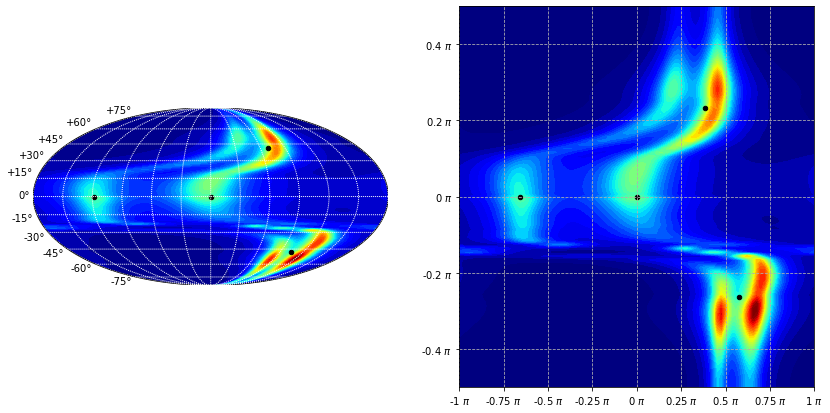

Epoch:1 batch id: 0
Epoch: 1/19, i/N: 0/400 with KL 0.25 and nll loss 2.04

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 1/19, i/N: 0/400 KL_test 0.25479650497436523 and nll_test 2.0358729362487793

From current batch
Epoch: 1, i/N: 0/400 avg ldj from current batch 0.50

From 100000 uniform samples
Epoch: 1/19, i/N: 0/400 MC density sum 1.00
Epoch: 1/19, i/N: 0/400 avg ldj -0.60
#####################

Epoch: 1/19, i/N: 10/400 with KL 0.25 and nll loss 2.03
Epoch: 1/19, i/N: 20/400 with KL 0.27 and nll loss 2.05
Epoch: 1/19, i/N: 30/400 with KL 0.15 and nll loss 1.93
Epoch: 1/19, i/N: 40/400 with KL 0.32 and nll loss 2.10
Epoch: 1/19, i/N: 50/400 with KL 0.24 and nll loss 2.02
Epoch: 1/19, i/N: 60/400 with KL 0.23 and nll loss 2.02
Epoch: 1/19, i/N: 70/400 with KL 0.23 and nll loss 2.01
Epoch: 1/19, i/N: 80/400 with KL 0.37 and nll loss 2.15
Epoch: 1/19, i/N: 90/400 with KL 0.28 and nll loss 2.06
Epoch: 1/19, i/N: 100/400 with KL 0.30

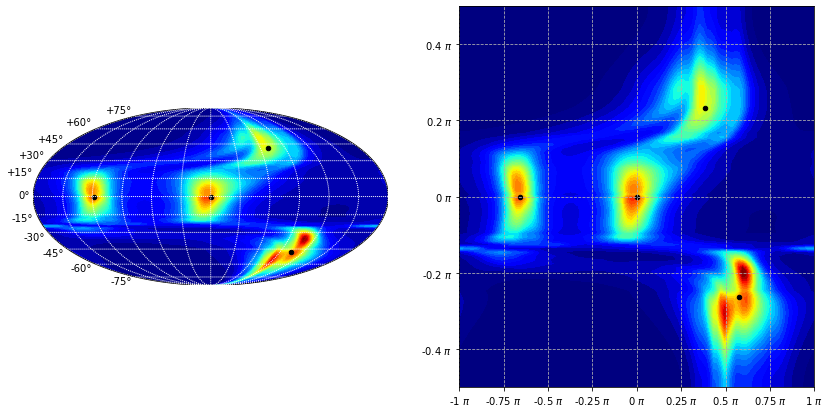

Epoch:2 batch id: 0
Epoch: 2/19, i/N: 0/400 with KL 0.19 and nll loss 1.97

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 2/19, i/N: 0/400 KL_test 0.14633715152740479 and nll_test 1.9274135828018188

From current batch
Epoch: 2, i/N: 0/400 avg ldj from current batch 0.60

From 100000 uniform samples
Epoch: 2/19, i/N: 0/400 MC density sum 1.00
Epoch: 2/19, i/N: 0/400 avg ldj -0.66
#####################

Epoch: 2/19, i/N: 10/400 with KL 0.15 and nll loss 1.93
Epoch: 2/19, i/N: 20/400 with KL 0.15 and nll loss 1.94
Epoch: 2/19, i/N: 30/400 with KL 0.13 and nll loss 1.91
Epoch: 2/19, i/N: 40/400 with KL 0.12 and nll loss 1.90
Epoch: 2/19, i/N: 50/400 with KL 0.16 and nll loss 1.95
Epoch: 2/19, i/N: 60/400 with KL 0.23 and nll loss 2.01
Epoch: 2/19, i/N: 70/400 with KL 0.15 and nll loss 1.93
Epoch: 2/19, i/N: 80/400 with KL 0.14 and nll loss 1.92
Epoch: 2/19, i/N: 90/400 with KL 0.14 and nll loss 1.92
Epoch: 2/19, i/N: 100/400 with KL 0.13

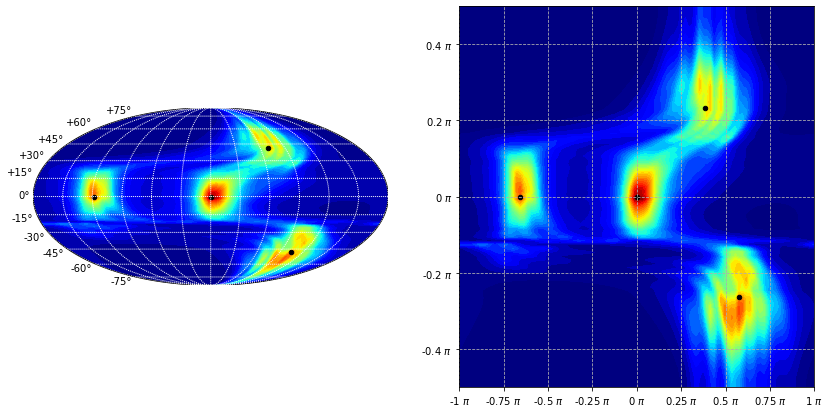

Epoch:3 batch id: 0
Epoch: 3/19, i/N: 0/400 with KL 0.20 and nll loss 1.98

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 3/19, i/N: 0/400 KL_test 0.13881707191467285 and nll_test 1.919893503189087

From current batch
Epoch: 3, i/N: 0/400 avg ldj from current batch 0.61

From 100000 uniform samples
Epoch: 3/19, i/N: 0/400 MC density sum 1.00
Epoch: 3/19, i/N: 0/400 avg ldj -0.74
#####################

Epoch: 3/19, i/N: 10/400 with KL 0.09 and nll loss 1.87
Epoch: 3/19, i/N: 20/400 with KL 0.22 and nll loss 2.01
Epoch: 3/19, i/N: 30/400 with KL 0.02 and nll loss 1.80
Epoch: 3/19, i/N: 40/400 with KL 0.07 and nll loss 1.85
Epoch: 3/19, i/N: 50/400 with KL 0.01 and nll loss 1.79
Epoch: 3/19, i/N: 60/400 with KL 0.17 and nll loss 1.95
Epoch: 3/19, i/N: 70/400 with KL 0.02 and nll loss 1.80
Epoch: 3/19, i/N: 80/400 with KL 0.22 and nll loss 2.00
Epoch: 3/19, i/N: 90/400 with KL 0.06 and nll loss 1.84
Epoch: 3/19, i/N: 100/400 with KL 0.13 

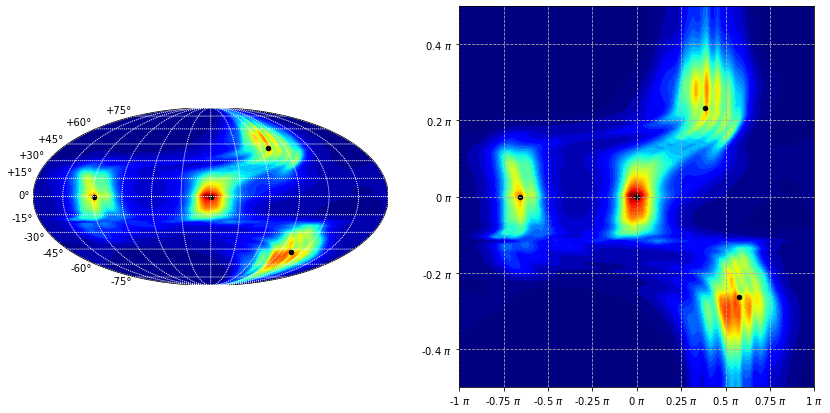

Epoch:4 batch id: 0
Epoch: 4/19, i/N: 0/400 with KL 0.08 and nll loss 1.86

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 4/19, i/N: 0/400 KL_test 0.10427355766296387 and nll_test 1.885349988937378

From current batch
Epoch: 4, i/N: 0/400 avg ldj from current batch 0.65

From 100000 uniform samples
Epoch: 4/19, i/N: 0/400 MC density sum 1.00
Epoch: 4/19, i/N: 0/400 avg ldj -0.72
#####################

Epoch: 4/19, i/N: 10/400 with KL 0.05 and nll loss 1.84
Epoch: 4/19, i/N: 20/400 with KL 0.04 and nll loss 1.82
Epoch: 4/19, i/N: 30/400 with KL 0.15 and nll loss 1.93
Epoch: 4/19, i/N: 40/400 with KL 0.09 and nll loss 1.87
Epoch: 4/19, i/N: 50/400 with KL 0.04 and nll loss 1.82
Epoch: 4/19, i/N: 60/400 with KL 0.04 and nll loss 1.83
Epoch: 4/19, i/N: 70/400 with KL 0.11 and nll loss 1.89
Epoch: 4/19, i/N: 80/400 with KL 0.18 and nll loss 1.96
Epoch: 4/19, i/N: 90/400 with KL 0.02 and nll loss 1.80
Epoch: 4/19, i/N: 100/400 with KL 0.09 

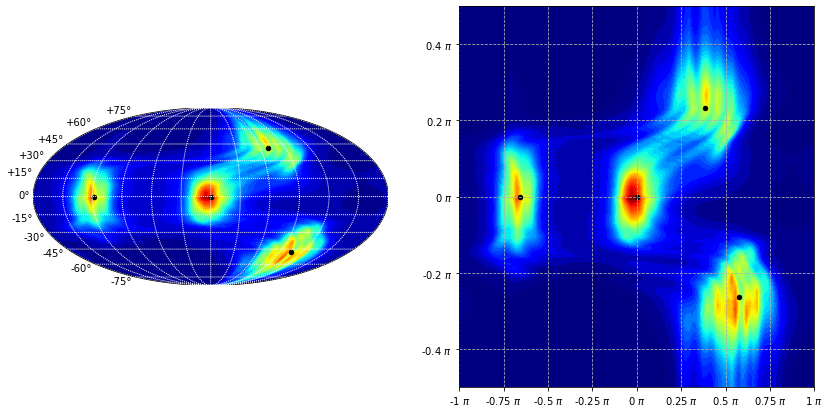

Epoch:5 batch id: 0
Epoch: 5/19, i/N: 0/400 with KL 0.04 and nll loss 1.82

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 5/19, i/N: 0/400 KL_test 0.0880887508392334 and nll_test 1.8691651821136475

From current batch
Epoch: 5, i/N: 0/400 avg ldj from current batch 0.66

From 100000 uniform samples
Epoch: 5/19, i/N: 0/400 MC density sum 1.00
Epoch: 5/19, i/N: 0/400 avg ldj -0.73
#####################

Epoch: 5/19, i/N: 10/400 with KL 0.17 and nll loss 1.95
Epoch: 5/19, i/N: 20/400 with KL 0.07 and nll loss 1.85
Epoch: 5/19, i/N: 30/400 with KL -0.01 and nll loss 1.78
Epoch: 5/19, i/N: 40/400 with KL 0.19 and nll loss 1.97
Epoch: 5/19, i/N: 50/400 with KL 0.08 and nll loss 1.86
Epoch: 5/19, i/N: 60/400 with KL 0.13 and nll loss 1.91
Epoch: 5/19, i/N: 70/400 with KL 0.13 and nll loss 1.91
Epoch: 5/19, i/N: 80/400 with KL 0.15 and nll loss 1.93
Epoch: 5/19, i/N: 90/400 with KL -0.03 and nll loss 1.76
Epoch: 5/19, i/N: 100/400 with KL 0.0

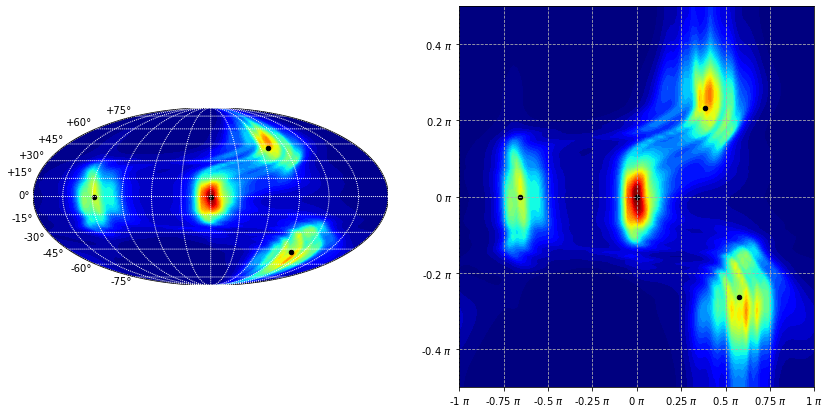

Epoch:6 batch id: 0
Epoch: 6/19, i/N: 0/400 with KL 0.18 and nll loss 1.97

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 6/19, i/N: 0/400 KL_test 0.08260536193847656 and nll_test 1.8636817932128906

From current batch
Epoch: 6, i/N: 0/400 avg ldj from current batch 0.67

From 100000 uniform samples
Epoch: 6/19, i/N: 0/400 MC density sum 1.00
Epoch: 6/19, i/N: 0/400 avg ldj -0.80
#####################

Epoch: 6/19, i/N: 10/400 with KL 0.10 and nll loss 1.88
Epoch: 6/19, i/N: 20/400 with KL 0.07 and nll loss 1.85
Epoch: 6/19, i/N: 30/400 with KL 0.08 and nll loss 1.86
Epoch: 6/19, i/N: 40/400 with KL 0.07 and nll loss 1.85
Epoch: 6/19, i/N: 50/400 with KL 0.10 and nll loss 1.88
Epoch: 6/19, i/N: 60/400 with KL 0.01 and nll loss 1.79
Epoch: 6/19, i/N: 70/400 with KL 0.11 and nll loss 1.89
Epoch: 6/19, i/N: 80/400 with KL 0.16 and nll loss 1.94
Epoch: 6/19, i/N: 90/400 with KL 0.10 and nll loss 1.88
Epoch: 6/19, i/N: 100/400 with KL 0.03

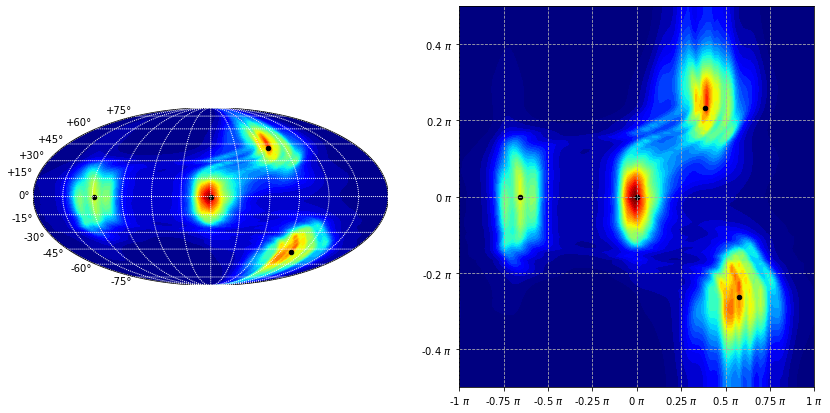

Epoch:7 batch id: 0
Epoch: 7/19, i/N: 0/400 with KL 0.14 and nll loss 1.92

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 7/19, i/N: 0/400 KL_test 0.0625607967376709 and nll_test 1.843637228012085

From current batch
Epoch: 7, i/N: 0/400 avg ldj from current batch 0.69

From 100000 uniform samples
Epoch: 7/19, i/N: 0/400 MC density sum 1.00
Epoch: 7/19, i/N: 0/400 avg ldj -0.80
#####################

Epoch: 7/19, i/N: 10/400 with KL 0.09 and nll loss 1.87
Epoch: 7/19, i/N: 20/400 with KL -0.02 and nll loss 1.76
Epoch: 7/19, i/N: 30/400 with KL 0.11 and nll loss 1.89
Epoch: 7/19, i/N: 40/400 with KL 0.09 and nll loss 1.87
Epoch: 7/19, i/N: 50/400 with KL 0.01 and nll loss 1.79
Epoch: 7/19, i/N: 60/400 with KL 0.08 and nll loss 1.86
Epoch: 7/19, i/N: 70/400 with KL 0.06 and nll loss 1.84
Epoch: 7/19, i/N: 80/400 with KL 0.02 and nll loss 1.80
Epoch: 7/19, i/N: 90/400 with KL 0.06 and nll loss 1.84
Epoch: 7/19, i/N: 100/400 with KL 0.06 

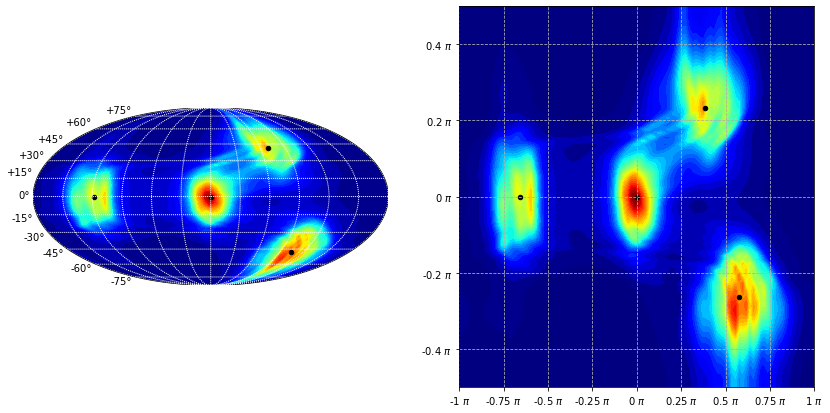

Epoch:8 batch id: 0
Epoch: 8/19, i/N: 0/400 with KL 0.03 and nll loss 1.81

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 8/19, i/N: 0/400 KL_test 0.04957270622253418 and nll_test 1.8306491374969482

From current batch
Epoch: 8, i/N: 0/400 avg ldj from current batch 0.70

From 100000 uniform samples
Epoch: 8/19, i/N: 0/400 MC density sum 1.00
Epoch: 8/19, i/N: 0/400 avg ldj -0.82
#####################

Epoch: 8/19, i/N: 10/400 with KL 0.04 and nll loss 1.82
Epoch: 8/19, i/N: 20/400 with KL 0.04 and nll loss 1.82
Epoch: 8/19, i/N: 30/400 with KL 0.08 and nll loss 1.86
Epoch: 8/19, i/N: 40/400 with KL 0.03 and nll loss 1.81
Epoch: 8/19, i/N: 50/400 with KL 0.02 and nll loss 1.80
Epoch: 8/19, i/N: 60/400 with KL 0.19 and nll loss 1.97
Epoch: 8/19, i/N: 70/400 with KL -0.05 and nll loss 1.73
Epoch: 8/19, i/N: 80/400 with KL 0.01 and nll loss 1.79
Epoch: 8/19, i/N: 90/400 with KL 0.06 and nll loss 1.84
Epoch: 8/19, i/N: 100/400 with KL -0.

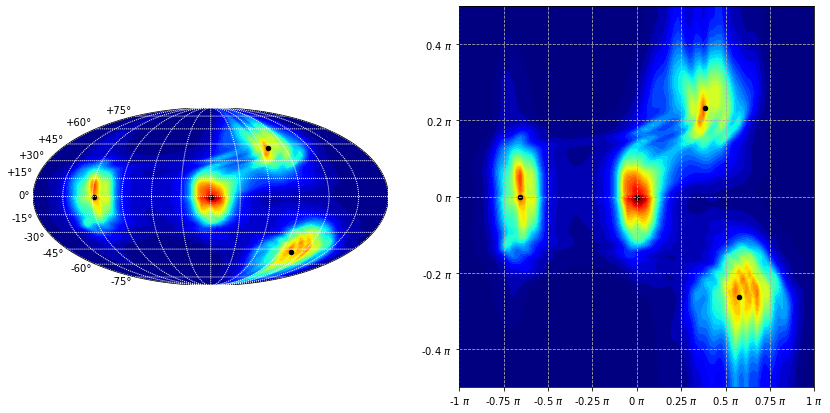

Epoch:9 batch id: 0
Epoch: 9/19, i/N: 0/400 with KL 0.13 and nll loss 1.91

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 9/19, i/N: 0/400 KL_test 0.050618886947631836 and nll_test 1.831695318222046

From current batch
Epoch: 9, i/N: 0/400 avg ldj from current batch 0.70

From 100000 uniform samples
Epoch: 9/19, i/N: 0/400 MC density sum 1.00
Epoch: 9/19, i/N: 0/400 avg ldj -0.83
#####################

Epoch: 9/19, i/N: 10/400 with KL 0.07 and nll loss 1.85
Epoch: 9/19, i/N: 20/400 with KL 0.06 and nll loss 1.84
Epoch: 9/19, i/N: 30/400 with KL 0.06 and nll loss 1.84
Epoch: 9/19, i/N: 40/400 with KL -0.04 and nll loss 1.74
Epoch: 9/19, i/N: 50/400 with KL 0.02 and nll loss 1.80
Epoch: 9/19, i/N: 60/400 with KL 0.08 and nll loss 1.86
Epoch: 9/19, i/N: 70/400 with KL 0.06 and nll loss 1.84
Epoch: 9/19, i/N: 80/400 with KL 0.14 and nll loss 1.92
Epoch: 9/19, i/N: 90/400 with KL 0.10 and nll loss 1.88
Epoch: 9/19, i/N: 100/400 with KL 0.0

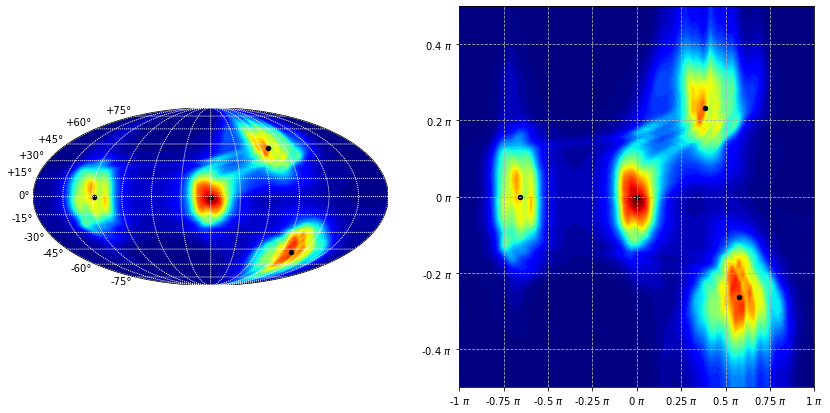

Epoch:10 batch id: 0
Epoch: 10/19, i/N: 0/400 with KL 0.01 and nll loss 1.79

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 10/19, i/N: 0/400 KL_test 0.04944133758544922 and nll_test 1.8305177688598633

From current batch
Epoch: 10, i/N: 0/400 avg ldj from current batch 0.70

From 100000 uniform samples
Epoch: 10/19, i/N: 0/400 MC density sum 1.00
Epoch: 10/19, i/N: 0/400 avg ldj -0.86
#####################

Epoch: 10/19, i/N: 10/400 with KL 0.07 and nll loss 1.85
Epoch: 10/19, i/N: 20/400 with KL 0.04 and nll loss 1.83
Epoch: 10/19, i/N: 30/400 with KL 0.09 and nll loss 1.87
Epoch: 10/19, i/N: 40/400 with KL 0.05 and nll loss 1.83
Epoch: 10/19, i/N: 50/400 with KL -0.02 and nll loss 1.77
Epoch: 10/19, i/N: 60/400 with KL 0.01 and nll loss 1.79
Epoch: 10/19, i/N: 70/400 with KL 0.08 and nll loss 1.86
Epoch: 10/19, i/N: 80/400 with KL 0.08 and nll loss 1.86
Epoch: 10/19, i/N: 90/400 with KL 0.09 and nll loss 1.87
Epoch: 10/19, i/N: 100

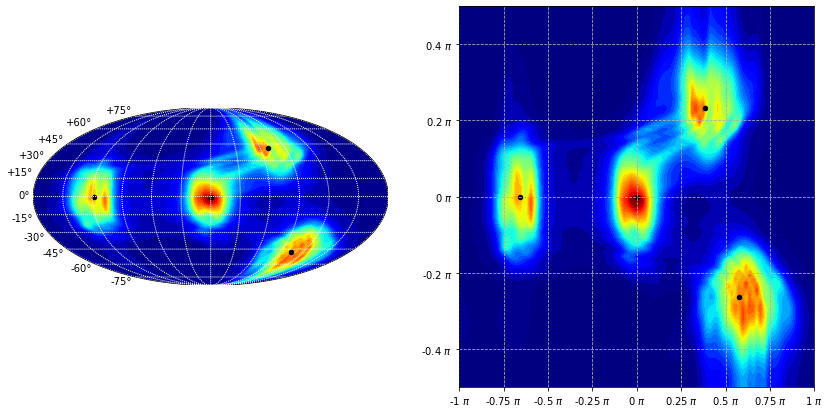

Epoch:11 batch id: 0
Epoch: 11/19, i/N: 0/400 with KL -0.01 and nll loss 1.77

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 11/19, i/N: 0/400 KL_test 0.05117344856262207 and nll_test 1.8322498798370361

From current batch
Epoch: 11, i/N: 0/400 avg ldj from current batch 0.70

From 100000 uniform samples
Epoch: 11/19, i/N: 0/400 MC density sum 1.00
Epoch: 11/19, i/N: 0/400 avg ldj -0.88
#####################

Epoch: 11/19, i/N: 10/400 with KL 0.04 and nll loss 1.82
Epoch: 11/19, i/N: 20/400 with KL -0.04 and nll loss 1.74
Epoch: 11/19, i/N: 30/400 with KL 0.06 and nll loss 1.85
Epoch: 11/19, i/N: 40/400 with KL 0.05 and nll loss 1.83
Epoch: 11/19, i/N: 50/400 with KL 0.05 and nll loss 1.83
Epoch: 11/19, i/N: 60/400 with KL 0.00 and nll loss 1.78
Epoch: 11/19, i/N: 70/400 with KL 0.13 and nll loss 1.91
Epoch: 11/19, i/N: 80/400 with KL 0.05 and nll loss 1.83
Epoch: 11/19, i/N: 90/400 with KL 0.02 and nll loss 1.80
Epoch: 11/19, i/N: 10

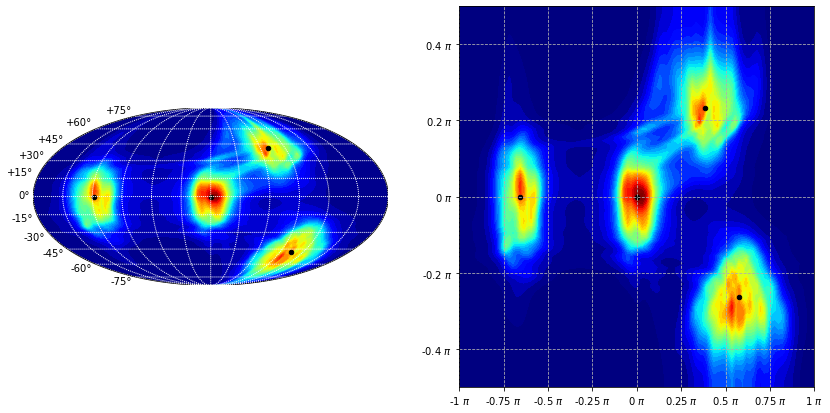

Epoch:12 batch id: 0
Epoch: 12/19, i/N: 0/400 with KL -0.02 and nll loss 1.76

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 12/19, i/N: 0/400 KL_test 0.04352140426635742 and nll_test 1.8245978355407715

From current batch
Epoch: 12, i/N: 0/400 avg ldj from current batch 0.71

From 100000 uniform samples
Epoch: 12/19, i/N: 0/400 MC density sum 1.00
Epoch: 12/19, i/N: 0/400 avg ldj -0.90
#####################

Epoch: 12/19, i/N: 10/400 with KL 0.03 and nll loss 1.81
Epoch: 12/19, i/N: 20/400 with KL 0.02 and nll loss 1.80
Epoch: 12/19, i/N: 30/400 with KL 0.06 and nll loss 1.84
Epoch: 12/19, i/N: 40/400 with KL 0.00 and nll loss 1.78
Epoch: 12/19, i/N: 50/400 with KL 0.06 and nll loss 1.84
Epoch: 12/19, i/N: 60/400 with KL 0.07 and nll loss 1.85
Epoch: 12/19, i/N: 70/400 with KL 0.02 and nll loss 1.80
Epoch: 12/19, i/N: 80/400 with KL 0.04 and nll loss 1.82
Epoch: 12/19, i/N: 90/400 with KL 0.08 and nll loss 1.86
Epoch: 12/19, i/N: 100

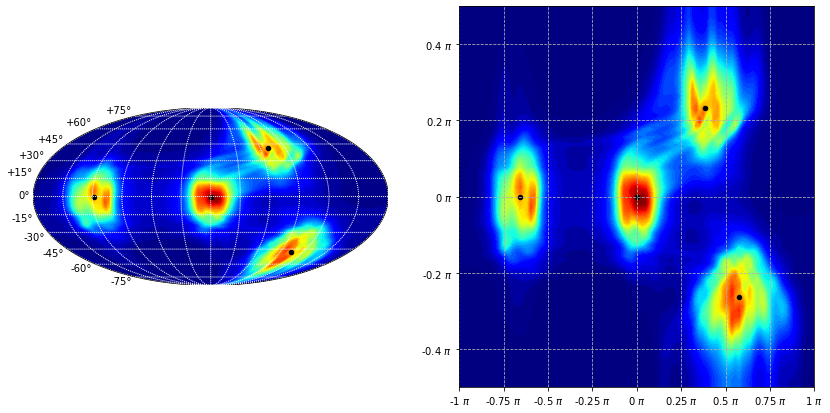

Epoch:13 batch id: 0
Epoch: 13/19, i/N: 0/400 with KL 0.08 and nll loss 1.86

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 13/19, i/N: 0/400 KL_test 0.04805350303649902 and nll_test 1.829129934310913

From current batch
Epoch: 13, i/N: 0/400 avg ldj from current batch 0.70

From 100000 uniform samples
Epoch: 13/19, i/N: 0/400 MC density sum 1.00
Epoch: 13/19, i/N: 0/400 avg ldj -0.92
#####################

Epoch: 13/19, i/N: 10/400 with KL 0.06 and nll loss 1.84
Epoch: 13/19, i/N: 20/400 with KL 0.10 and nll loss 1.88
Epoch: 13/19, i/N: 30/400 with KL 0.03 and nll loss 1.81
Epoch: 13/19, i/N: 40/400 with KL 0.14 and nll loss 1.92
Epoch: 13/19, i/N: 50/400 with KL 0.05 and nll loss 1.84
Epoch: 13/19, i/N: 60/400 with KL 0.04 and nll loss 1.82
Epoch: 13/19, i/N: 70/400 with KL 0.08 and nll loss 1.86
Epoch: 13/19, i/N: 80/400 with KL 0.04 and nll loss 1.82
Epoch: 13/19, i/N: 90/400 with KL -0.01 and nll loss 1.77
Epoch: 13/19, i/N: 100/

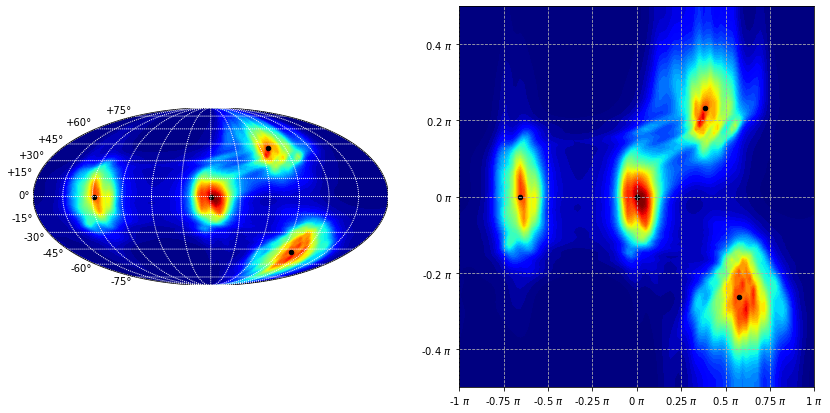

Epoch:14 batch id: 0
Epoch: 14/19, i/N: 0/400 with KL -0.00 and nll loss 1.78

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 14/19, i/N: 0/400 KL_test 0.041280508041381836 and nll_test 1.822356939315796

From current batch
Epoch: 14, i/N: 0/400 avg ldj from current batch 0.71

From 100000 uniform samples
Epoch: 14/19, i/N: 0/400 MC density sum 1.00
Epoch: 14/19, i/N: 0/400 avg ldj -0.90
#####################

Epoch: 14/19, i/N: 10/400 with KL 0.07 and nll loss 1.85
Epoch: 14/19, i/N: 20/400 with KL 0.11 and nll loss 1.89
Epoch: 14/19, i/N: 30/400 with KL 0.14 and nll loss 1.92
Epoch: 14/19, i/N: 40/400 with KL 0.07 and nll loss 1.85
Epoch: 14/19, i/N: 50/400 with KL 0.07 and nll loss 1.85
Epoch: 14/19, i/N: 60/400 with KL 0.12 and nll loss 1.90
Epoch: 14/19, i/N: 70/400 with KL 0.00 and nll loss 1.78
Epoch: 14/19, i/N: 80/400 with KL 0.02 and nll loss 1.80
Epoch: 14/19, i/N: 90/400 with KL 0.10 and nll loss 1.88
Epoch: 14/19, i/N: 100

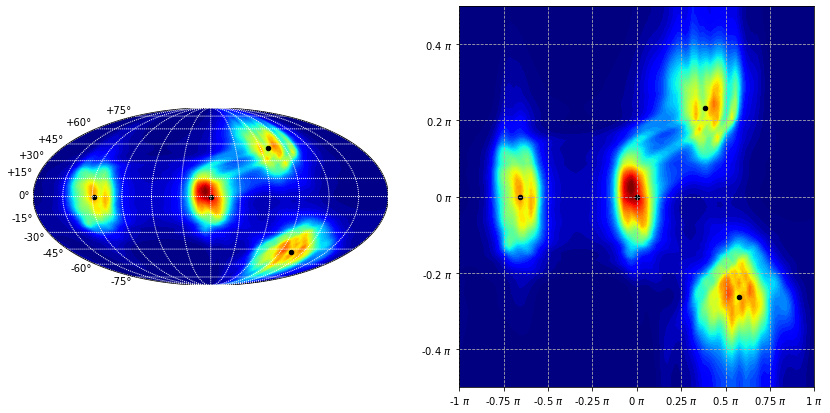

Epoch:15 batch id: 0
Epoch: 15/19, i/N: 0/400 with KL 0.14 and nll loss 1.92

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 15/19, i/N: 0/400 KL_test 0.042027831077575684 and nll_test 1.8231042623519897

From current batch
Epoch: 15, i/N: 0/400 avg ldj from current batch 0.71

From 100000 uniform samples
Epoch: 15/19, i/N: 0/400 MC density sum 1.00
Epoch: 15/19, i/N: 0/400 avg ldj -0.89
#####################

Epoch: 15/19, i/N: 10/400 with KL 0.02 and nll loss 1.80
Epoch: 15/19, i/N: 20/400 with KL 0.06 and nll loss 1.84
Epoch: 15/19, i/N: 30/400 with KL 0.08 and nll loss 1.86
Epoch: 15/19, i/N: 40/400 with KL 0.08 and nll loss 1.86
Epoch: 15/19, i/N: 50/400 with KL 0.06 and nll loss 1.84
Epoch: 15/19, i/N: 60/400 with KL 0.00 and nll loss 1.78
Epoch: 15/19, i/N: 70/400 with KL -0.00 and nll loss 1.78
Epoch: 15/19, i/N: 80/400 with KL 0.04 and nll loss 1.82
Epoch: 15/19, i/N: 90/400 with KL 0.08 and nll loss 1.87
Epoch: 15/19, i/N: 10

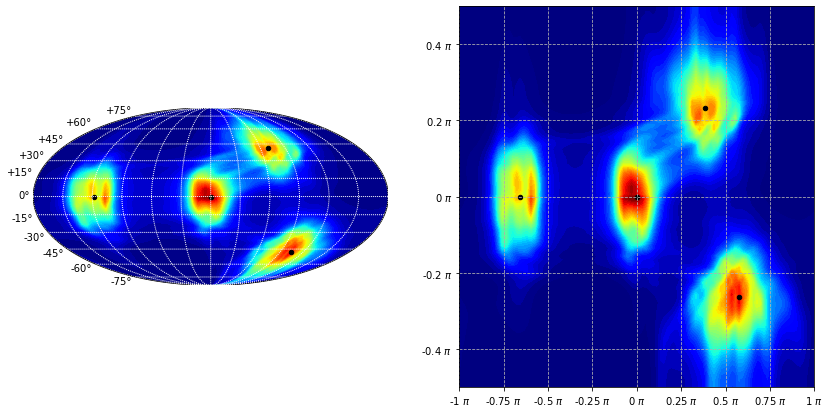

Epoch:16 batch id: 0
Epoch: 16/19, i/N: 0/400 with KL 0.04 and nll loss 1.82

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 16/19, i/N: 0/400 KL_test 0.04669761657714844 and nll_test 1.8277740478515625

From current batch
Epoch: 16, i/N: 0/400 avg ldj from current batch 0.70

From 100000 uniform samples
Epoch: 16/19, i/N: 0/400 MC density sum 1.00
Epoch: 16/19, i/N: 0/400 avg ldj -0.89
#####################

Epoch: 16/19, i/N: 10/400 with KL -0.08 and nll loss 1.70
Epoch: 16/19, i/N: 20/400 with KL -0.01 and nll loss 1.77
Epoch: 16/19, i/N: 30/400 with KL -0.02 and nll loss 1.76
Epoch: 16/19, i/N: 40/400 with KL -0.03 and nll loss 1.75
Epoch: 16/19, i/N: 50/400 with KL 0.09 and nll loss 1.87
Epoch: 16/19, i/N: 60/400 with KL 0.00 and nll loss 1.78
Epoch: 16/19, i/N: 70/400 with KL 0.02 and nll loss 1.80
Epoch: 16/19, i/N: 80/400 with KL 0.10 and nll loss 1.88
Epoch: 16/19, i/N: 90/400 with KL 0.01 and nll loss 1.79
Epoch: 16/19, i/N: 

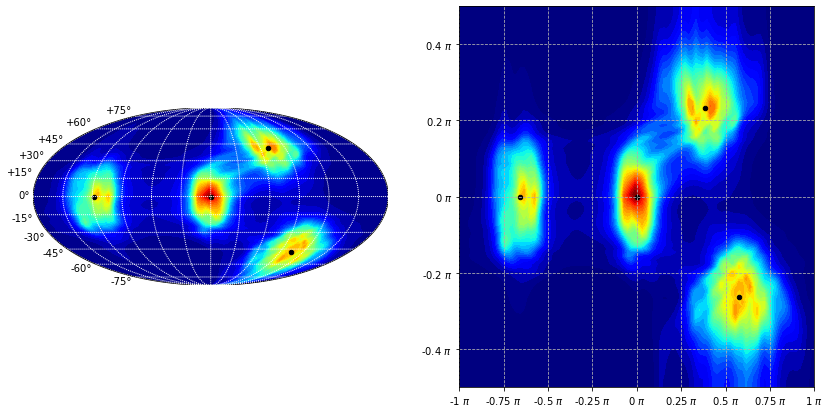

Epoch:17 batch id: 0
Epoch: 17/19, i/N: 0/400 with KL 0.17 and nll loss 1.95

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 17/19, i/N: 0/400 KL_test 0.04425764083862305 and nll_test 1.825334072113037

From current batch
Epoch: 17, i/N: 0/400 avg ldj from current batch 0.71

From 100000 uniform samples
Epoch: 17/19, i/N: 0/400 MC density sum 1.00
Epoch: 17/19, i/N: 0/400 avg ldj -0.90
#####################

Epoch: 17/19, i/N: 10/400 with KL 0.10 and nll loss 1.88
Epoch: 17/19, i/N: 20/400 with KL -0.01 and nll loss 1.77
Epoch: 17/19, i/N: 30/400 with KL 0.08 and nll loss 1.86
Epoch: 17/19, i/N: 40/400 with KL 0.03 and nll loss 1.81
Epoch: 17/19, i/N: 50/400 with KL 0.01 and nll loss 1.79
Epoch: 17/19, i/N: 60/400 with KL 0.10 and nll loss 1.89
Epoch: 17/19, i/N: 70/400 with KL 0.01 and nll loss 1.79
Epoch: 17/19, i/N: 80/400 with KL 0.16 and nll loss 1.94
Epoch: 17/19, i/N: 90/400 with KL -0.02 and nll loss 1.76
Epoch: 17/19, i/N: 100

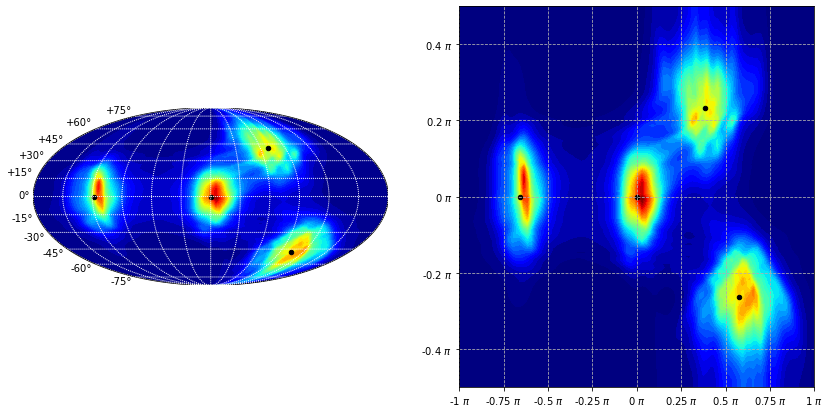

Epoch:18 batch id: 0
Epoch: 18/19, i/N: 0/400 with KL 0.03 and nll loss 1.81

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 18/19, i/N: 0/400 KL_test 0.05962264537811279 and nll_test 1.8406990766525269

From current batch
Epoch: 18, i/N: 0/400 avg ldj from current batch 0.69

From 100000 uniform samples
Epoch: 18/19, i/N: 0/400 MC density sum 1.00
Epoch: 18/19, i/N: 0/400 avg ldj -0.94
#####################

Epoch: 18/19, i/N: 10/400 with KL 0.03 and nll loss 1.81
Epoch: 18/19, i/N: 20/400 with KL 0.02 and nll loss 1.81
Epoch: 18/19, i/N: 30/400 with KL 0.07 and nll loss 1.85
Epoch: 18/19, i/N: 40/400 with KL 0.10 and nll loss 1.88
Epoch: 18/19, i/N: 50/400 with KL -0.00 and nll loss 1.78
Epoch: 18/19, i/N: 60/400 with KL 0.06 and nll loss 1.84
Epoch: 18/19, i/N: 70/400 with KL 0.14 and nll loss 1.92
Epoch: 18/19, i/N: 80/400 with KL 0.00 and nll loss 1.78
Epoch: 18/19, i/N: 90/400 with KL -0.03 and nll loss 1.75
Epoch: 18/19, i/N: 10

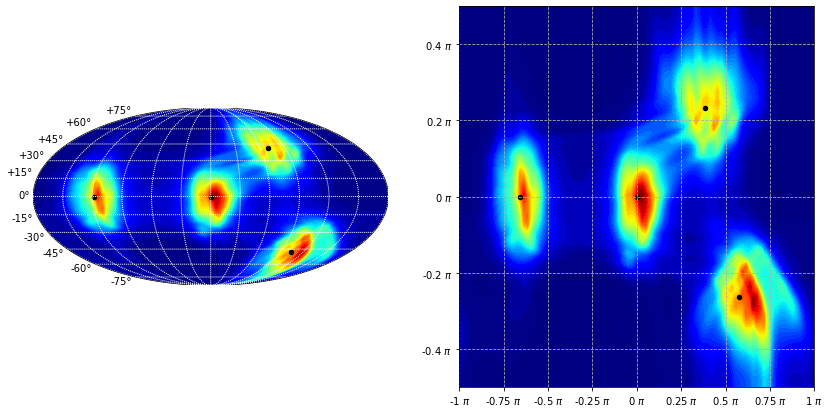

Epoch:19 batch id: 0
Epoch: 19/19, i/N: 0/400 with KL 0.13 and nll loss 1.91

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 19/19, i/N: 0/400 KL_test 0.059536099433898926 and nll_test 1.840612530708313

From current batch
Epoch: 19, i/N: 0/400 avg ldj from current batch 0.69

From 100000 uniform samples
Epoch: 19/19, i/N: 0/400 MC density sum 1.00
Epoch: 19/19, i/N: 0/400 avg ldj -0.88
#####################

Epoch: 19/19, i/N: 10/400 with KL 0.04 and nll loss 1.82
Epoch: 19/19, i/N: 20/400 with KL 0.16 and nll loss 1.94
Epoch: 19/19, i/N: 30/400 with KL 0.04 and nll loss 1.83
Epoch: 19/19, i/N: 40/400 with KL -0.01 and nll loss 1.77
Epoch: 19/19, i/N: 50/400 with KL 0.06 and nll loss 1.84
Epoch: 19/19, i/N: 60/400 with KL 0.04 and nll loss 1.82
Epoch: 19/19, i/N: 70/400 with KL -0.00 and nll loss 1.78
Epoch: 19/19, i/N: 80/400 with KL 0.00 and nll loss 1.78
Epoch: 19/19, i/N: 90/400 with KL 0.00 and nll loss 1.78
Epoch: 19/19, i/N: 10

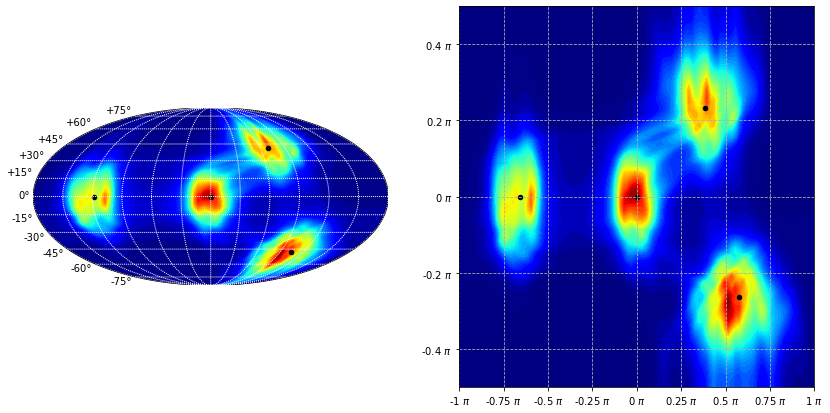

Epoch:19 batch id: 0


In [8]:
cyl_moeb = Cylindrical_Flow(num_flows=NUM_FLOWS_CYL,
                                 num_bins=NUM_BINS, 
                                 flow_type='moebius',
                                 num_dim_data=NUM_DIM_DATA, 
                                 num_centers=NUM_CENTERS)

cyl_moeb.to(device)

optimizer = optim.AdamW(cyl_moeb.parameters(), lr=lr, weight_decay=weight_decay)

print('##### Cylindrical Moebius Flow #####')

train_model(model = cyl_moeb, 
            optimizer = optimizer,
            dataset = power_spherical_data,
            config = config,
            model_name='ar_cyl_m')


### Cylindrical Spline flow

##### Cylindrical Spline Flow #####


wandb: Wandb version 0.10.12 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


##### Model #####
Cylindrical_Flow(
  (scale): ModuleList(
    (0): _Cylindrical_Flow(
      (interval_spline): Interval_Spline_Flow(
        (params_predictor): MLP_masked(
          (input): MaskedLinear(
            (linear): Linear(in_features=1, out_features=128, bias=True)
          )
          (relu): ReLU()
          (out_widths): MaskedLinear(
            (linear): Linear(in_features=128, out_features=8, bias=True)
          )
          (out_heights): MaskedLinear(
            (linear): Linear(in_features=128, out_features=8, bias=True)
          )
          (out_derivatives): MaskedLinear(
            (linear): Linear(in_features=128, out_features=9, bias=True)
          )
        )
      )
      (circle_transf): Circular_Spline_Flow(
        (params_predictor): MLP(
          (nn): Sequential(
            (0): Linear(in_features=1, out_features=128, bias=True)
            (1): ReLU()
            (2): Linear(in_features=128, out_features=24, bias=True)
          )
        )
 

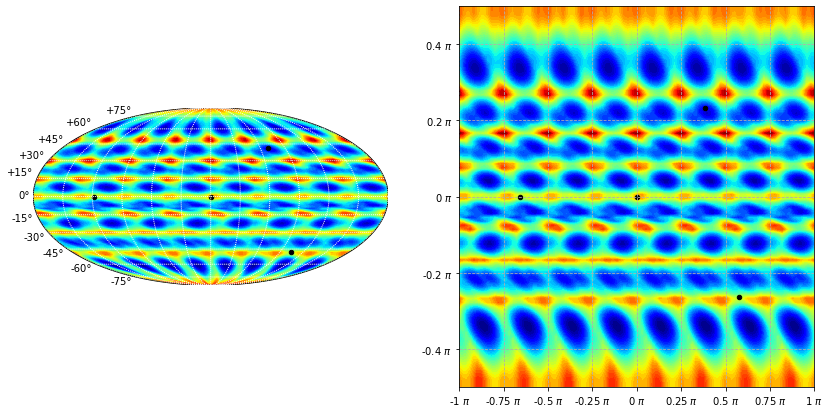

Epoch:0 batch id: 0
Epoch: 0/19, i/N: 0/400 with KL 0.75 and nll loss 2.53

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 0/19, i/N: 0/400 KL_test 0.7498586177825928 and nll_test 2.530935049057007

From current batch
Epoch: 0, i/N: 0/400 avg ldj from current batch 0.00

From 100000 uniform samples
Epoch: 0/19, i/N: 0/400 MC density sum 1.00
Epoch: 0/19, i/N: 0/400 avg ldj -0.00
#####################

Epoch: 0/19, i/N: 10/400 with KL 0.74 and nll loss 2.52
Epoch: 0/19, i/N: 20/400 with KL 0.70 and nll loss 2.48
Epoch: 0/19, i/N: 30/400 with KL 0.65 and nll loss 2.43
Epoch: 0/19, i/N: 40/400 with KL 0.56 and nll loss 2.35
Epoch: 0/19, i/N: 50/400 with KL 0.41 and nll loss 2.19
Epoch: 0/19, i/N: 60/400 with KL 0.41 and nll loss 2.19
Epoch: 0/19, i/N: 70/400 with KL 0.33 and nll loss 2.11
Epoch: 0/19, i/N: 80/400 with KL 0.37 and nll loss 2.15
Epoch: 0/19, i/N: 90/400 with KL 0.26 and nll loss 2.04
Epoch: 0/19, i/N: 100/400 with KL 0.16 a

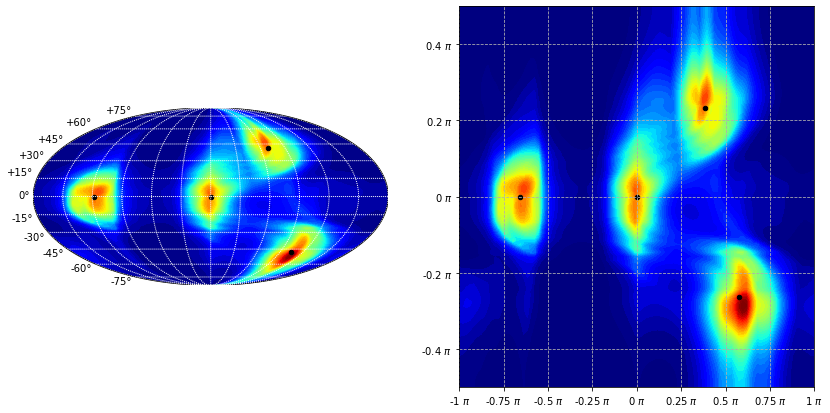

Epoch:1 batch id: 0
Epoch: 1/19, i/N: 0/400 with KL 0.08 and nll loss 1.86

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 1/19, i/N: 0/400 KL_test 0.07769083976745605 and nll_test 1.8587672710418701

From current batch
Epoch: 1, i/N: 0/400 avg ldj from current batch 0.67

From 100000 uniform samples
Epoch: 1/19, i/N: 0/400 MC density sum 1.00
Epoch: 1/19, i/N: 0/400 avg ldj -0.87
#####################

Epoch: 1/19, i/N: 10/400 with KL 0.06 and nll loss 1.84
Epoch: 1/19, i/N: 20/400 with KL 0.07 and nll loss 1.85
Epoch: 1/19, i/N: 30/400 with KL 0.04 and nll loss 1.82
Epoch: 1/19, i/N: 40/400 with KL 0.12 and nll loss 1.90
Epoch: 1/19, i/N: 50/400 with KL -0.00 and nll loss 1.78
Epoch: 1/19, i/N: 60/400 with KL 0.10 and nll loss 1.88
Epoch: 1/19, i/N: 70/400 with KL 0.04 and nll loss 1.82
Epoch: 1/19, i/N: 80/400 with KL 0.01 and nll loss 1.79
Epoch: 1/19, i/N: 90/400 with KL 0.07 and nll loss 1.85
Epoch: 1/19, i/N: 100/400 with KL 0.1

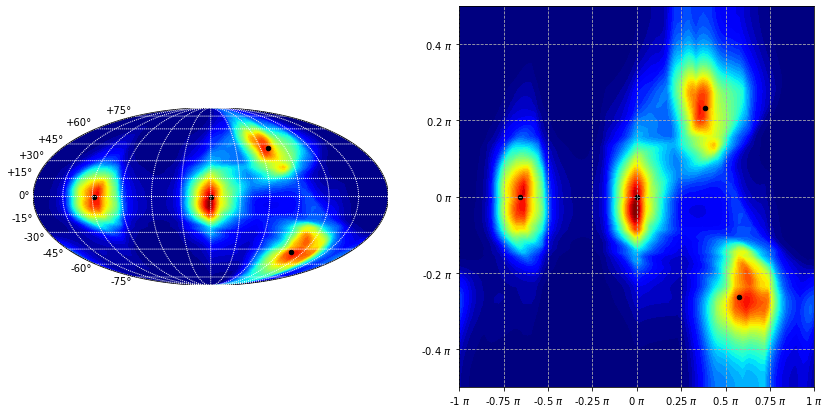

Epoch:2 batch id: 0
Epoch: 2/19, i/N: 0/400 with KL 0.02 and nll loss 1.80

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 2/19, i/N: 0/400 KL_test 0.05710327625274658 and nll_test 1.8381797075271606

From current batch
Epoch: 2, i/N: 0/400 avg ldj from current batch 0.69

From 100000 uniform samples
Epoch: 2/19, i/N: 0/400 MC density sum 1.00
Epoch: 2/19, i/N: 0/400 avg ldj -0.96
#####################

Epoch: 2/19, i/N: 10/400 with KL 0.08 and nll loss 1.86
Epoch: 2/19, i/N: 20/400 with KL 0.17 and nll loss 1.95
Epoch: 2/19, i/N: 30/400 with KL 0.11 and nll loss 1.89
Epoch: 2/19, i/N: 40/400 with KL 0.04 and nll loss 1.82
Epoch: 2/19, i/N: 50/400 with KL 0.09 and nll loss 1.87
Epoch: 2/19, i/N: 60/400 with KL 0.05 and nll loss 1.84
Epoch: 2/19, i/N: 70/400 with KL -0.03 and nll loss 1.75
Epoch: 2/19, i/N: 80/400 with KL 0.03 and nll loss 1.81
Epoch: 2/19, i/N: 90/400 with KL 0.05 and nll loss 1.83
Epoch: 2/19, i/N: 100/400 with KL 0.0

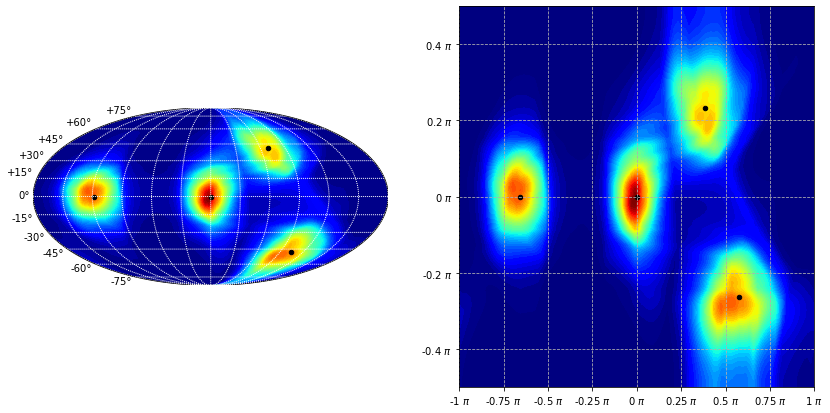

Epoch:3 batch id: 0
Epoch: 3/19, i/N: 0/400 with KL 0.15 and nll loss 1.93

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 3/19, i/N: 0/400 KL_test 0.030286788940429688 and nll_test 1.8113632202148438

From current batch
Epoch: 3, i/N: 0/400 avg ldj from current batch 0.72

From 100000 uniform samples
Epoch: 3/19, i/N: 0/400 MC density sum 1.00
Epoch: 3/19, i/N: 0/400 avg ldj -1.09
#####################

Epoch: 3/19, i/N: 10/400 with KL 0.07 and nll loss 1.85
Epoch: 3/19, i/N: 20/400 with KL 0.06 and nll loss 1.84
Epoch: 3/19, i/N: 30/400 with KL 0.04 and nll loss 1.82
Epoch: 3/19, i/N: 40/400 with KL 0.02 and nll loss 1.80
Epoch: 3/19, i/N: 50/400 with KL 0.02 and nll loss 1.80
Epoch: 3/19, i/N: 60/400 with KL 0.09 and nll loss 1.87
Epoch: 3/19, i/N: 70/400 with KL -0.09 and nll loss 1.69
Epoch: 3/19, i/N: 80/400 with KL -0.00 and nll loss 1.78
Epoch: 3/19, i/N: 90/400 with KL 0.02 and nll loss 1.80
Epoch: 3/19, i/N: 100/400 with KL 0

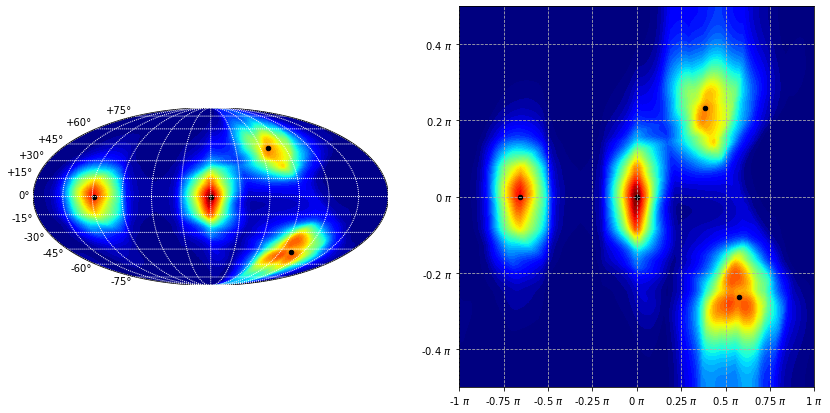

Epoch:4 batch id: 0
Epoch: 4/19, i/N: 0/400 with KL 0.09 and nll loss 1.87

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 4/19, i/N: 0/400 KL_test 0.025237560272216797 and nll_test 1.8063139915466309

From current batch
Epoch: 4, i/N: 0/400 avg ldj from current batch 0.72

From 100000 uniform samples
Epoch: 4/19, i/N: 0/400 MC density sum 1.00
Epoch: 4/19, i/N: 0/400 avg ldj -1.12
#####################

Epoch: 4/19, i/N: 10/400 with KL -0.05 and nll loss 1.73
Epoch: 4/19, i/N: 20/400 with KL -0.06 and nll loss 1.72
Epoch: 4/19, i/N: 30/400 with KL 0.00 and nll loss 1.78
Epoch: 4/19, i/N: 40/400 with KL -0.00 and nll loss 1.78
Epoch: 4/19, i/N: 50/400 with KL -0.01 and nll loss 1.78
Epoch: 4/19, i/N: 60/400 with KL -0.09 and nll loss 1.70
Epoch: 4/19, i/N: 70/400 with KL -0.03 and nll loss 1.75
Epoch: 4/19, i/N: 80/400 with KL 0.07 and nll loss 1.85
Epoch: 4/19, i/N: 90/400 with KL 0.05 and nll loss 1.83
Epoch: 4/19, i/N: 100/400 with 

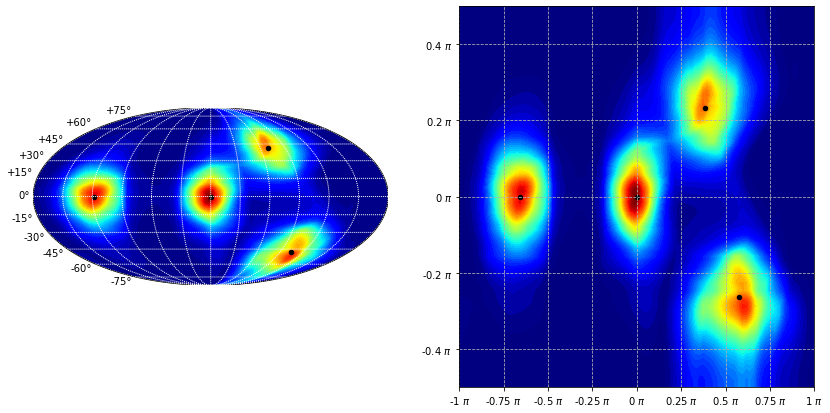

Epoch:5 batch id: 0
Epoch: 5/19, i/N: 0/400 with KL 0.04 and nll loss 1.82

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 5/19, i/N: 0/400 KL_test 0.02496325969696045 and nll_test 1.8060396909713745

From current batch
Epoch: 5, i/N: 0/400 avg ldj from current batch 0.72

From 100000 uniform samples
Epoch: 5/19, i/N: 0/400 MC density sum 1.00
Epoch: 5/19, i/N: 0/400 avg ldj -1.09
#####################

Epoch: 5/19, i/N: 10/400 with KL 0.13 and nll loss 1.91
Epoch: 5/19, i/N: 20/400 with KL -0.01 and nll loss 1.77
Epoch: 5/19, i/N: 30/400 with KL 0.07 and nll loss 1.85
Epoch: 5/19, i/N: 40/400 with KL 0.06 and nll loss 1.84
Epoch: 5/19, i/N: 50/400 with KL -0.10 and nll loss 1.69
Epoch: 5/19, i/N: 60/400 with KL 0.02 and nll loss 1.80
Epoch: 5/19, i/N: 70/400 with KL 0.06 and nll loss 1.85
Epoch: 5/19, i/N: 80/400 with KL 0.07 and nll loss 1.85
Epoch: 5/19, i/N: 90/400 with KL -0.01 and nll loss 1.77
Epoch: 5/19, i/N: 100/400 with KL -

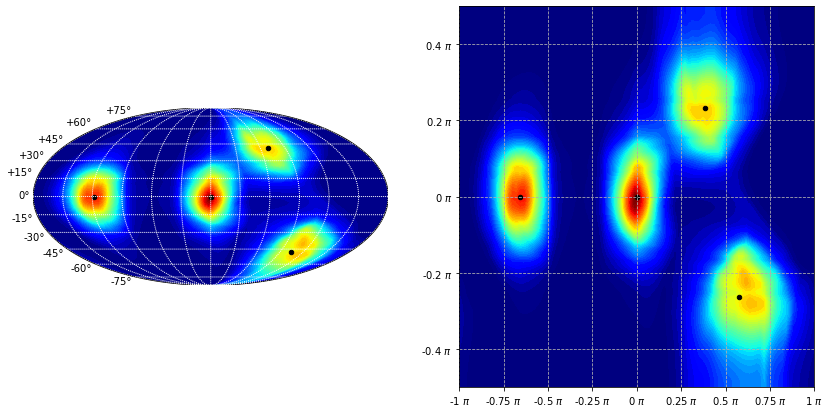

Epoch:6 batch id: 0
Epoch: 6/19, i/N: 0/400 with KL 0.06 and nll loss 1.84

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 6/19, i/N: 0/400 KL_test 0.021872520446777344 and nll_test 1.8029489517211914

From current batch
Epoch: 6, i/N: 0/400 avg ldj from current batch 0.73

From 100000 uniform samples
Epoch: 6/19, i/N: 0/400 MC density sum 1.01
Epoch: 6/19, i/N: 0/400 avg ldj -1.16
#####################

Epoch: 6/19, i/N: 10/400 with KL 0.10 and nll loss 1.88
Epoch: 6/19, i/N: 20/400 with KL 0.05 and nll loss 1.83
Epoch: 6/19, i/N: 30/400 with KL 0.04 and nll loss 1.82
Epoch: 6/19, i/N: 40/400 with KL -0.03 and nll loss 1.75
Epoch: 6/19, i/N: 50/400 with KL 0.07 and nll loss 1.85
Epoch: 6/19, i/N: 60/400 with KL 0.04 and nll loss 1.82
Epoch: 6/19, i/N: 70/400 with KL -0.07 and nll loss 1.71
Epoch: 6/19, i/N: 80/400 with KL -0.06 and nll loss 1.72
Epoch: 6/19, i/N: 90/400 with KL -0.08 and nll loss 1.70
Epoch: 6/19, i/N: 100/400 with KL

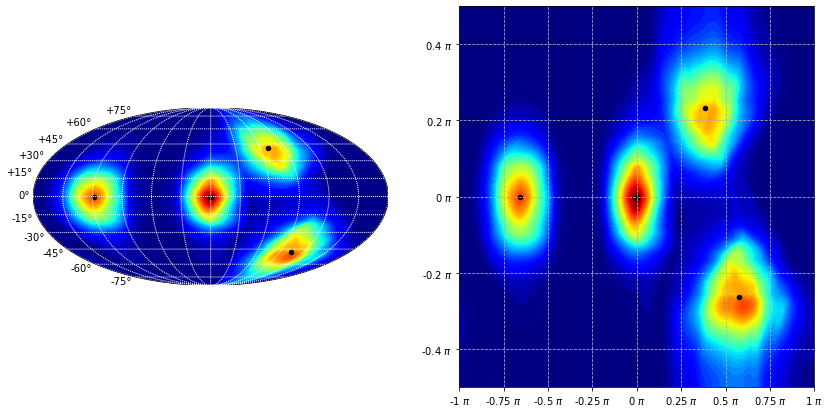

Epoch:7 batch id: 0
Epoch: 7/19, i/N: 0/400 with KL -0.03 and nll loss 1.75

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 7/19, i/N: 0/400 KL_test 0.015279054641723633 and nll_test 1.7963554859161377

From current batch
Epoch: 7, i/N: 0/400 avg ldj from current batch 0.73

From 100000 uniform samples
Epoch: 7/19, i/N: 0/400 MC density sum 1.00
Epoch: 7/19, i/N: 0/400 avg ldj -1.12
#####################

Epoch: 7/19, i/N: 10/400 with KL 0.04 and nll loss 1.82
Epoch: 7/19, i/N: 20/400 with KL 0.03 and nll loss 1.81
Epoch: 7/19, i/N: 30/400 with KL 0.04 and nll loss 1.82
Epoch: 7/19, i/N: 40/400 with KL 0.03 and nll loss 1.81
Epoch: 7/19, i/N: 50/400 with KL 0.09 and nll loss 1.87
Epoch: 7/19, i/N: 60/400 with KL 0.09 and nll loss 1.87
Epoch: 7/19, i/N: 70/400 with KL 0.00 and nll loss 1.78
Epoch: 7/19, i/N: 80/400 with KL -0.06 and nll loss 1.73
Epoch: 7/19, i/N: 90/400 with KL 0.02 and nll loss 1.80
Epoch: 7/19, i/N: 100/400 with KL 0

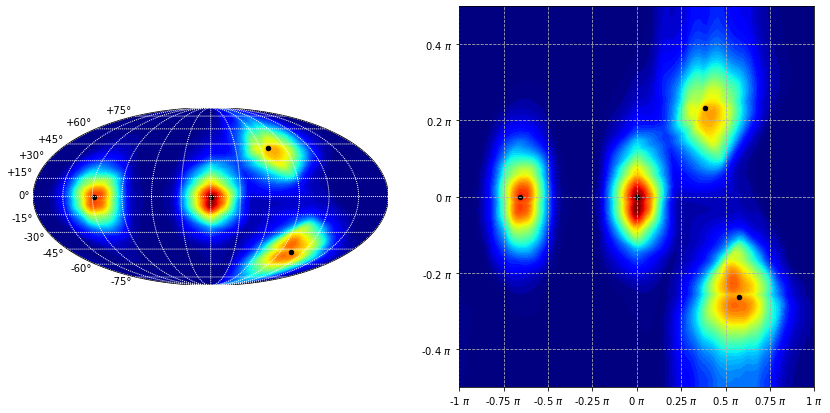

Epoch:8 batch id: 0
Epoch: 8/19, i/N: 0/400 with KL -0.07 and nll loss 1.71

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 8/19, i/N: 0/400 KL_test 0.015478134155273438 and nll_test 1.7965545654296875

From current batch
Epoch: 8, i/N: 0/400 avg ldj from current batch 0.73

From 100000 uniform samples
Epoch: 8/19, i/N: 0/400 MC density sum 1.00
Epoch: 8/19, i/N: 0/400 avg ldj -1.20
#####################

Epoch: 8/19, i/N: 10/400 with KL 0.07 and nll loss 1.85
Epoch: 8/19, i/N: 20/400 with KL 0.00 and nll loss 1.78
Epoch: 8/19, i/N: 30/400 with KL 0.04 and nll loss 1.82
Epoch: 8/19, i/N: 40/400 with KL -0.03 and nll loss 1.75
Epoch: 8/19, i/N: 50/400 with KL 0.10 and nll loss 1.88
Epoch: 8/19, i/N: 60/400 with KL 0.10 and nll loss 1.88
Epoch: 8/19, i/N: 70/400 with KL 0.01 and nll loss 1.79
Epoch: 8/19, i/N: 80/400 with KL 0.05 and nll loss 1.83
Epoch: 8/19, i/N: 90/400 with KL 0.06 and nll loss 1.84
Epoch: 8/19, i/N: 100/400 with KL -

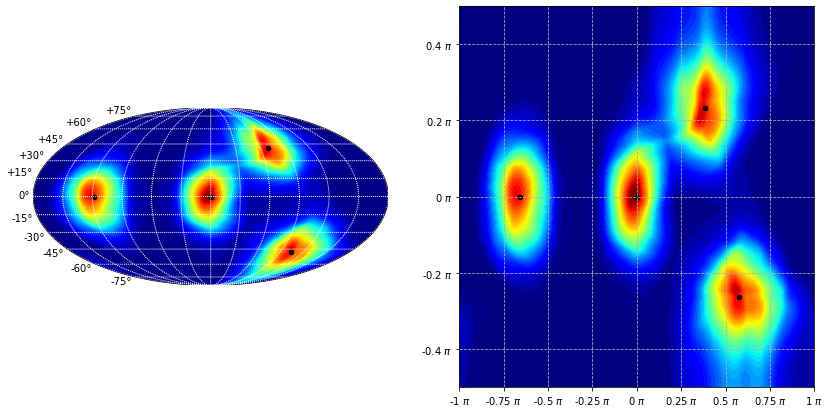

Epoch:9 batch id: 0
Epoch: 9/19, i/N: 0/400 with KL 0.03 and nll loss 1.82

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 9/19, i/N: 0/400 KL_test 0.015702486038208008 and nll_test 1.796778917312622

From current batch
Epoch: 9, i/N: 0/400 avg ldj from current batch 0.73

From 100000 uniform samples
Epoch: 9/19, i/N: 0/400 MC density sum 1.01
Epoch: 9/19, i/N: 0/400 avg ldj -1.20
#####################

Epoch: 9/19, i/N: 10/400 with KL 0.13 and nll loss 1.91
Epoch: 9/19, i/N: 20/400 with KL 0.05 and nll loss 1.84
Epoch: 9/19, i/N: 30/400 with KL -0.04 and nll loss 1.74
Epoch: 9/19, i/N: 40/400 with KL -0.00 and nll loss 1.78
Epoch: 9/19, i/N: 50/400 with KL -0.06 and nll loss 1.72
Epoch: 9/19, i/N: 60/400 with KL -0.03 and nll loss 1.75
Epoch: 9/19, i/N: 70/400 with KL 0.06 and nll loss 1.84
Epoch: 9/19, i/N: 80/400 with KL 0.03 and nll loss 1.81
Epoch: 9/19, i/N: 90/400 with KL 0.03 and nll loss 1.81
Epoch: 9/19, i/N: 100/400 with KL 

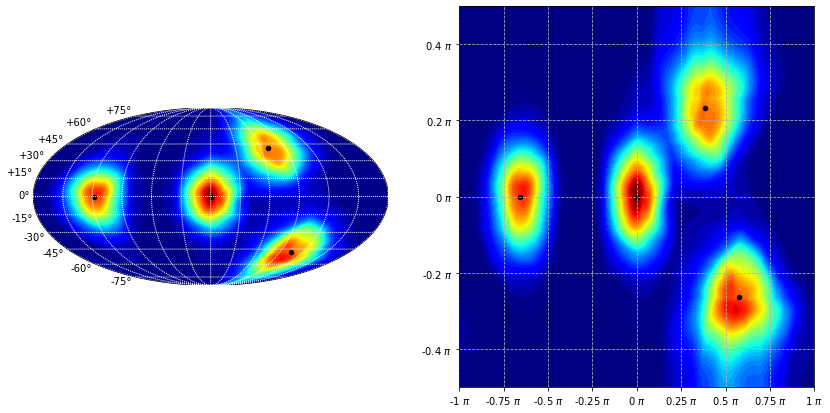

Epoch:10 batch id: 0
Epoch: 10/19, i/N: 0/400 with KL 0.03 and nll loss 1.81

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 10/19, i/N: 0/400 KL_test 0.017316579818725586 and nll_test 1.7983930110931396

From current batch
Epoch: 10, i/N: 0/400 avg ldj from current batch 0.73

From 100000 uniform samples
Epoch: 10/19, i/N: 0/400 MC density sum 1.00
Epoch: 10/19, i/N: 0/400 avg ldj -1.20
#####################

Epoch: 10/19, i/N: 10/400 with KL 0.01 and nll loss 1.80
Epoch: 10/19, i/N: 20/400 with KL -0.03 and nll loss 1.75
Epoch: 10/19, i/N: 30/400 with KL 0.11 and nll loss 1.89
Epoch: 10/19, i/N: 40/400 with KL 0.02 and nll loss 1.81
Epoch: 10/19, i/N: 50/400 with KL 0.04 and nll loss 1.82
Epoch: 10/19, i/N: 60/400 with KL 0.04 and nll loss 1.82
Epoch: 10/19, i/N: 70/400 with KL 0.04 and nll loss 1.82
Epoch: 10/19, i/N: 80/400 with KL 0.02 and nll loss 1.80
Epoch: 10/19, i/N: 90/400 with KL 0.07 and nll loss 1.85
Epoch: 10/19, i/N: 10

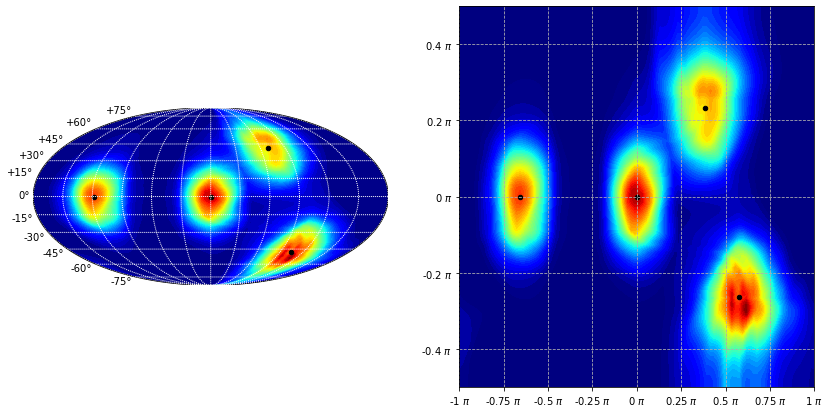

Epoch:11 batch id: 0
Epoch: 11/19, i/N: 0/400 with KL 0.02 and nll loss 1.80

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 11/19, i/N: 0/400 KL_test 0.0157163143157959 and nll_test 1.79679274559021

From current batch
Epoch: 11, i/N: 0/400 avg ldj from current batch 0.73

From 100000 uniform samples
Epoch: 11/19, i/N: 0/400 MC density sum 1.00
Epoch: 11/19, i/N: 0/400 avg ldj -1.27
#####################

Epoch: 11/19, i/N: 10/400 with KL 0.05 and nll loss 1.83
Epoch: 11/19, i/N: 20/400 with KL 0.02 and nll loss 1.80
Epoch: 11/19, i/N: 30/400 with KL -0.04 and nll loss 1.74
Epoch: 11/19, i/N: 40/400 with KL 0.05 and nll loss 1.83
Epoch: 11/19, i/N: 50/400 with KL -0.06 and nll loss 1.72
Epoch: 11/19, i/N: 60/400 with KL -0.03 and nll loss 1.76
Epoch: 11/19, i/N: 70/400 with KL -0.05 and nll loss 1.73
Epoch: 11/19, i/N: 80/400 with KL -0.01 and nll loss 1.77
Epoch: 11/19, i/N: 90/400 with KL 0.03 and nll loss 1.81
Epoch: 11/19, i/N: 10

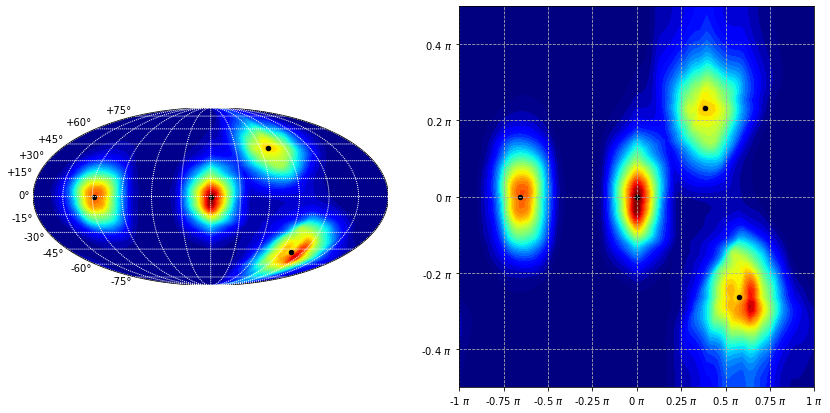

Epoch:12 batch id: 0
Epoch: 12/19, i/N: 0/400 with KL -0.03 and nll loss 1.75

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 12/19, i/N: 0/400 KL_test 0.013648509979248047 and nll_test 1.794724941253662

From current batch
Epoch: 12, i/N: 0/400 avg ldj from current batch 0.74

From 100000 uniform samples
Epoch: 12/19, i/N: 0/400 MC density sum 0.99
Epoch: 12/19, i/N: 0/400 avg ldj -1.26
#####################

Epoch: 12/19, i/N: 10/400 with KL -0.02 and nll loss 1.76
Epoch: 12/19, i/N: 20/400 with KL 0.02 and nll loss 1.80
Epoch: 12/19, i/N: 30/400 with KL 0.02 and nll loss 1.80
Epoch: 12/19, i/N: 40/400 with KL -0.04 and nll loss 1.74
Epoch: 12/19, i/N: 50/400 with KL 0.02 and nll loss 1.80
Epoch: 12/19, i/N: 60/400 with KL -0.00 and nll loss 1.78
Epoch: 12/19, i/N: 70/400 with KL 0.04 and nll loss 1.82
Epoch: 12/19, i/N: 80/400 with KL -0.09 and nll loss 1.69
Epoch: 12/19, i/N: 90/400 with KL 0.07 and nll loss 1.85
Epoch: 12/19, i/N:

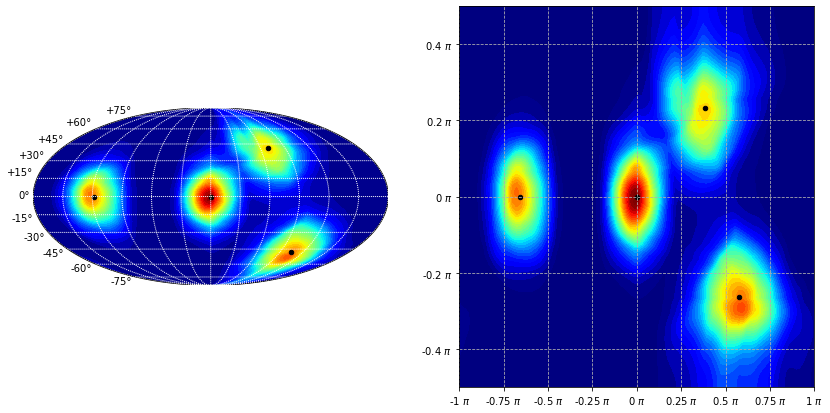

Epoch:13 batch id: 0
Epoch: 13/19, i/N: 0/400 with KL 0.01 and nll loss 1.79

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 13/19, i/N: 0/400 KL_test 0.02531564235687256 and nll_test 1.8063920736312866

From current batch
Epoch: 13, i/N: 0/400 avg ldj from current batch 0.72

From 100000 uniform samples
Epoch: 13/19, i/N: 0/400 MC density sum 1.00
Epoch: 13/19, i/N: 0/400 avg ldj -1.21
#####################

Epoch: 13/19, i/N: 10/400 with KL -0.00 and nll loss 1.78
Epoch: 13/19, i/N: 20/400 with KL 0.01 and nll loss 1.79
Epoch: 13/19, i/N: 30/400 with KL 0.04 and nll loss 1.82
Epoch: 13/19, i/N: 40/400 with KL 0.02 and nll loss 1.80
Epoch: 13/19, i/N: 50/400 with KL 0.04 and nll loss 1.82
Epoch: 13/19, i/N: 60/400 with KL 0.07 and nll loss 1.85
Epoch: 13/19, i/N: 70/400 with KL -0.02 and nll loss 1.76
Epoch: 13/19, i/N: 80/400 with KL -0.04 and nll loss 1.74
Epoch: 13/19, i/N: 90/400 with KL -0.05 and nll loss 1.74
Epoch: 13/19, i/N: 

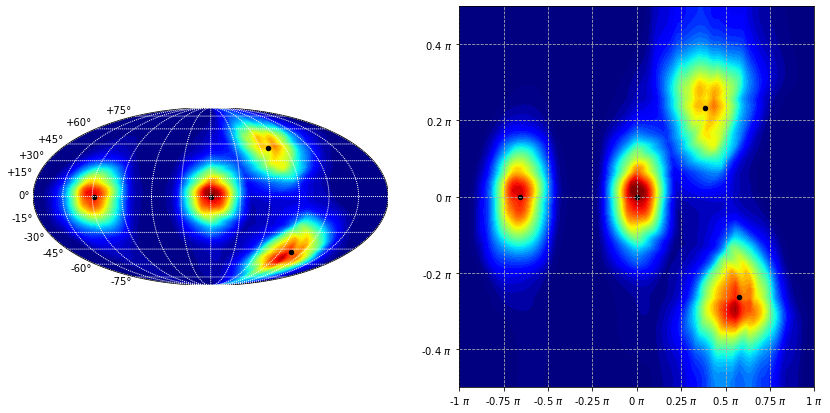

Epoch:14 batch id: 0
Epoch: 14/19, i/N: 0/400 with KL -0.01 and nll loss 1.77

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 14/19, i/N: 0/400 KL_test 0.018215298652648926 and nll_test 1.799291729927063

From current batch
Epoch: 14, i/N: 0/400 avg ldj from current batch 0.73

From 100000 uniform samples
Epoch: 14/19, i/N: 0/400 MC density sum 1.00
Epoch: 14/19, i/N: 0/400 avg ldj -1.14
#####################

Epoch: 14/19, i/N: 10/400 with KL 0.08 and nll loss 1.86
Epoch: 14/19, i/N: 20/400 with KL -0.06 and nll loss 1.72
Epoch: 14/19, i/N: 30/400 with KL -0.01 and nll loss 1.77
Epoch: 14/19, i/N: 40/400 with KL -0.05 and nll loss 1.73
Epoch: 14/19, i/N: 50/400 with KL 0.01 and nll loss 1.80
Epoch: 14/19, i/N: 60/400 with KL -0.01 and nll loss 1.77
Epoch: 14/19, i/N: 70/400 with KL -0.02 and nll loss 1.76
Epoch: 14/19, i/N: 80/400 with KL 0.04 and nll loss 1.82
Epoch: 14/19, i/N: 90/400 with KL 0.03 and nll loss 1.81
Epoch: 14/19, i/N

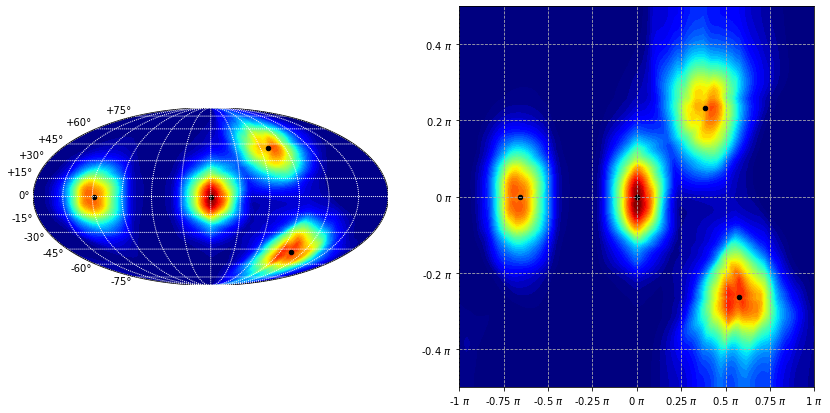

Epoch:15 batch id: 0
Epoch: 15/19, i/N: 0/400 with KL 0.04 and nll loss 1.82

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 15/19, i/N: 0/400 KL_test 0.012774467468261719 and nll_test 1.7938508987426758

From current batch
Epoch: 15, i/N: 0/400 avg ldj from current batch 0.74

From 100000 uniform samples
Epoch: 15/19, i/N: 0/400 MC density sum 0.99
Epoch: 15/19, i/N: 0/400 avg ldj -1.20
#####################

Epoch: 15/19, i/N: 10/400 with KL 0.03 and nll loss 1.81
Epoch: 15/19, i/N: 20/400 with KL -0.09 and nll loss 1.69
Epoch: 15/19, i/N: 30/400 with KL 0.04 and nll loss 1.82
Epoch: 15/19, i/N: 40/400 with KL 0.13 and nll loss 1.91
Epoch: 15/19, i/N: 50/400 with KL 0.01 and nll loss 1.79
Epoch: 15/19, i/N: 60/400 with KL 0.09 and nll loss 1.87
Epoch: 15/19, i/N: 70/400 with KL 0.06 and nll loss 1.84
Epoch: 15/19, i/N: 80/400 with KL 0.05 and nll loss 1.83
Epoch: 15/19, i/N: 90/400 with KL 0.04 and nll loss 1.82
Epoch: 15/19, i/N: 10

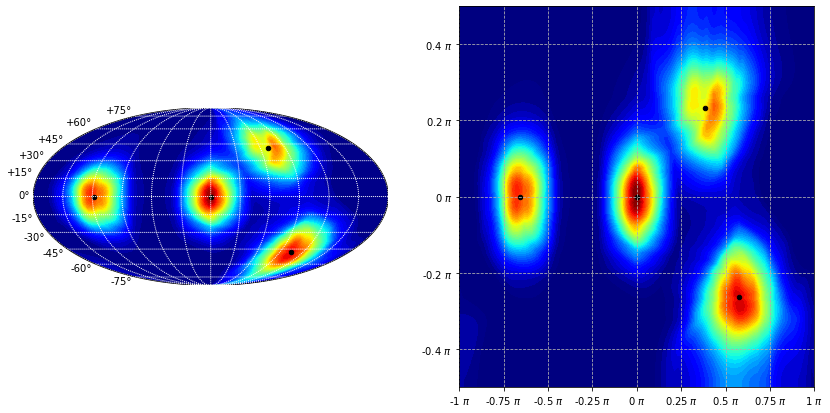

Epoch:16 batch id: 0
Epoch: 16/19, i/N: 0/400 with KL 0.02 and nll loss 1.80

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 16/19, i/N: 0/400 KL_test 0.013014554977416992 and nll_test 1.794090986251831

From current batch
Epoch: 16, i/N: 0/400 avg ldj from current batch 0.74

From 100000 uniform samples
Epoch: 16/19, i/N: 0/400 MC density sum 1.01
Epoch: 16/19, i/N: 0/400 avg ldj -1.21
#####################

Epoch: 16/19, i/N: 10/400 with KL -0.05 and nll loss 1.73
Epoch: 16/19, i/N: 20/400 with KL -0.03 and nll loss 1.75
Epoch: 16/19, i/N: 30/400 with KL 0.10 and nll loss 1.88
Epoch: 16/19, i/N: 40/400 with KL -0.03 and nll loss 1.75
Epoch: 16/19, i/N: 50/400 with KL -0.05 and nll loss 1.73
Epoch: 16/19, i/N: 60/400 with KL 0.08 and nll loss 1.86
Epoch: 16/19, i/N: 70/400 with KL 0.04 and nll loss 1.82
Epoch: 16/19, i/N: 80/400 with KL 0.01 and nll loss 1.79
Epoch: 16/19, i/N: 90/400 with KL -0.05 and nll loss 1.73
Epoch: 16/19, i/N:

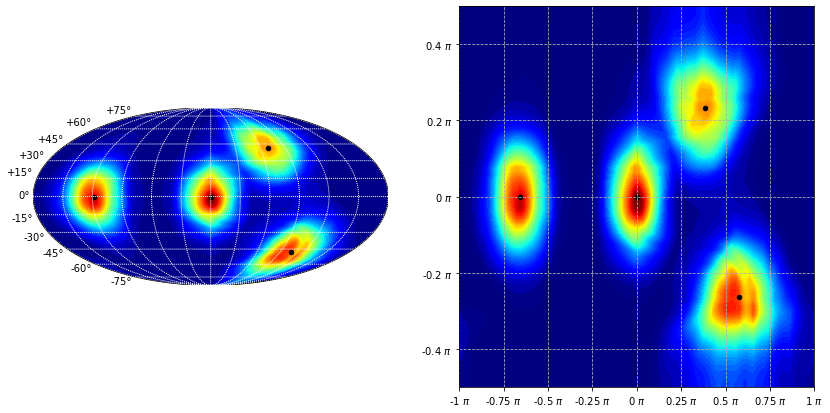

Epoch:17 batch id: 0
Epoch: 17/19, i/N: 0/400 with KL 0.05 and nll loss 1.83

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 17/19, i/N: 0/400 KL_test 0.012425899505615234 and nll_test 1.7935023307800293

From current batch
Epoch: 17, i/N: 0/400 avg ldj from current batch 0.74

From 100000 uniform samples
Epoch: 17/19, i/N: 0/400 MC density sum 1.00
Epoch: 17/19, i/N: 0/400 avg ldj -1.14
#####################

Epoch: 17/19, i/N: 10/400 with KL 0.05 and nll loss 1.83
Epoch: 17/19, i/N: 20/400 with KL 0.00 and nll loss 1.78
Epoch: 17/19, i/N: 30/400 with KL 0.04 and nll loss 1.82
Epoch: 17/19, i/N: 40/400 with KL 0.00 and nll loss 1.78
Epoch: 17/19, i/N: 50/400 with KL 0.05 and nll loss 1.83
Epoch: 17/19, i/N: 60/400 with KL 0.04 and nll loss 1.82
Epoch: 17/19, i/N: 70/400 with KL 0.02 and nll loss 1.81
Epoch: 17/19, i/N: 80/400 with KL -0.02 and nll loss 1.76
Epoch: 17/19, i/N: 90/400 with KL -0.05 and nll loss 1.74
Epoch: 17/19, i/N: 1

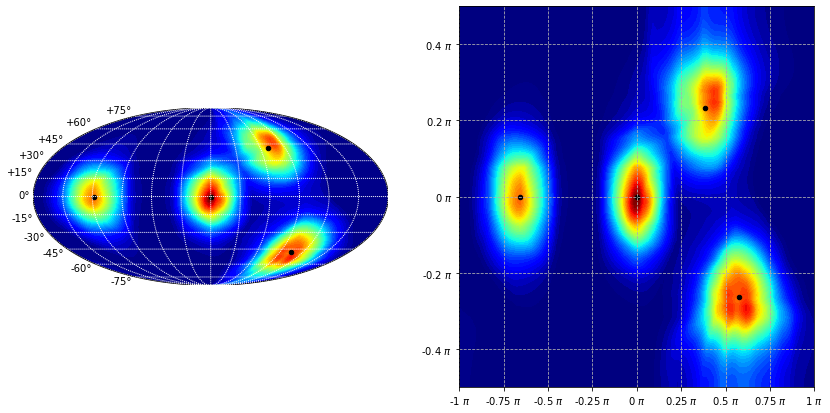

Epoch:18 batch id: 0
Epoch: 18/19, i/N: 0/400 with KL 0.08 and nll loss 1.86

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 18/19, i/N: 0/400 KL_test 0.010614156723022461 and nll_test 1.7916905879974365

From current batch
Epoch: 18, i/N: 0/400 avg ldj from current batch 0.74

From 100000 uniform samples
Epoch: 18/19, i/N: 0/400 MC density sum 1.00
Epoch: 18/19, i/N: 0/400 avg ldj -1.21
#####################

Epoch: 18/19, i/N: 10/400 with KL -0.01 and nll loss 1.77
Epoch: 18/19, i/N: 20/400 with KL 0.08 and nll loss 1.86
Epoch: 18/19, i/N: 30/400 with KL 0.06 and nll loss 1.84
Epoch: 18/19, i/N: 40/400 with KL -0.00 and nll loss 1.78
Epoch: 18/19, i/N: 50/400 with KL 0.05 and nll loss 1.83
Epoch: 18/19, i/N: 60/400 with KL 0.06 and nll loss 1.84
Epoch: 18/19, i/N: 70/400 with KL 0.07 and nll loss 1.85
Epoch: 18/19, i/N: 80/400 with KL 0.01 and nll loss 1.80
Epoch: 18/19, i/N: 90/400 with KL -0.10 and nll loss 1.68
Epoch: 18/19, i/N: 

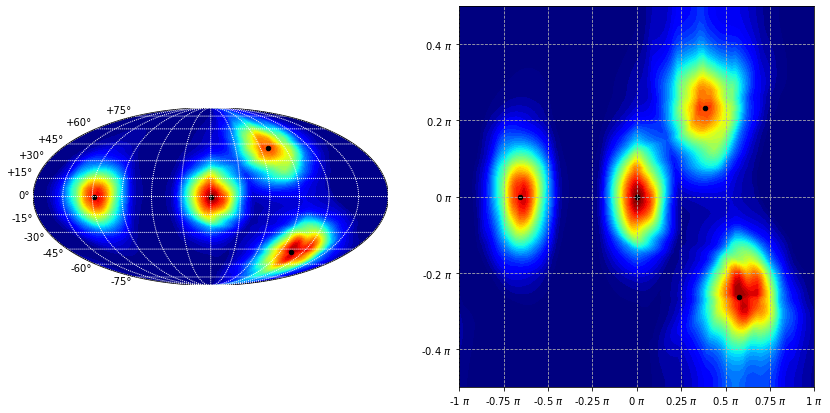

Epoch:19 batch id: 0
Epoch: 19/19, i/N: 0/400 with KL 0.03 and nll loss 1.81

#### EVALUATION ####
Evaluation based on 100000 data points from data distribution samples
Epoch: 19/19, i/N: 0/400 KL_test 0.013069391250610352 and nll_test 1.7941458225250244

From current batch
Epoch: 19, i/N: 0/400 avg ldj from current batch 0.74

From 100000 uniform samples
Epoch: 19/19, i/N: 0/400 MC density sum 1.00
Epoch: 19/19, i/N: 0/400 avg ldj -1.19
#####################

Epoch: 19/19, i/N: 10/400 with KL 0.04 and nll loss 1.82
Epoch: 19/19, i/N: 20/400 with KL -0.01 and nll loss 1.77
Epoch: 19/19, i/N: 30/400 with KL 0.03 and nll loss 1.81
Epoch: 19/19, i/N: 40/400 with KL 0.10 and nll loss 1.88
Epoch: 19/19, i/N: 50/400 with KL 0.02 and nll loss 1.80
Epoch: 19/19, i/N: 60/400 with KL -0.02 and nll loss 1.76
Epoch: 19/19, i/N: 70/400 with KL -0.07 and nll loss 1.71
Epoch: 19/19, i/N: 80/400 with KL 0.05 and nll loss 1.83
Epoch: 19/19, i/N: 90/400 with KL -0.03 and nll loss 1.75
Epoch: 19/19, i/N:

In [ ]:
cyl_spline = Cylindrical_Flow(num_flows=NUM_FLOWS_CYL,
                                 num_bins=NUM_BINS,
                                 flow_type= 'spline',
                                 num_dim_data = NUM_DIM_DATA)

cyl_spline.to(device)

optimizer = optim.AdamW(cyl_spline.parameters(), lr=lr, weight_decay=weight_decay)

print('##### Cylindrical Spline Flow #####')

train_model(model = cyl_spline, 
            optimizer = optimizer,
            dataset = power_spherical_data,
            config = config,
            model_name='ar_cyl_s')


### Coupling Cylindrical Moebius flow

In [ ]:
cyl_moeb = Cylindrical_Flow(num_flows=NUM_FLOWS_COU,
                                 num_bins=NUM_BINS, 
                                 flow_type='moebius',
                                 num_dim_data=NUM_DIM_DATA, 
                                 mask_type='coupling',
                                 num_centers=NUM_CENTERS)

cyl_moeb.to(device)

optimizer = optim.AdamW(cyl_moeb.parameters(), lr=lr, weight_decay=weight_decay)

print('##### Coupling Cylindrical Moebius Flow #####')

train_model(model = cyl_moeb, 
            optimizer = optimizer,
            dataset = power_spherical_data,
            config = config,
            model_name='cou_cyl_m')


### Coupling Cylindrical Spline flow

In [ ]:
cyl_spline = Cylindrical_Flow(num_flows=NUM_FLOWS_COU,
                                 num_bins=NUM_BINS, 
                                 flow_type='spline',
                                 num_dim_data=NUM_DIM_DATA, 
                                 mask_type='coupling',
                                 num_centers=NUM_CENTERS)

cyl_spline.to(device)

optimizer = optim.AdamW(cyl_spline.parameters(), lr=lr, weight_decay=weight_decay)

print('##### Coupling Cylindrical Spline Flow #####')

train_model(model = cyl_spline, 
            optimizer = optimizer,
            dataset = power_spherical_data,
            config = config,
            model_name='cou_cyl_s')
